| **Columna**        | **Descripción**                                                                     |
| ------------------ | ----------------------------------------------------------------------------------- |
| `Id`               | Identificador único del vehículo (interno del dataset).                             |
| `Model`            | Modelo del vehículo (en este caso, todos parecen ser "TOYOTA Corolla").             |
| `Price`            | Precio de venta del vehículo en euros (€).                                          |
| `Age_08_04`        | Edad del vehículo en meses al 08/2004 (agosto de 2004).                             |
| `Mfg_Month`        | Mes de fabricación.                                                                 |
| `Mfg_Year`         | Año de fabricación.                                                                 |
| `KM`               | Kilometraje del vehículo (en kilómetros).                                           |
| `Fuel_Type`        | Tipo de combustible (`Petrol`, `Diesel` o `CNG`).                                   |
| `HP`               | Potencia del motor en caballos de fuerza (horsepower).                              |
| `Met_Color`        | Si el vehículo tiene pintura metalizada (1 = sí, 0 = no).                           |
| `Color`            | Color del vehículo.                                                                 |
| `Automatic`        | Si el vehículo es automático (1 = sí, 0 = no).                                      |
| `CC`               | Cilindrada del motor en centímetros cúbicos (cubic centimeters).                    |
| `Doors`            | Número de puertas.                                                                  |
| `Cylinders`        | Número de cilindros del motor.                                                      |
| `Gears`            | Número de marchas (velocidades de transmisión).                                     |
| `Quarterly_Tax`    | Impuesto trimestral que se paga por el vehículo (en euros).                         |
| `Weight`           | Peso del vehículo en kilogramos.                                                    |
| `Mfr_Guarantee`    | Si tiene garantía del fabricante (1 = sí, 0 = no).                                  |
| `BOVAG_Guarantee`  | Garantía de la asociación BOVAG (en Países Bajos) (1 = sí, 0 = no).                 |
| `Guarantee_Period` | Período de garantía restante (en meses).                                            |
| `ABS`              | Si tiene sistema antibloqueo de frenos (Anti-lock Braking System) (1 = sí, 0 = no). |
| `Airbag_1`         | Airbag para el conductor (1 = sí, 0 = no).                                          |
| `Airbag_2`         | Airbag para el acompañante (1 = sí, 0 = no).                                        |
| `Airco`            | Si tiene aire acondicionado (1 = sí, 0 = no).                                       |
| `Automatic_airco`  | Aire acondicionado automático (1 = sí, 0 = no).                                     |
| `Boardcomputer`    | Si tiene computadora de a bordo (1 = sí, 0 = no).                                   |
| `CD_Player`        | Si tiene reproductor de CD (1 = sí, 0 = no).                                        |
| `Central_Lock`     | Si tiene cierre centralizado (1 = sí, 0 = no).                                      |
| `Powered_Windows`  | Si tiene levantavidrios eléctricos (1 = sí, 0 = no).                                |
| `Power_Steering`   | Dirección asistida (1 = sí, 0 = no).                                                |
| `Radio`            | Si tiene radio (1 = sí, 0 = no).                                                    |
| `Mistlamps`        | Si tiene luces antiniebla (1 = sí, 0 = no).                                         |
| `Sport_Model`      | Si es versión deportiva (1 = sí, 0 = no).                                           |
| `Backseat_Divider` | Si el asiento trasero es divisible/abatible (1 = sí, 0 = no).                       |
| `Metallic_Rim`     | Si tiene llantas metálicas (1 = sí, 0 = no).                                        |
| `Radio_cassette`   | Si tiene radio con cassette (1 = sí, 0 = no).                                       |
| `Tow_Bar`          | Si tiene gancho de remolque (1 = sí, 0 = no).                                       |


In [239]:
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [240]:
from helpers import histogram,boxplot,scatter_plot , limpiar_outliers_iqr , limpiar_outliers_z_core,resumen_outliers , histogram_por_lotes , boxplots_por_lotes ,bar_por_lotes,mostrar_matriz_correlacion ,pares_correlacion_altas,scatter_por_lotes ,split ,filtrar_columna_por_rango ,obtener_correlaciones_target ,correlacion_significativa


# Carga de datos

In [241]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



url = "https://raw.githubusercontent.com/dodobeatle/dataeng-datos/refs/heads/main/ToyotaCorolla.csv"
df_toyota = pd.read_csv(url)
df_toyota.head(10)
df_toyota.columns = [
    col.strip().lower().replace(' ', '_') for col in df_toyota.columns
]


In [149]:
df_toyota.head(10)

,id,model,price,age_08_04,mfg_month,mfg_year,km,fuel_type,hp,met_color,...,central_lock,powered_windows,power_steering,radio,mistlamps,sport_model,backseat_divider,metallic_rim,radio_cassette,tow_bar
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13500,23,10,2002,46986,Diesel,90,1,...,1,1,1,0,0,0,1,0,0,0
1,2,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13750,23,10,2002,72937,Diesel,90,1,...,1,0,1,0,0,0,1,0,0,0
2,3,?TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13950,24,9,2002,41711,Diesel,90,1,...,0,0,1,0,0,0,1,0,0,0
3,4,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,14950,26,7,2002,48000,Diesel,90,0,...,0,0,1,0,0,0,1,0,0,0
4,5,TOYOTA Corolla 2.0 D4D HATCHB SOL 2/3-Doors,13750,30,3,2002,38500,Diesel,90,0,...,1,1,1,0,1,0,1,0,0,0
5,6,TOYOTA Corolla 2.0 D4D HATCHB SOL 2/3-Doors,12950,32,1,2002,61000,Diesel,90,0,...,1,1,1,0,1,0,1,0,0,0
6,7,?TOYOTA Corolla 2.0 D4D 90 3DR TERRA 2/3-Doors,16900,27,6,2002,94612,Diesel,90,1,...,1,1,1,0,0,1,1,0,0,0
7,8,TOYOTA Corolla 2.0 D4D 90 3DR TERRA 2/3-Doors,18600,30,3,2002,75889,Diesel,90,1,...,1,1,1,0,0,0,1,0,0,0
8,9,?TOYOTA Corolla 1800 T SPORT VVT I 2/3-Doors,21500,27,6,2002,19700,Petrol,192,0,...,1,1,1,1,0,0,0,1,1,0
9,10,?TOYOTA Corolla 1.9 D HATCHB TERRA 2/3-Doors,12950,23,10,2002,71138,Diesel,69,0,...,0,0,1,0,0,0,1,0,0,0


In [150]:
df_toyota.shape

(1436, 37)

In [151]:
df_toyota.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1436 entries, 0 to 1435
Data columns (total 37 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                1436 non-null   int64 
 1   model             1436 non-null   object
 2   price             1436 non-null   int64 
 3   age_08_04         1436 non-null   int64 
 4   mfg_month         1436 non-null   int64 
 5   mfg_year          1436 non-null   int64 
 6   km                1436 non-null   int64 
 7   fuel_type         1436 non-null   object
 8   hp                1436 non-null   int64 
 9   met_color         1436 non-null   int64 
 10  automatic         1436 non-null   int64 
 11  cc                1436 non-null   int64 
 12  doors             1436 non-null   int64 
 13  cylinders         1436 non-null   int64 
 14  gears             1436 non-null   int64 
 15  quarterly_tax     1436 non-null   int64 
 16  weight            1436 non-null   int64 
 17  mfr_guarantee 

In [152]:
df_toyota.describe()

,id,price,age_08_04,mfg_month,mfg_year,km,hp,met_color,automatic,cc,...,central_lock,powered_windows,power_steering,radio,mistlamps,sport_model,backseat_divider,metallic_rim,radio_cassette,tow_bar
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.00000,...,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000
mean,721.555014,10730.824513,55.947075,5.548747,1999.625348,68533.259749,101.502089,0.674791,0.055710,1576.85585,...,0.580084,0.561978,0.977716,0.146240,0.256964,0.300139,0.770195,0.204735,0.145543,0.277855
std,416.476890,3626.964585,18.599988,3.354085,1.540722,37506.448872,14.981080,0.468616,0.229441,424.38677,...,0.493717,0.496317,0.147657,0.353469,0.437111,0.458478,0.420854,0.403649,0.352770,0.448098
min,1.000000,4350.000000,1.000000,1.000000,1998.000000,1.000000,69.000000,0.000000,0.000000,1300.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,361.750000,8450.000000,44.000000,3.000000,1998.000000,43000.000000,90.000000,0.000000,0.000000,1400.00000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,721.500000,9900.000000,61.000000,5.000000,1999.000000,63389.500000,110.000000,1.000000,0.000000,1600.00000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,1081.250000,11950.000000,70.000000,8.000000,2001.000000,87020.750000,110.000000,1.000000,0.000000,1600.00000,...,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1442.000000,32500.000000,80.000000,12.000000,2004.000000,243000.000000,192.000000,1.000000,1.000000,16000.00000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# Limpieza de datos

## Eliminar columnas innecesarias

nuestro objetivo es crear un modelo de regresion liineal que nos permita predecir el precio de los autos toyota corolla en base a unas determinadas caracteristicas. por lo tanto a priori tenemos dos columnas innecesarias a simple vista que son:

1. id
2. model

In [242]:
df_toyota.drop(columns=['id','model'], axis=1, inplace=True)


## Verificacion de valores nulos

linea de codigo para identificar valores nulos

In [243]:
df_toyota.isnull().values.any()

np.False_

no se encuentran valores nulos en el dataframe

## Datos invalidos

Verificacion de valores negativos en donde no tiene que haber valores neagtivos

In [244]:
# Seleccionar columnas numéricas
numeric_df = df_toyota.select_dtypes(include='number')

# Verificar si hay valores negativos
negativos_bool = (numeric_df < 0).any()

# Convertir a DataFrame con nombre de columna y booleano
negativos_df = negativos_bool.reset_index()
negativos_df.columns = ['columna', 'tiene_valores_negativos']

# Mostrar el resultado
negativos_df

,columna,tiene_valores_negativos
0,price,False
1,age_08_04,False
2,mfg_month,False
3,mfg_year,False
4,km,False
5,hp,False
6,met_color,False
7,automatic,False
8,cc,False
9,doors,False


se verifico que:

-  la columna `mfr_year` se mueve valores validos
-  la columna `mfr_month` se mueve valores validos



## Datos incositentes

Se detectó una inconsistencia en la columna `age_08_04`, que representa la edad del vehículo (en meses) a la fecha 08/2004.

La edad se recalculó según la fórmula:


$\text{Edad (en meses)} = (2004 - \text{Año de fabricación}) \times 12 - (\text{Mes de fabricación} - 8)$

luego se compara la edad calculada con la edad registrada:

- Cantidad de coincidencias exactas: **0**
- Cantidad de registros con diferencias: **1435**
- Diferencias distintas de 1 mes: **1435**

esto indica que **todas las edades están desplazadas exactamente por un mes**, posiblemente debido a una convención de cálculo distinta.

Por lo tanto, se decide crear una nueva columna `age_08_04_calculada` con los valores corregidos e

In [245]:
calculo_de_edad = (2004 - df_toyota['mfg_year'])*12 - (df_toyota['mfg_month']-8)

coincidencia = calculo_de_edad == df_toyota['age_08_04']
print('si coincide',len(coincidencia[coincidencia == True]))
print('no coincide',len(coincidencia[coincidencia == False]))

si coincide 0
no coincide 1436


In [246]:
diferencia_edad =abs(calculo_de_edad - df_toyota['age_08_04'])
print(diferencia_edad)
diferencia_edad_filtro = diferencia_edad[diferencia_edad  != 1]
print('diferencias distinta de 1:',len(diferencia_edad_filtro))

0       1
1       1
2       1
3       1
4       1
       ..
1431    1
1432    1
1433    1
1434    1
1435    1
Length: 1436, dtype: int64
diferencias distinta de 1: 0


por lo tanto cambiamos los valores reales

In [247]:
df_toyota['age_08_04_calculada'] = calculo_de_edad
df_toyota.drop(columns=['age_08_04'], axis=1, inplace=True)

In [248]:
df_toyota.head(10)

,price,mfg_month,mfg_year,km,fuel_type,hp,met_color,automatic,cc,doors,...,powered_windows,power_steering,radio,mistlamps,sport_model,backseat_divider,metallic_rim,radio_cassette,tow_bar,age_08_04_calculada
0,13500,10,2002,46986,Diesel,90,1,0,2000,3,...,1,1,0,0,0,1,0,0,0,22
1,13750,10,2002,72937,Diesel,90,1,0,2000,3,...,0,1,0,0,0,1,0,0,0,22
2,13950,9,2002,41711,Diesel,90,1,0,2000,3,...,0,1,0,0,0,1,0,0,0,23
3,14950,7,2002,48000,Diesel,90,0,0,2000,3,...,0,1,0,0,0,1,0,0,0,25
4,13750,3,2002,38500,Diesel,90,0,0,2000,3,...,1,1,0,1,0,1,0,0,0,29
5,12950,1,2002,61000,Diesel,90,0,0,2000,3,...,1,1,0,1,0,1,0,0,0,31
6,16900,6,2002,94612,Diesel,90,1,0,2000,3,...,1,1,0,0,1,1,0,0,0,26
7,18600,3,2002,75889,Diesel,90,1,0,2000,3,...,1,1,0,0,0,1,0,0,0,29
8,21500,6,2002,19700,Petrol,192,0,0,1800,3,...,1,1,1,0,0,0,1,1,0,26
9,12950,10,2002,71138,Diesel,69,0,0,1900,3,...,0,1,0,0,0,1,0,0,0,22


## Datos duplicados

algoritmo para hallar `registros duplicados`

In [249]:
def duplicados_con_indices(df):
    resultado = []

    for i in range(len(df)):
        fila_actual = df.iloc[i]
        duplicado_en = False

        for j in range(i):
            if df.iloc[j].equals(fila_actual):
                duplicado_en = j
                break

        resultado.append({'Fila': i, 'Duplicado_de': duplicado_en})

    # Convertir la lista de resultados en un DataFrame
    df_resultado = pd.DataFrame(resultado)
    return df_resultado


df_re = duplicados_con_indices(df_toyota)


`deteccion de valores duplicados dos filas` 

In [250]:
df_re = df_re[df_re['Duplicado_de'] != False]
df_re

,Fila,Duplicado_de
113,113,112


`eliminamos la 113`

In [251]:
df_toyota.drop(113,inplace=True)

La columna `cylinders` tiene todas sus ocurrencias iguales 4 por lo tanto borramos dicha columna ya que no aporta nada

In [252]:
columnas_cte = df_toyota.columns[df_toyota.nunique() == 1]
print("Columnas constantes:", columnas_cte.tolist())

Columnas constantes: ['cylinders']


In [253]:
df_toyota.drop(columns='cylinders', axis=1, inplace=True)

## Outliers

Visualizacion de la cantidad de outliers para cada columna con el criterio **IQR y Z-CORE**

In [254]:
resumen = resumen_outliers(df_toyota)
resumen

,Outliers_IQR,Outliers_Zscore
price,109,100
mfg_month,0,0
mfg_year,0,98
km,49,64
hp,11,46
met_color,0,0
automatic,80,80
cc,122,1
doors,0,2
gears,46,46


## Cambio de tipo de dato

In [255]:
tipos_columnas = {

    'price': 'float32',
    'age_08_04_calculada': 'int8',
    'mfg_month': 'int8',
    'mfg_year': 'int16',
    'km': 'float32',
    'fuel_type': 'category',
    'hp': 'int16',
    'met_color': 'int8',
    'automatic': 'int8',
    'cc': 'int16',
    'doors': 'int8',
    'gears': 'int8',
    'quarterly_tax': 'float32',
    'weight': 'float16',
    'mfr_guarantee': 'int8',
    'bovag_guarantee': 'int8',
    'guarantee_period': 'int8',
    'abs': 'int8',
    'airbag_1': 'int8',
    'airbag_2': 'int8',
    'airco': 'int8',
    'automatic_airco': 'int8',
    'boardcomputer': 'int8',
    'cd_player': 'int8',
    'central_lock': 'int8',
    'powered_windows': 'int8',
    'power_steering': 'int8',
    'radio': 'int8',
    'mistlamps': 'int8',
    'sport_model': 'int8',
    'backseat_divider': 'int8',
    'metallic_rim': 'int8',
    'radio_cassette': 'int8',
    'tow_bar': 'int8'
}

# Aplicar los cambios al DataFrame
df_toyota = df_toyota.astype(tipos_columnas)



# Analisis Univariado

## Variables continuas Consideradas

En este análisis, las variables continuas que hemos identificado y considerado son:

1. `Price`: Precio de venta del vehículo en euros (€).

2. `Quarterly_Tax`: Impuesto cuatrimestral que se paga por el vehículo (en euros).

3. `Weight`: Peso del vehículo en kilogramos.

4. `KM`: Kilometraje del vehículo (en kilómetros).

5. `cc`: cilndrada del motor

Extraemos las variables continuas 

In [256]:
df_toyota_continuas = df_toyota[['price', 'quarterly_tax', 'weight', 'km','cc']].copy()


Visualizamos BoxPlots e Histogramas con sus cirva de densidad

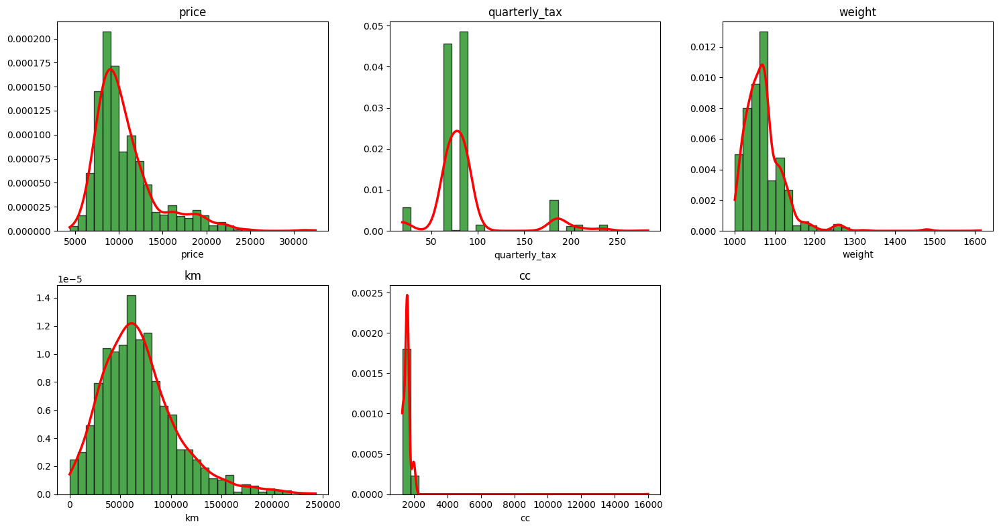

In [257]:
histogram_por_lotes(df_toyota_continuas,6)

Index(['price', 'quarterly_tax', 'weight', 'km', 'cc'], dtype='object')


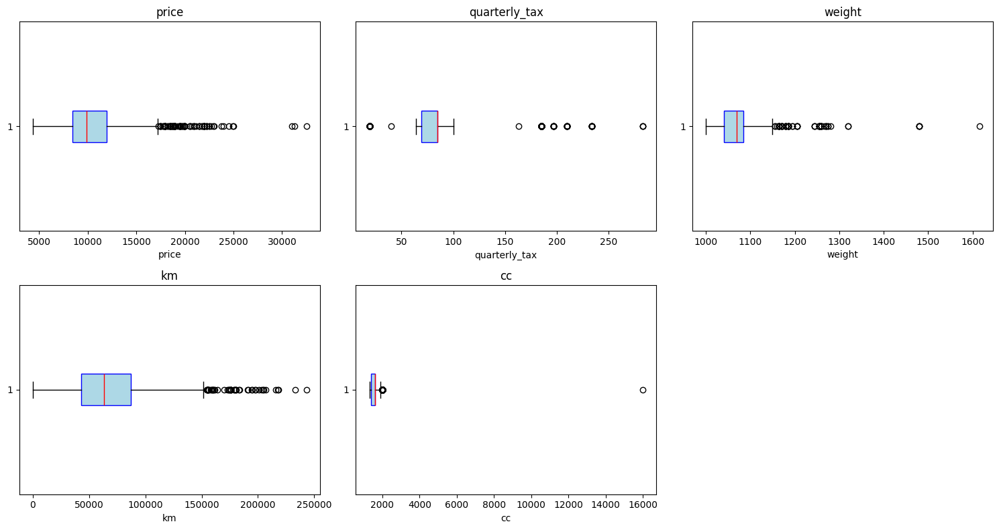

In [258]:
boxplots_por_lotes(df_toyota_continuas,6)

1. `Price (Precio)`

- Boxplot: Se observan varios valores atípicos (outliers) a la derecha, lo que indica que hay autos con precios mucho más altos que la mayoría.

- Histograma: La distribución es sesgada a la derecha, con una mayoría de autos en un rango de precios más bajos y unos pocos muy caros.

- Interpretación: La variable tiene una dispersión amplia y algunos autos que pueden ser considerados premium o muy costosos debido a funciones adicionales que el mismo lleva como ser `direccion asistida`.

2. `Quarterly Tax (Impuesto Trimestral)`

- Boxplot: También se observan outliers pero menos pronunciados que en el precio.

- Histograma: La mayoría de los autos pagan un impuesto relativamente bajo, con algunos pocos con impuestos altos.

- Interpretación: La mayoría de los autos tienen un impuesto trimestral bajo, probablemente relacionado  con algunos autos más costosos o potentes que pagan más.

3. `Weight (Peso)`

- Boxplot: Se ven outliers a la derecha, pero la mayoría de autos tienen pesos relativamente similares.

- Histograma: La distribución está más concentrada en un rango estrecho, con algunos autos más pesados.

- Interpretación: La mayoría de los autos tienen pesos iguales, pero hay algunos modelos más pesados.

4. `Km (Kilometraje)`

- Boxplot: Se observan varios outliers con kilometrajes muy altos.

- Histograma: La distribución está sesgada a la derecha, con muchos autos con bajo kilometraje y unos pocos con kilometrajes muy altos.

- Interpretación: Hay autos con poca circulación y algunos con mucho uso, lo cual es importante considerar para análisis del precio.

5. `cc (cilindrado del motor)`

- Boxplot: se obsevar outliers muy cerca del maximo del cojunto de datos pero hay uno que esta muy alejado 

- Histograma: la distribucion esta extramadamente sesgada hacia la derecha por culpa del outlier que esta muy alejado

- Interpretacion: autos con motor de bajo cilindro y hay un auto con un motor que tiene mucho cilindrado

En resumen:

- Las cuatro variables muestran distribuciones sesgadas, con presencia de valores atípicos.

- Esto sugiere que se podría considerar transformación o limpieza de outliers para análisis posteriores.

- Se debe considerar borrar la variable `weight` puesto que no se ve relevante para predecir un precio

- importante analizar la variable `price` , `km` y `quartely tax` con las binarias para obtener conclusiones mas precisas.

- importante eliminar el outlier de `cc` ya que podria causar problemas a la hora de entrenar el modelo, si se la considera como predictora.

## Variables Enteras

In [259]:
df_toyota_enteras = df_toyota.copy()

In [260]:
df_toyota_enteras.drop(columns=['price', 'quarterly_tax', 'weight', 'km','cc','mfr_guarantee', 'bovag_guarantee', 'abs', 'airbag_1', 'airbag_2', 'airco', 'automatic_airco', 'boardcomputer', 'cd_player', 'central_lock', 'met_color','powered_windows', 'power_steering', 'radio', 'mistlamps', 'sport_model', 'backseat_divider', 'metallic_rim', 'radio_cassette', 'tow_bar' , 'age_08_04_calculada','fuel_type','automatic'
], axis=1,inplace=True)


In [261]:
df_toyota_enteras.describe()

,mfg_month,mfg_year,hp,doors,gears,guarantee_period
count,1435.000000,1435.00000,1435.000000,1435.000000,1435.000000,1435.000000
mean,5.551916,1999.62230,101.491986,4.032753,5.026481,3.816028
std,3.353102,1.53692,14.981408,0.952667,0.188575,3.011997
min,1.000000,1998.00000,69.000000,2.000000,3.000000,3.000000
25%,3.000000,1998.00000,90.000000,3.000000,5.000000,3.000000
50%,5.000000,1999.00000,110.000000,4.000000,5.000000,3.000000
75%,8.000000,2001.00000,110.000000,5.000000,5.000000,3.000000
max,12.000000,2004.00000,192.000000,5.000000,6.000000,36.000000


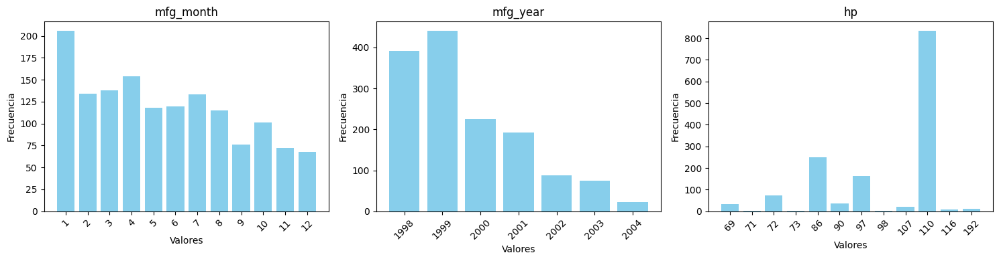

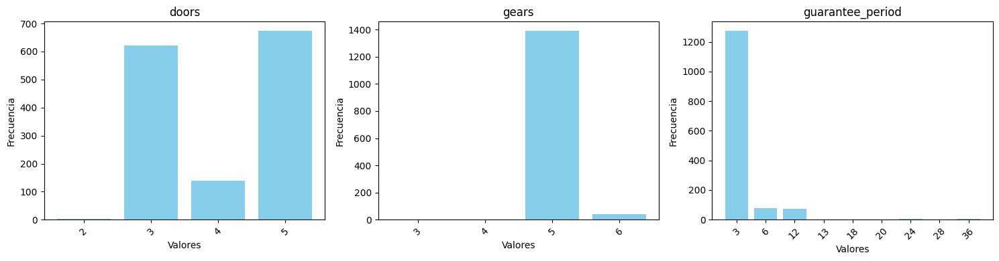

In [262]:
bar_por_lotes(df_toyota_enteras,3)

Index(['mfg_month', 'mfg_year', 'hp', 'doors', 'gears', 'guarantee_period'], dtype='object')


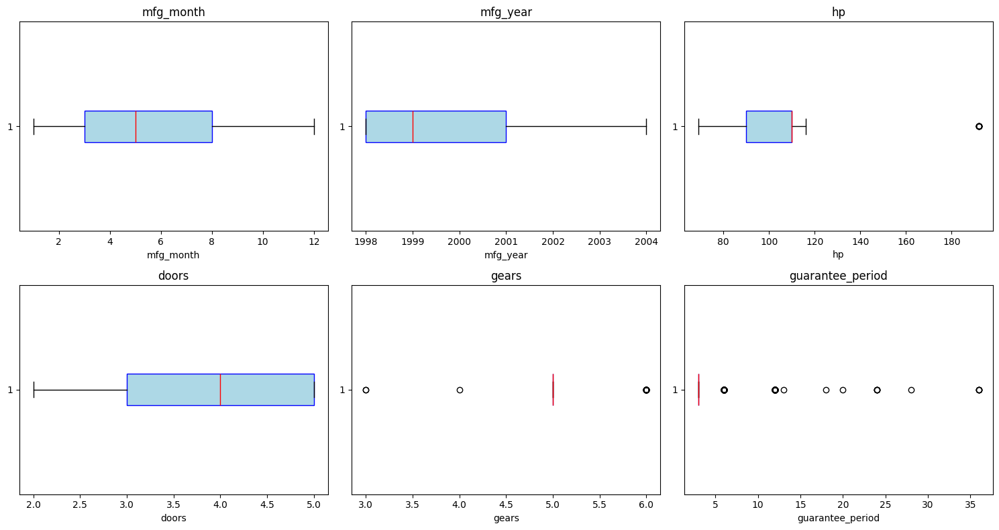

In [263]:
boxplots_por_lotes(df_toyota_enteras,6)

In [264]:
# Calcular varianza para todas las columnas numéricas
varianzas = df_toyota_enteras.var()

# Convertir a DataFrame para mejor visualización
tabla_varianza = varianzas.reset_index()
tabla_varianza.columns = ['columna', 'varianza']

# Ordenar de menor a mayor varianza
tabla_varianza = tabla_varianza.sort_values(by='varianza')

# Mostrar tabla
print(tabla_varianza)

            columna    varianza
4             gears    0.035560
3             doors    0.907574
1          mfg_year    2.362124
5  guarantee_period    9.072128
0         mfg_month   11.243293
2                hp  224.442579


Para Analisis posteriores se debe considerar eliminar `Gears` y `Doors` ya que poseen muy poca variabilidad en los datos 

## Variables binarias

Seleccion las variables binarias

In [265]:
df_toyota_binarias = df_toyota.copy()

columns_to_keep = [
    'mfr_guarantee', 'bovag_guarantee', 'abs', 'airbag_1', 'airbag_2', 'airco',
    'automatic_airco', 'boardcomputer', 'cd_player', 'central_lock',
    'powered_windows', 'power_steering', 'radio', 'mistlamps', 'sport_model',
    'backseat_divider', 'metallic_rim', 'radio_cassette', 'tow_bar','met_color','automatic'
]

df_toyota_binarias = df_toyota_binarias[columns_to_keep]

Contamos cuantos 0 y 1 hay por cada variable 

In [266]:
binary_cols = [col for col in df_toyota_binarias.columns if set(df_toyota_binarias[col].dropna().unique()) <= {0, 1}]

resumen = pd.DataFrame({
    'ceros': df_toyota_binarias[binary_cols].apply(lambda x: (x == 0).sum()),
    'unos': df_toyota_binarias[binary_cols].apply(lambda x: (x == 1).sum())
})

print(resumen)

                  ceros  unos
mfr_guarantee       847   588
bovag_guarantee     149  1286
abs                 268  1167
airbag_1             42  1393
airbag_2            398  1037
airco               706   729
automatic_airco    1355    80
boardcomputer      1012   423
cd_player          1122   313
central_lock        603   832
powered_windows     629   806
power_steering       32  1403
radio              1225   210
mistlamps          1066   369
sport_model        1004   431
backseat_divider    329  1106
metallic_rim       1141   294
radio_cassette     1226   209
tow_bar            1036   399
met_color           467   968
automatic          1355    80


Mediente un umbral de 90% vamos a tomar para eliminar dichas variables que esten muy desbalancedas

In [267]:
umbral = 0.90  
columnas_a_borrar = []

for col in resumen.index:
    total = resumen.loc[col].sum()
    max_val = resumen.loc[col].max()
    if max_val / total > umbral:
        columnas_a_borrar.append(col)

print("Columnas a eliminar por desbalance:", columnas_a_borrar)


Columnas a eliminar por desbalance: ['airbag_1', 'automatic_airco', 'power_steering', 'automatic']


In [268]:
df_toyota_binarias.drop(columns=columnas_a_borrar, axis=1, inplace=True)

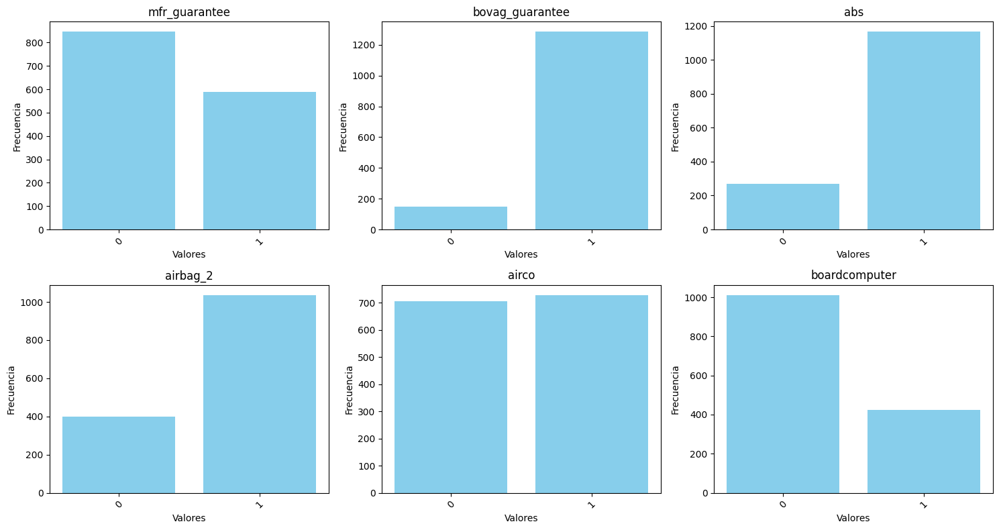

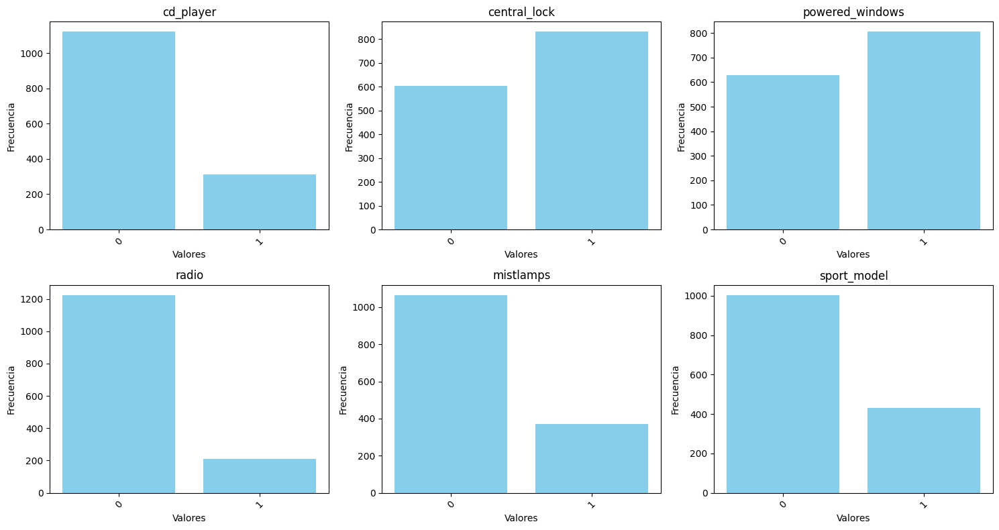

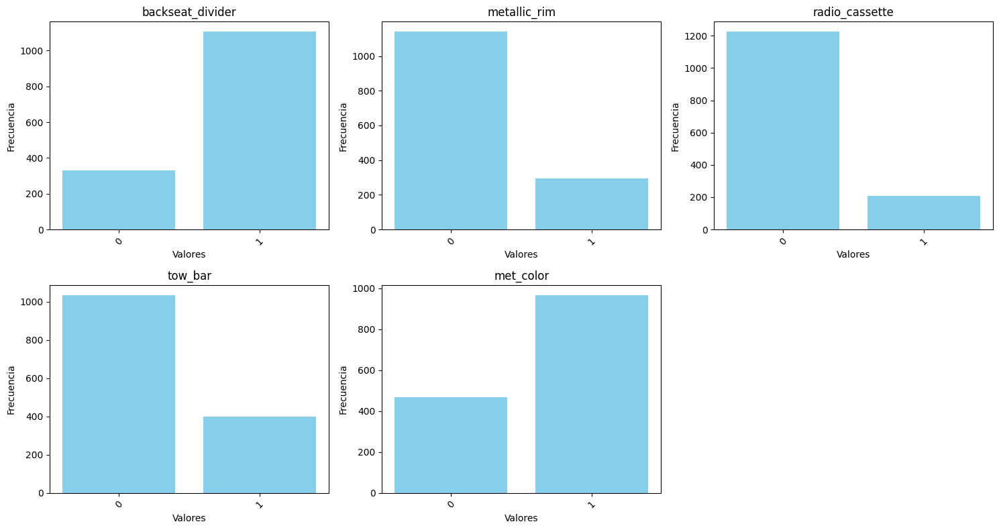

In [269]:
bar_por_lotes(df_toyota_binarias)

# Eliminacion de outliers y/o Transformacion para varibles continuas

## Price

antes de eliminar los outliers vamos a graficar un histograma y un boxplot

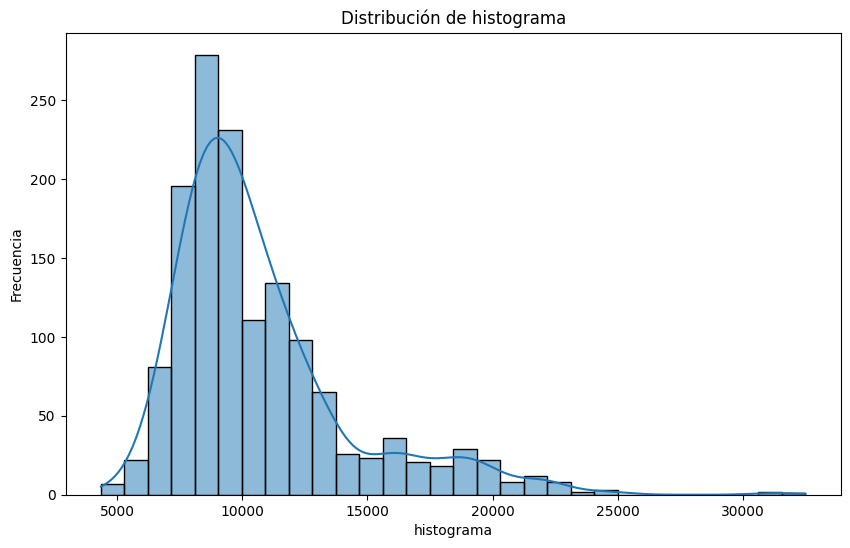

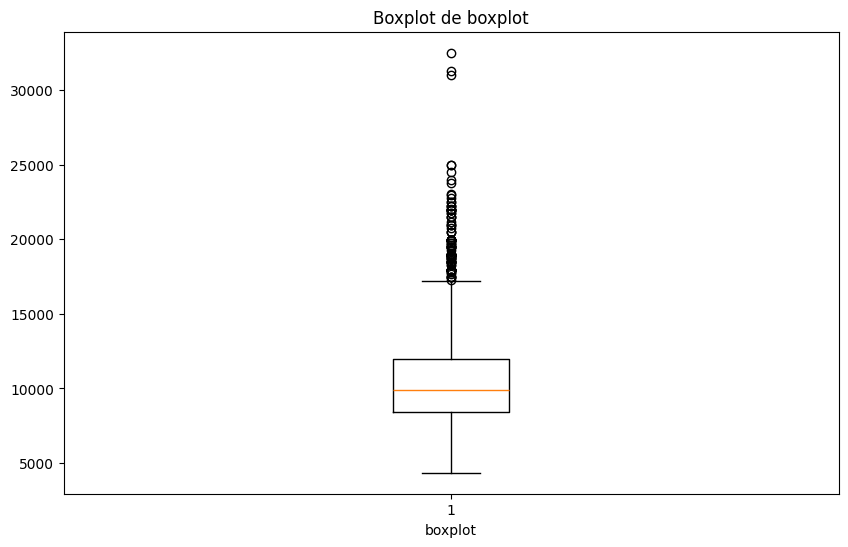

In [270]:
histogram(df_toyota_continuas['price'])
boxplot(df_toyota_continuas['price'])

como se dijo en el analisis univariado dicha distribucion presenta una sesgo hacia la izquierda por lo tanto hay que eliminar esos outliers, como el histograma lo presenta vemos que es una distrubucion que se acerca mucho a una `distribucion normal` lo que haremos es eliminar los outliers con el metodo llamado `z-core`

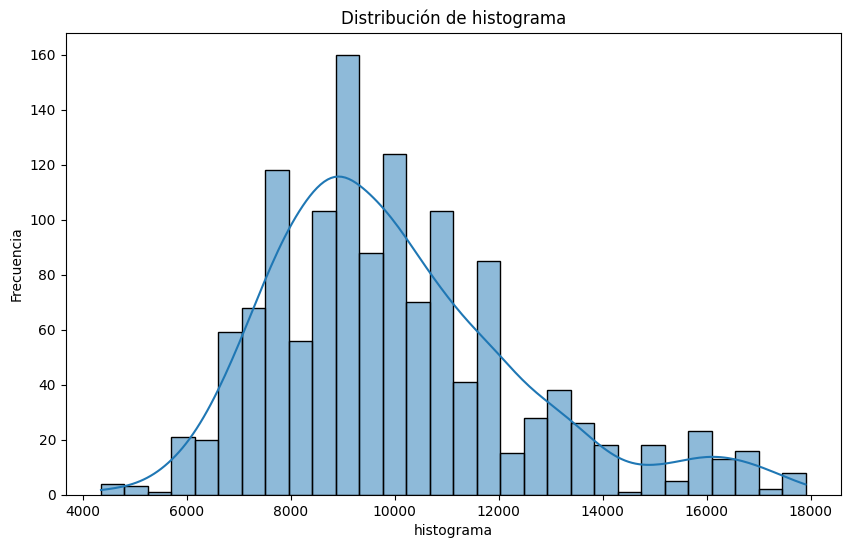

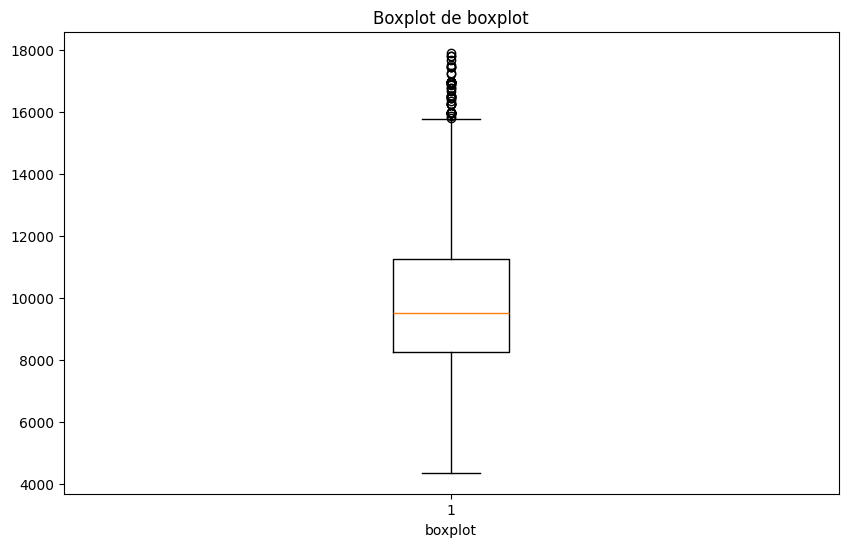

100


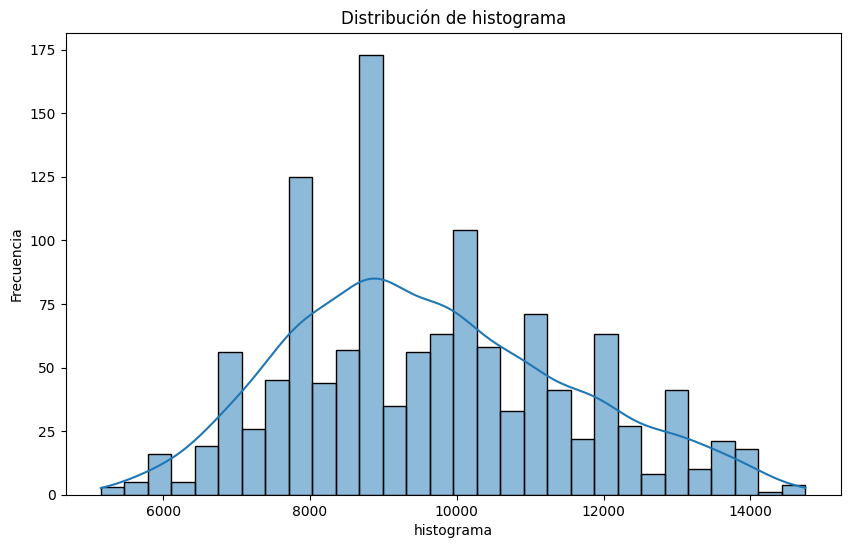

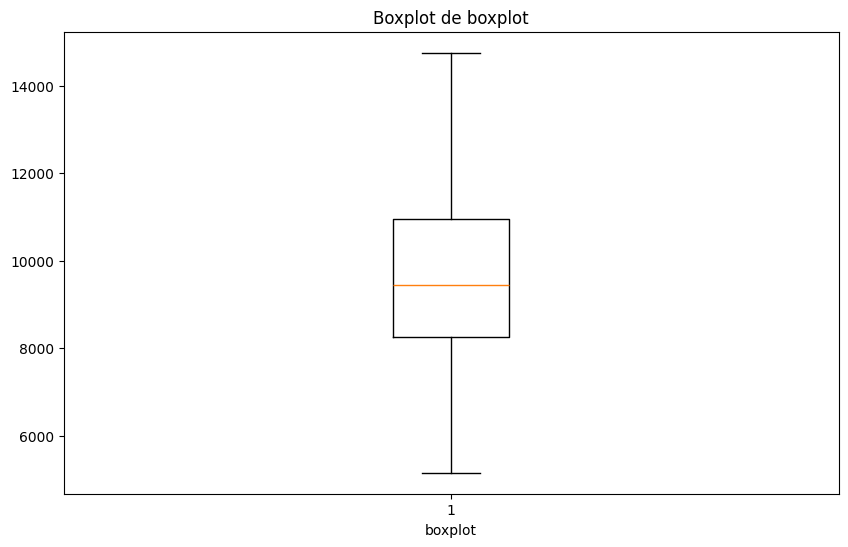

85


In [271]:
price = df_toyota_continuas['price'].copy()
_ , mask_price = limpiar_outliers_z_core(price)
price_limpio = price[mask_price]
histogram(price_limpio)
boxplot(price_limpio)

print(len(price) - len(price_limpio))

price_limpio_l , mask_price_l = limpiar_outliers_z_core(price_limpio)

histogram(price_limpio_l)

boxplot(price_limpio_l)

print(len(price_limpio) - len(price_limpio_l))








## KM 

antes de eliminar los outliers vamos a graficar un histograma y un boxplot

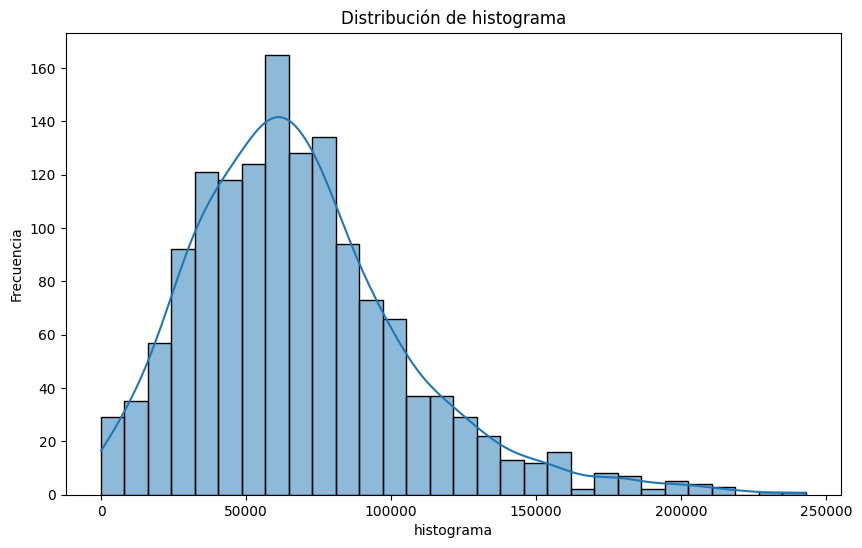

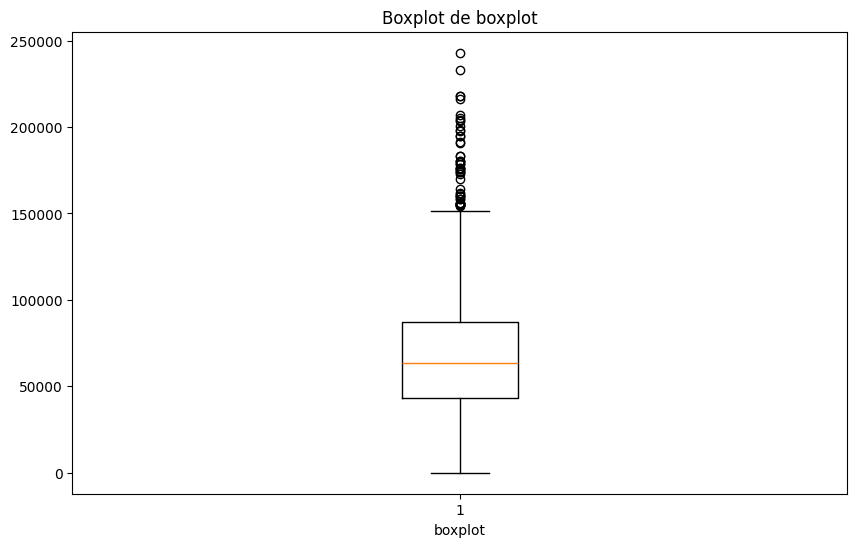

In [272]:
histogram(df_toyota_continuas['km'])
boxplot(df_toyota_continuas['km'])


como se dijo en el analisis univariad adicha distribucion presenta una sesgo hacia la derecha por lo tanto hay que eliminar esos outliers, como el histograma lo presenta vemos que es una distribucion que se acerca mucho a una `distribucion normal` lo que haremos es eliminar los outliers con el metodo llamado `z-core`

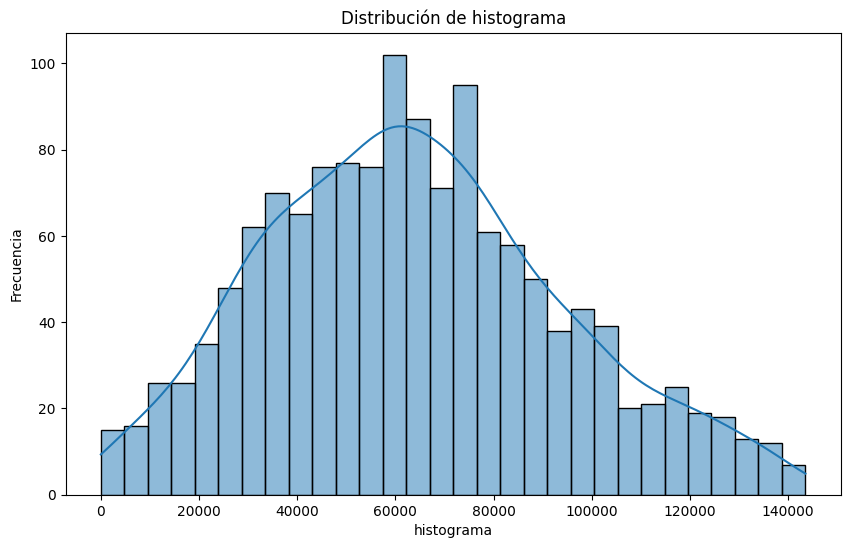

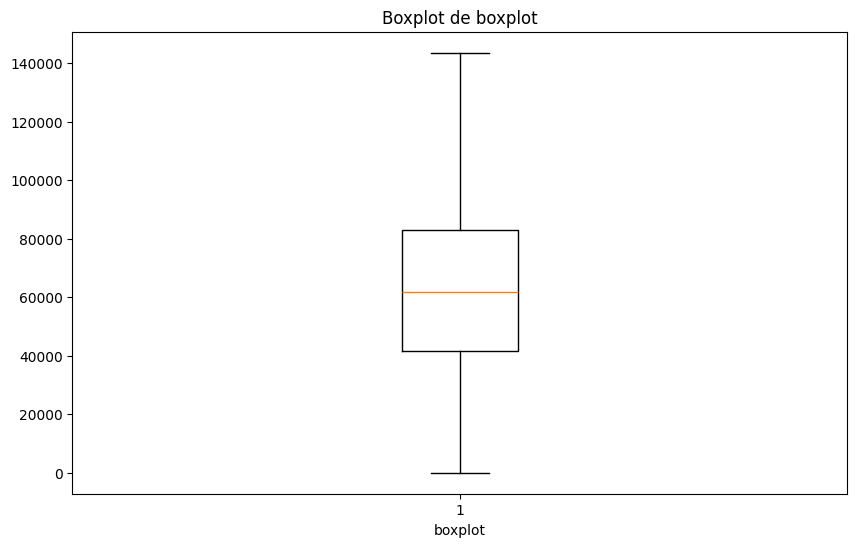

64


In [273]:
km = df_toyota_continuas['km'].copy()
_ , mask_km = limpiar_outliers_z_core(km)
km_limpio = km[mask_km]
histogram(km_limpio)
boxplot(km_limpio)
print(len(km) - len(km_limpio))


## cc

como se menciono en el `analisis univariado` hay un outliers extremademente alejado de la mayoria de los datos, por lo tanto a ese debemos eliminarlo

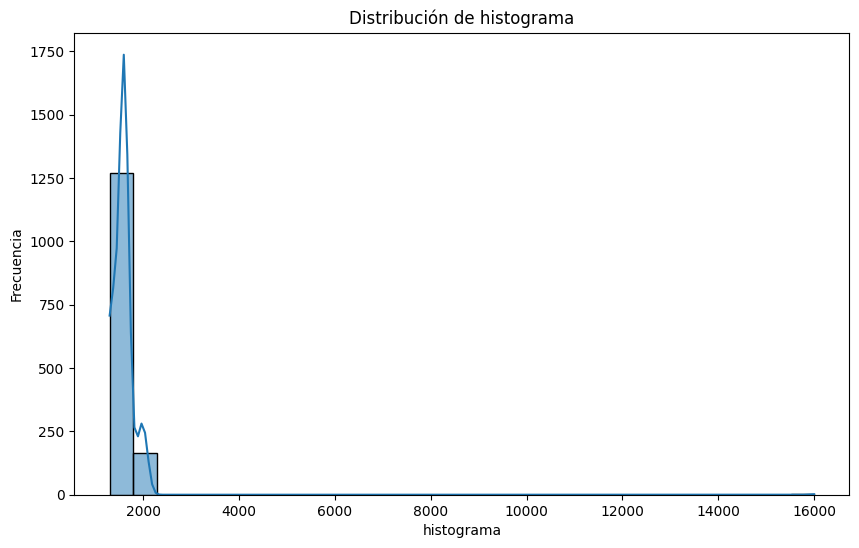

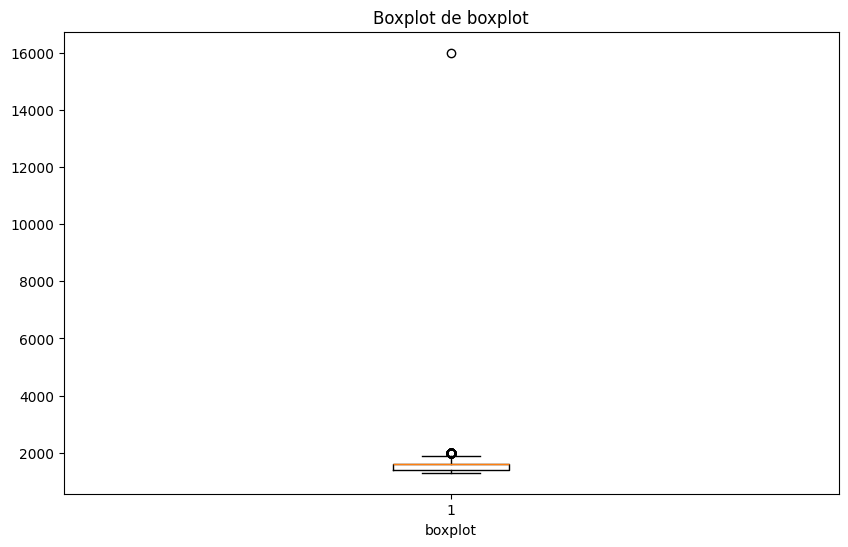

0.12437451354775338


In [274]:
histogram(df_toyota_continuas['cc'])
boxplot(df_toyota_continuas['cc'])
correlacion = df_toyota_continuas['cc'].corr(df_toyota_continuas['price'])
print(correlacion)


el elimina el outliers por lo que los datos de `cc` quedan de la siguiente manera

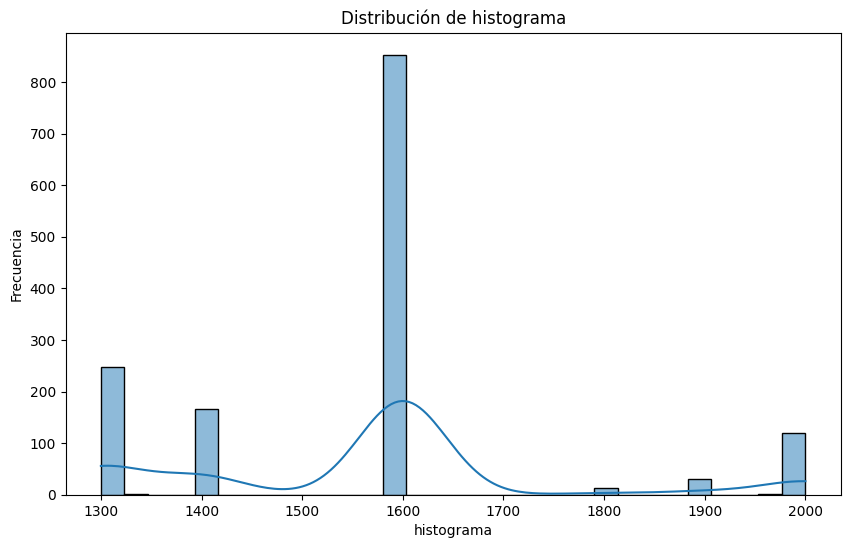

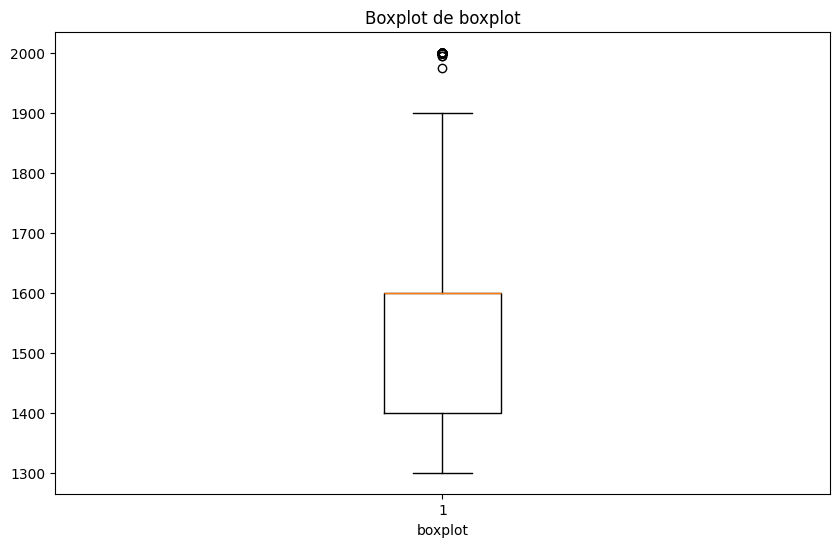

In [275]:
cc = df_toyota_continuas['cc'].copy()

cc = cc[cc!=cc.max()]

histogram(cc)
boxplot(cc)


el valor 1600 domina fuertemente con una frecuencia desproporcionadamente alta, no se la pudo mejorar con eliminando los outliers tampoco vale la pena llevar a una normal ya que no es continua, si la variable no tiene un buen coeficente de correlacion se debera eliminarla

## Quarterly_tax

en esta variable se observa que hay muchos vehiculos que pagan entre 50 y  100 de impuestos trimestrales que es ahi donde se encuentran el 75% de los dato sin embargo se visualiza que hay vehiculos que pagan mucho mas que eso mas o menos con una diferencia  152, esto puede deberse a que es un auto de alta gama o algo parecido  por lo tanto la variable `quarterly_tax` se le haran los siguientes tratamientos para poder salvara de alguna manera ya que pensamos que dicha variable a la hora de determianr el precio de un vehiculo aporta mucho a el mismo.

- eliminar outliers  ->   `con la estrategia z-core  a 2 desviaciones estandar`

- convertirla en una normal ->  `box-cox`


si alguno de estos tratamientos no da resultado se optara por eliminar dicha  variable 

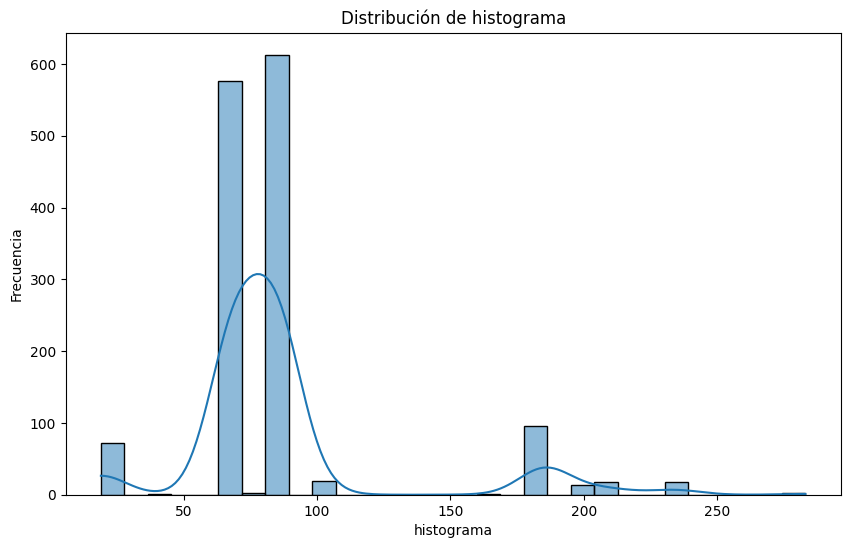

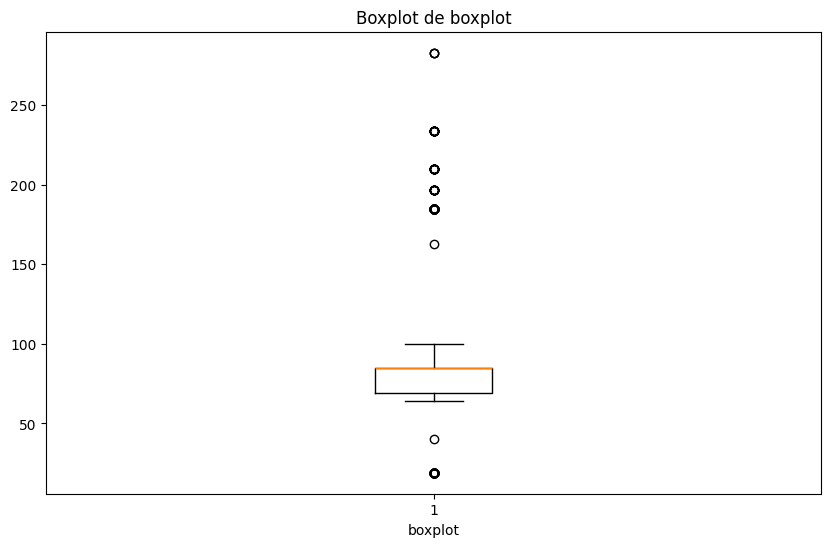

In [276]:
histogram(df_toyota_continuas['quarterly_tax'])
boxplot(df_toyota_continuas['quarterly_tax'])



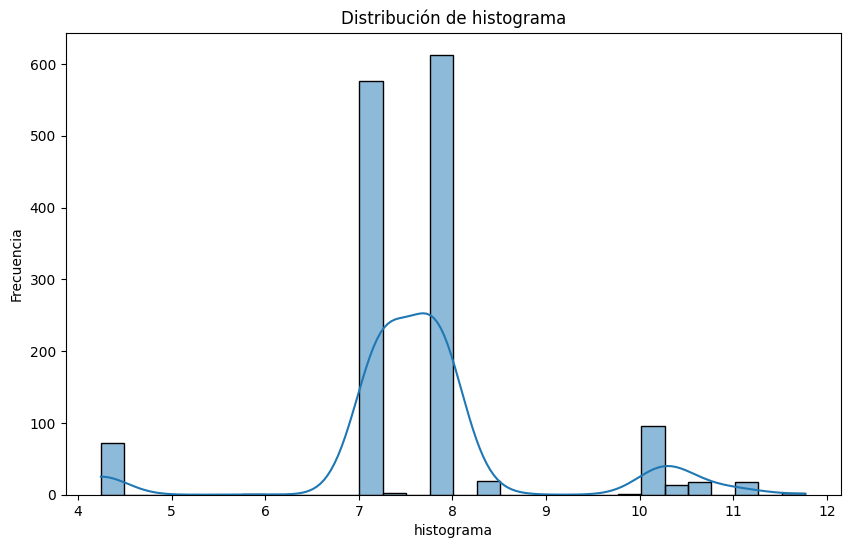

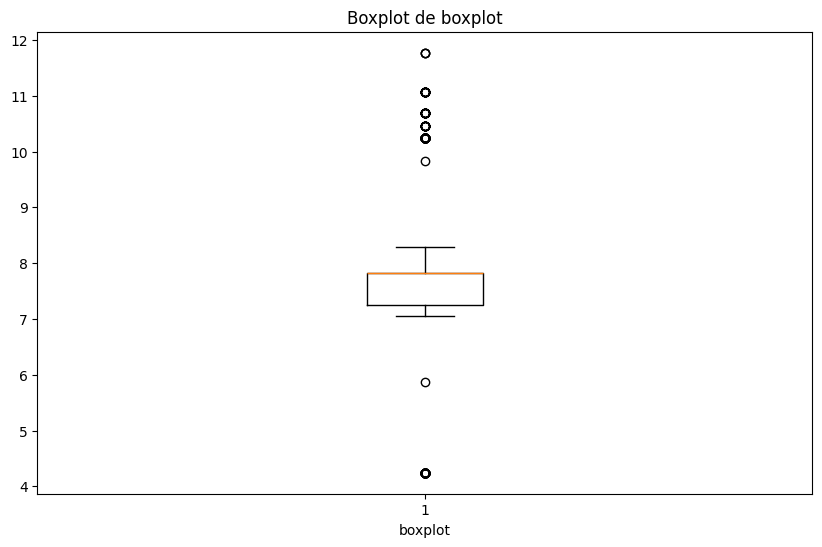

In [277]:
# importancion de libreria para boxcox
from scipy.stats import boxcox
quearterly_tax = df_toyota_continuas['quarterly_tax'].copy()

quearterly_tax_box,_ = boxcox(quearterly_tax)

histogram(quearterly_tax_box)
boxplot(quearterly_tax_box)


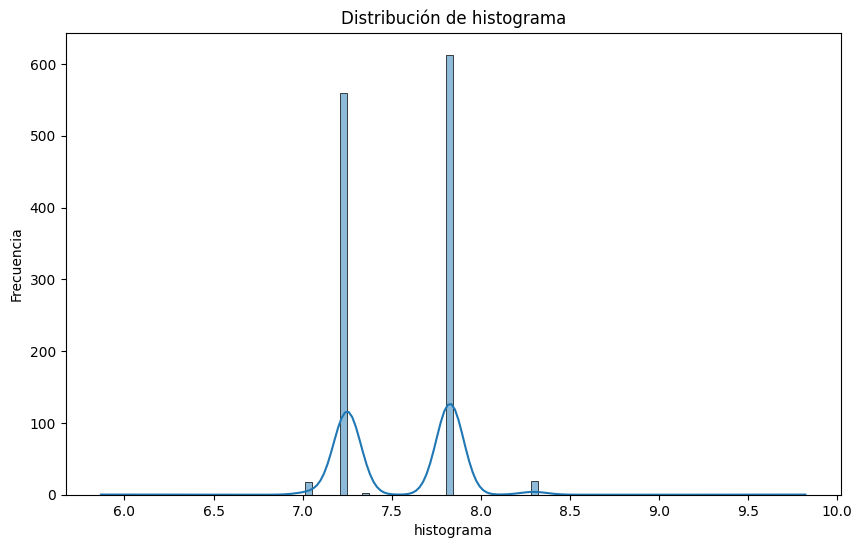

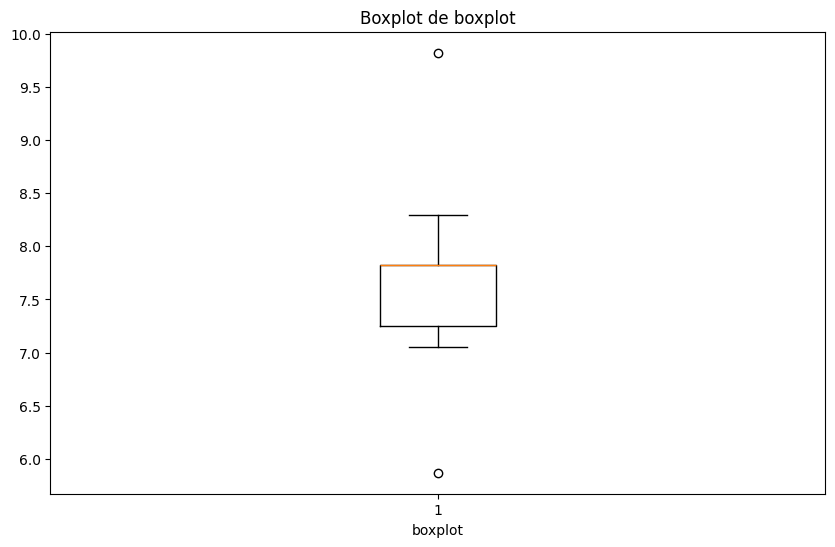

221


In [278]:
quearterly_tax_box_limpio , mask_quearterly_tax_box = limpiar_outliers_z_core(quearterly_tax_box)

histogram(quearterly_tax_box_limpio,100)
boxplot(quearterly_tax_box_limpio)

print(len(quearterly_tax_box) - len(quearterly_tax_box_limpio))


se puede observar que en los dos tratamientos aplicados  no se observo ninguna mejoria por lo tanto la variable quarterly tax se va

# Eliminacion de outliers y/o Transformacion para varibles Enteras

In [279]:
df_toyota_enteras.columns

Index(['mfg_month', 'mfg_year', 'hp', 'doors', 'gears', 'guarantee_period'], dtype='object')

## mfg_month y mfg_year

dichas variable no se van a contemplar en su estudio puesto que ya que estan condensadas en la variable `age_08_04_calculada`

## Gears y Doors

dicha variables no se contemplar en este estudio puesto qu se las van a eliminar ya que presentan poca varianza

## hp

como se vio en el `analsis univariado` hp presenta un outliers que esta muy alejado alejado del de todos los datos por lo tanto debemos eliminarlo

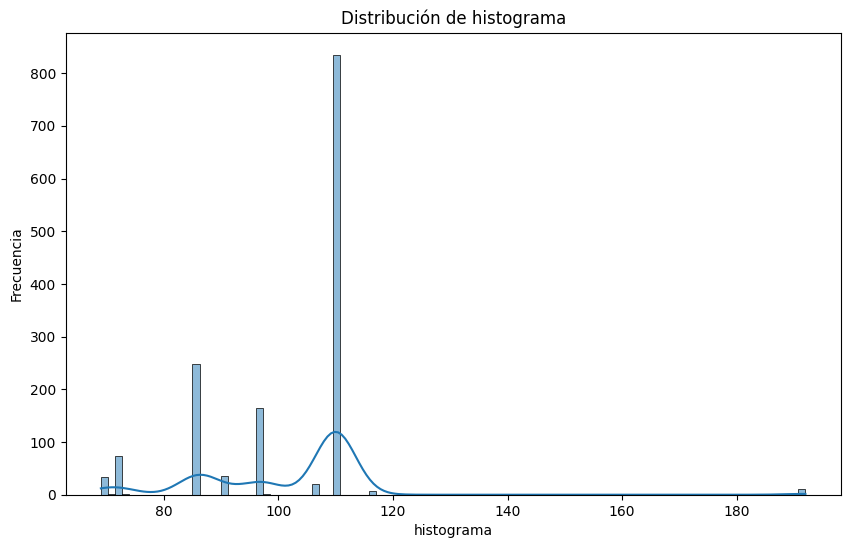

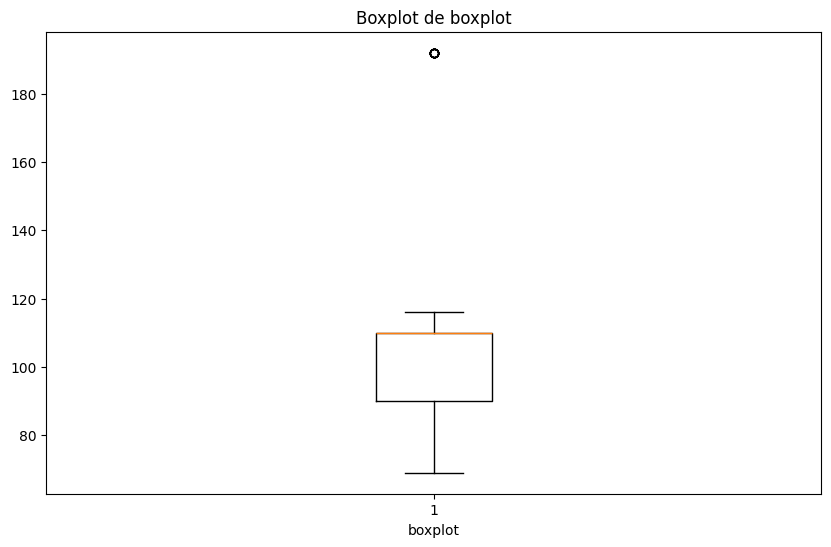

In [280]:
histogram(df_toyota_enteras['hp'],100)
boxplot(df_toyota_enteras['hp'])


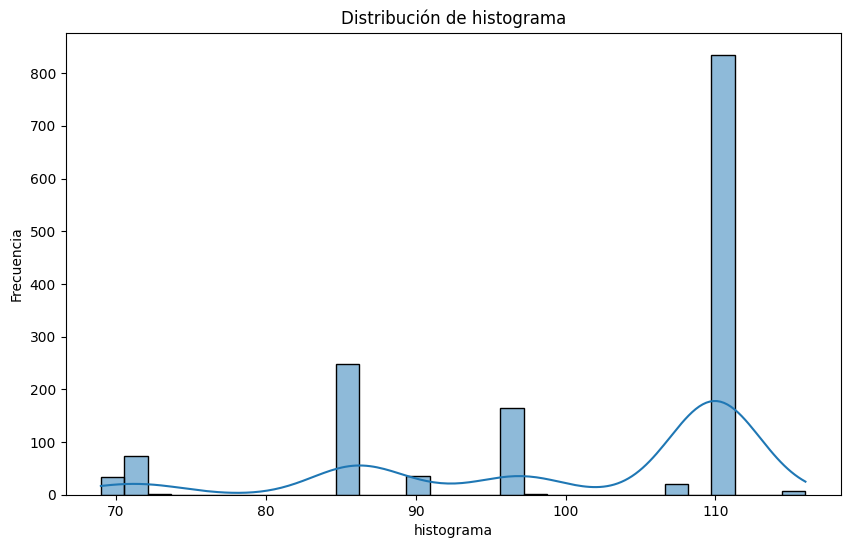

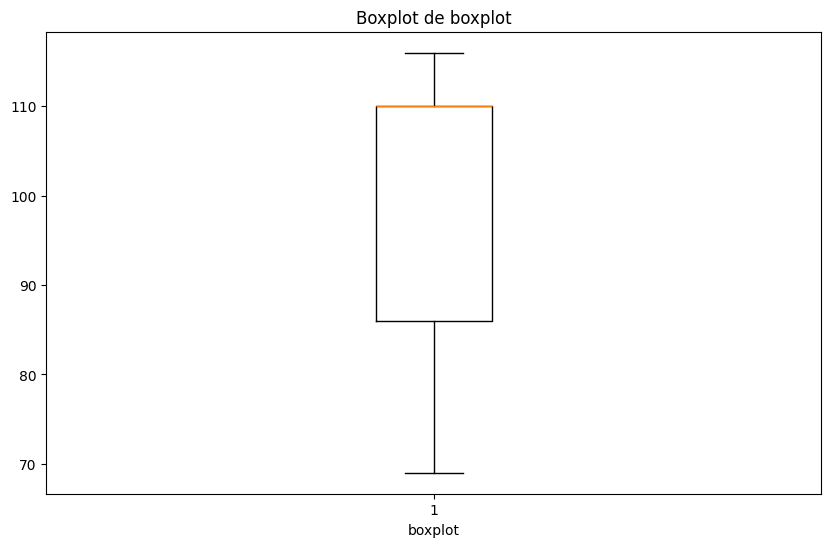

In [281]:
hp = df_toyota_enteras['hp'].copy()
hp = hp[hp!=hp.max()]
histogram(hp)
boxplot(hp)



a nuestro parecer es casi imposible recuperarla, entonces decidimos eliminarla para estudios posteriores

## guarent_period

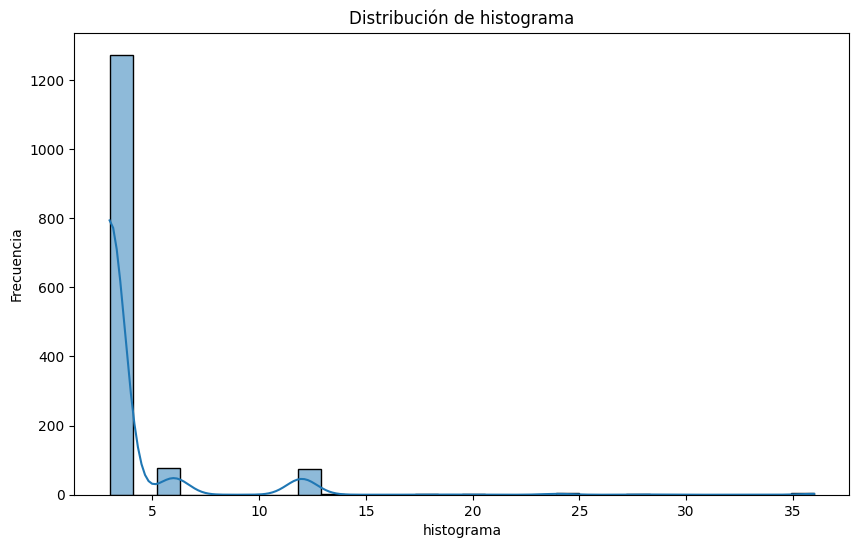

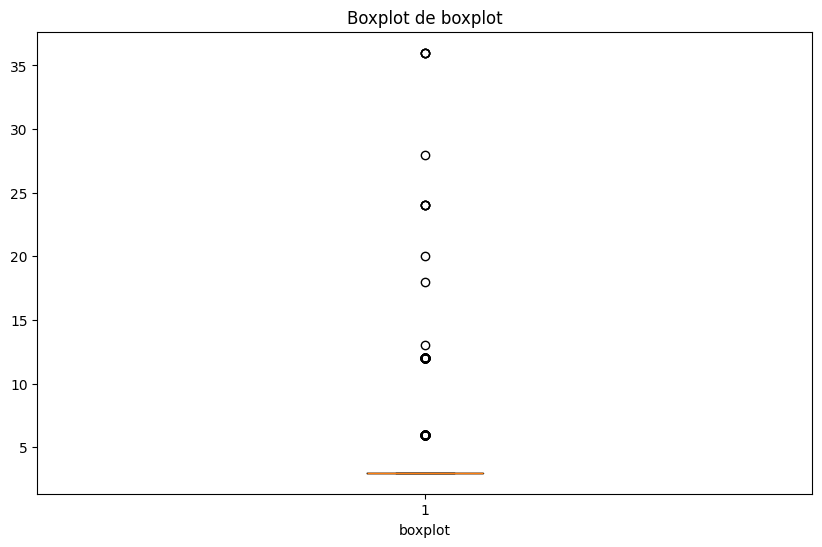

In [282]:
guarent_period = df_toyota_enteras['guarantee_period'].copy()

histogram(guarent_period)
boxplot(guarent_period)




evidentemente tiene poca varibilidad , se debe eliminar gurante_period

In [283]:
df_toyota.columns


Index(['price', 'mfg_month', 'mfg_year', 'km', 'fuel_type', 'hp', 'met_color',
       'automatic', 'cc', 'doors', 'gears', 'quarterly_tax', 'weight',
       'mfr_guarantee', 'bovag_guarantee', 'guarantee_period', 'abs',
       'airbag_1', 'airbag_2', 'airco', 'automatic_airco', 'boardcomputer',
       'cd_player', 'central_lock', 'powered_windows', 'power_steering',
       'radio', 'mistlamps', 'sport_model', 'backseat_divider', 'metallic_rim',
       'radio_cassette', 'tow_bar', 'age_08_04_calculada'],
      dtype='object')

# Analisis Bivariado con dataframe Limpio

antes de empezar a hacer el analisis bivariado vamos dejar el dataset limpio y aplicarle todos los cambios que le veniamos haciendo 

In [284]:
df_toyota_limpio = df_toyota.copy()

In [285]:
df_toyota_limpio.columns

Index(['price', 'mfg_month', 'mfg_year', 'km', 'fuel_type', 'hp', 'met_color',
       'automatic', 'cc', 'doors', 'gears', 'quarterly_tax', 'weight',
       'mfr_guarantee', 'bovag_guarantee', 'guarantee_period', 'abs',
       'airbag_1', 'airbag_2', 'airco', 'automatic_airco', 'boardcomputer',
       'cd_player', 'central_lock', 'powered_windows', 'power_steering',
       'radio', 'mistlamps', 'sport_model', 'backseat_divider', 'metallic_rim',
       'radio_cassette', 'tow_bar', 'age_08_04_calculada'],
      dtype='object')

Aplicamos la limpieza de outliers en price

In [286]:
_ , mask_df_price_1 = limpiar_outliers_z_core(df_toyota_limpio['price'])
df_toyota_limpio = df_toyota_limpio[mask_df_price_1]
_ , mask_df_price_2 = limpiar_outliers_z_core(df_toyota_limpio['price'])
df_toyota_limpio = df_toyota_limpio[mask_df_price_2]



aplicamos limpeiza de outliers a `km`

In [287]:
_ , mask_df_km = limpiar_outliers_z_core(df_toyota_limpio['km'])
df_toyota_limpio = df_toyota_limpio[mask_df_km]


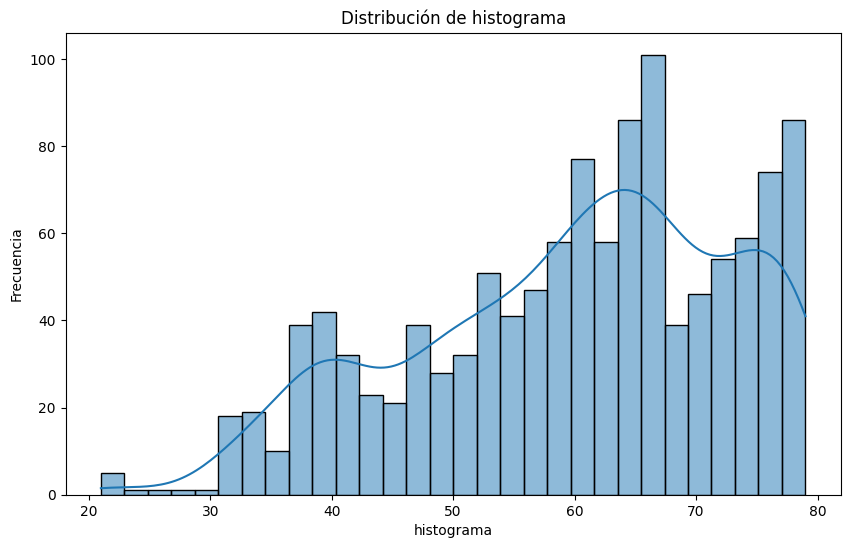

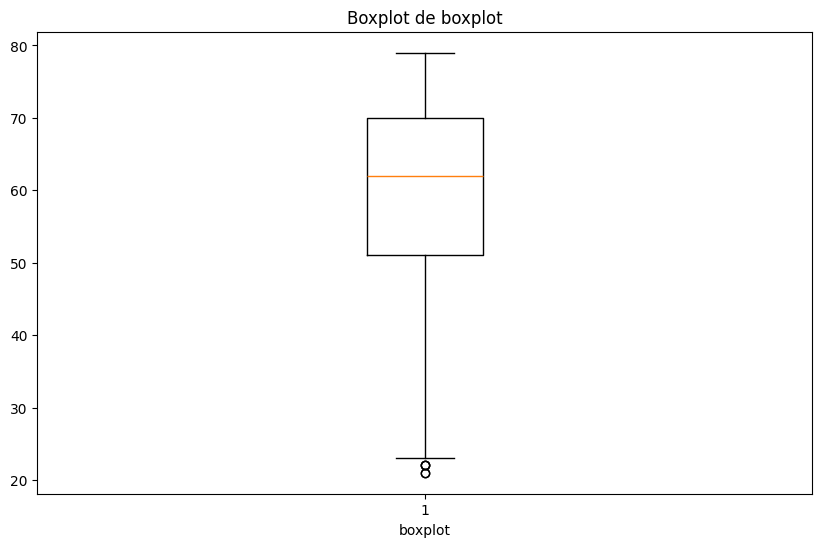

In [288]:
histogram(df_toyota_limpio['age_08_04_calculada'])
boxplot(df_toyota_limpio['age_08_04_calculada'])

Limpiamos `age_08_04_calculada` 

12


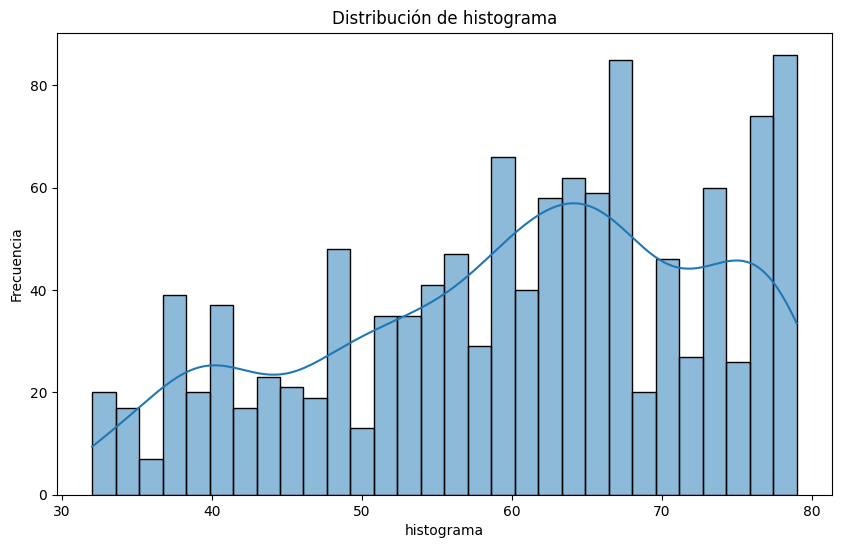

In [289]:
age = df_toyota_limpio['age_08_04_calculada'].copy()

outliers_age= age[age<32]

print(len(outliers_age) )

_ , mask_age = filtrar_columna_por_rango(age,32,age.max())

df_toyota_limpio = df_toyota_limpio[mask_age]

histogram(df_toyota_limpio['age_08_04_calculada'])






Eliminamos las columnas que se mencionaron en el anterior analisis

In [290]:
from sklearn.preprocessing import LabelEncoder

# Instanciar el codificador
le = LabelEncoder()

# Aplicar Label Encoding
df_toyota_limpio['fuel_type_encoded'] = le.fit_transform(df_toyota_limpio['fuel_type'])


In [291]:
df_toyota_limpio.drop(columns=['quarterly_tax', 'cc', 'weight','mfg_month', 'mfg_year', 'hp', 'doors', 'gears', 'guarantee_period','airbag_1', 'automatic_airco', 'power_steering', 'automatic'], axis=1, inplace=True)

In [292]:
df_toyota_limpio.shape

(1177, 22)

mostraremos `matriz de correlacion` y `scatterplot`

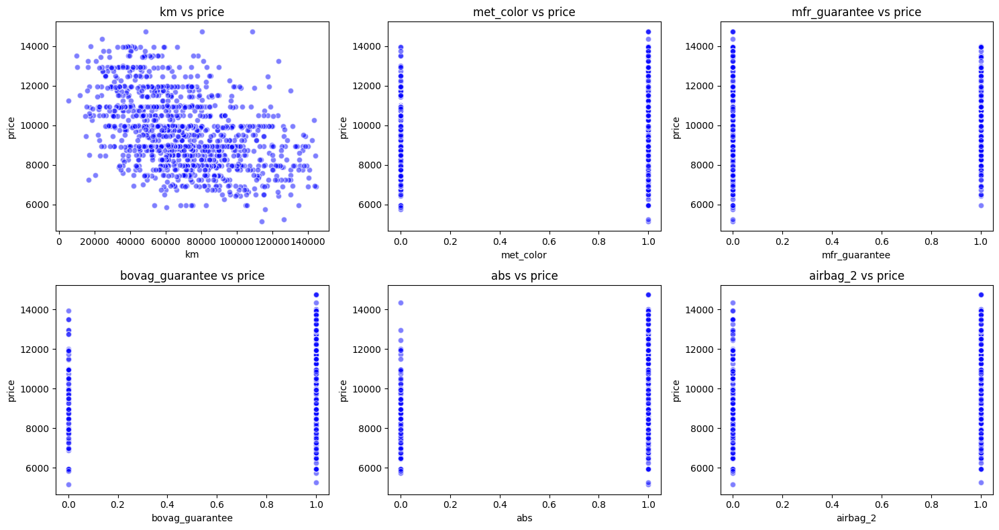

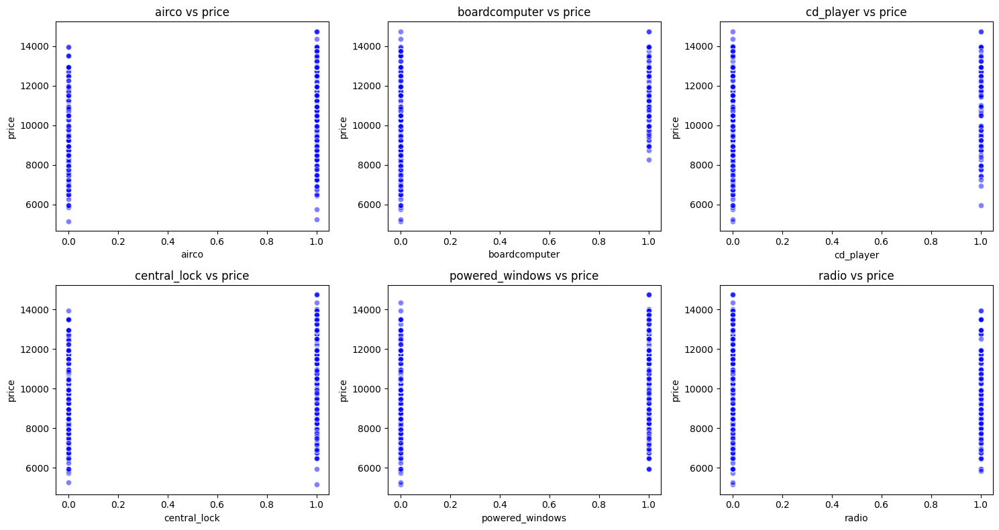

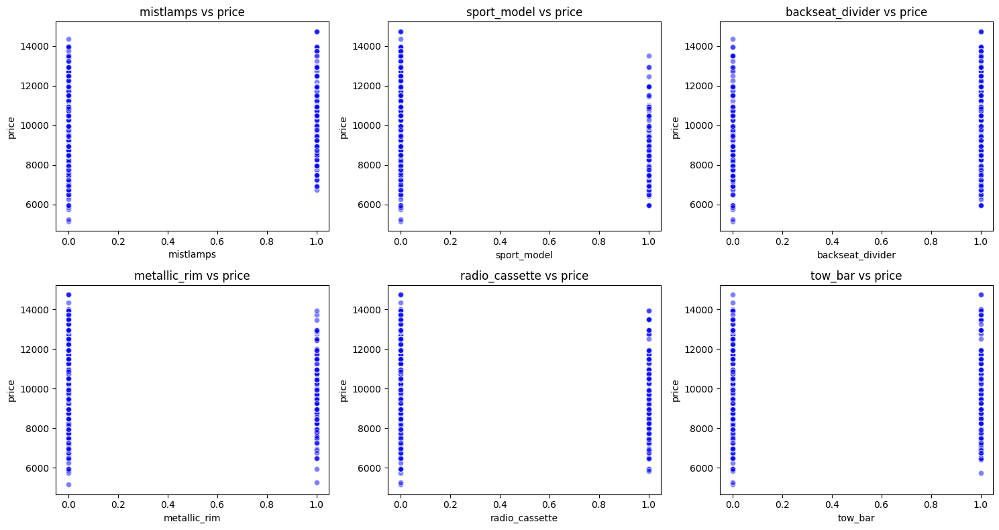

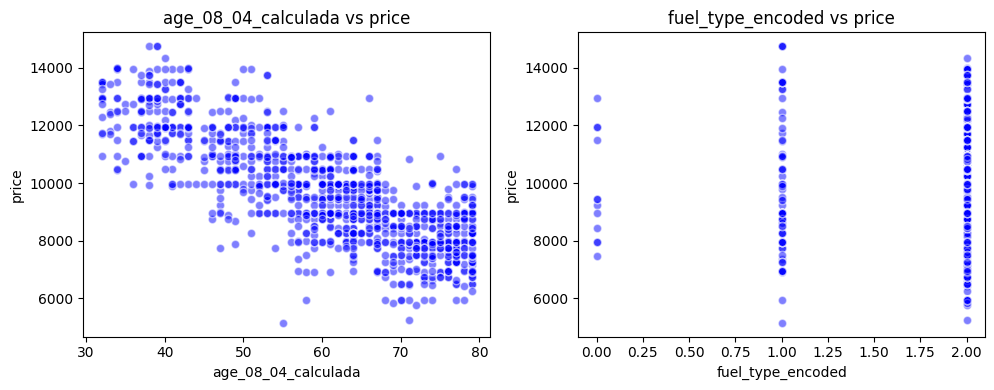

In [293]:
scatter_por_lotes(df_toyota_limpio)

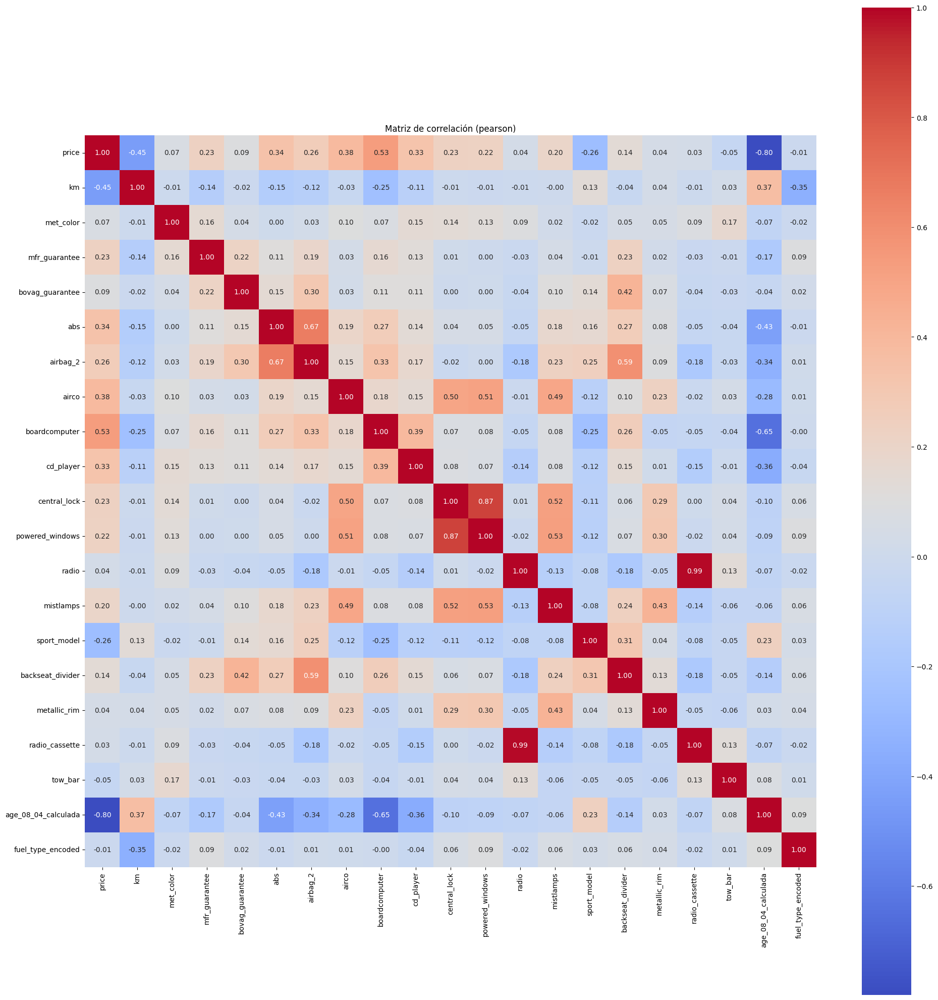

In [294]:
mostrar_matriz_correlacion(df_toyota_limpio)

In [297]:
df_toyota_limpio.drop(columns=['fuel_type'], axis=1, inplace=True)


In [298]:
obtener_correlaciones_target(df_toyota_limpio.corr(), 'price')

,variable,correlacion
7,boardcomputer,0.533503
6,airco,0.382220
4,abs,0.337938
8,cd_player,0.329207
5,airbag_2,0.263527
2,mfr_guarantee,0.232675
9,central_lock,0.228966
10,powered_windows,0.223330
12,mistlamps,0.196633
14,backseat_divider,0.141420


mostramos los pares correlacioanes mayores a `0.60` para poder eliminarlos para evitar la multicolinealidad

In [299]:
pares_correlacion_altas(df_toyota_limpio.corr(),0.60)

,Variable_1,Variable_2,Correlación
0,radio,radio_cassette,0.990406
1,central_lock,powered_windows,0.871258
2,price,age_08_04_calculada,-0.798482
3,abs,airbag_2,0.668578
4,boardcomputer,age_08_04_calculada,-0.648529


- `radio` y `radio_cassete` muy correlacionadas nos quedamos con la primera

- `central_lock` y `powered_windows` muy correlacionadas nos quedamos con la primera

- `abs` y `airbag_2` muy correlacionadas nos quedamos con la primera

- `age_08_04_calculada` y `boardcomputer` muy correlacionadas nos quedamos con la primera




In [300]:
df_toyota_limpio.drop(columns=['radio_cassette','powered_windows','airbag_2','boardcomputer'], axis=1, inplace=True)
df_toyota_limpio.shape



(1177, 17)

In [301]:
print(df_toyota_limpio.columns)

Index(['price', 'km', 'met_color', 'mfr_guarantee', 'bovag_guarantee', 'abs',
       'airco', 'cd_player', 'central_lock', 'radio', 'mistlamps',
       'sport_model', 'backseat_divider', 'metallic_rim', 'tow_bar',
       'age_08_04_calculada', 'fuel_type_encoded'],
      dtype='object')


In [302]:
df_toyota_limpio.reset_index(drop=True, inplace=True)

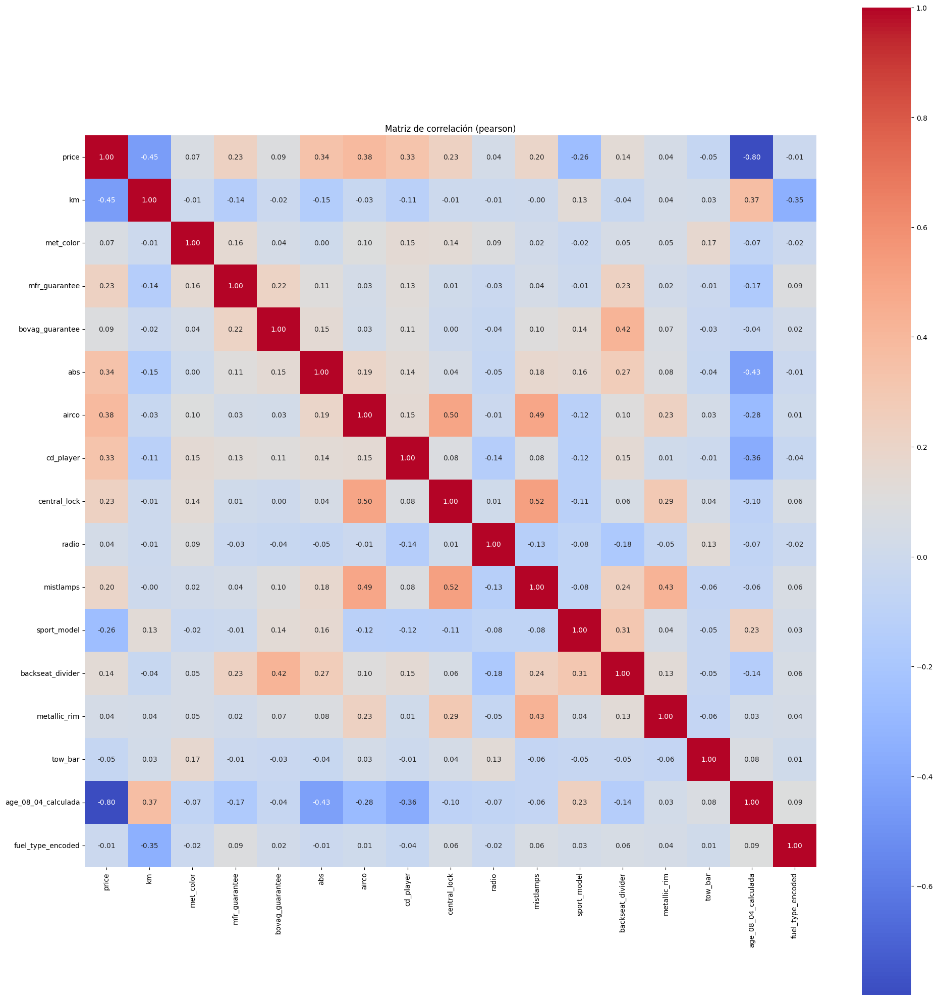

In [303]:
mostrar_matriz_correlacion(df_toyota_limpio)

`km`

In [304]:
# resetaer el index
df_toyota_limpio.reset_index(drop=True, inplace=True)






In [213]:

import os
output_dir = "output"
os.makedirs(output_dir, exist_ok=True)
csv_path = os.path.join(output_dir, "data_clean.csv")
df_toyota_limpio.to_csv(csv_path, index=False)


# Acciones a aplicar en el asset `filtrado_y_limpieza`

Eliminamos todas las variables que tengan una correlacion menor o igual a 0.20 con `price`

In [305]:


# Calculamos la correlación de todas las columnas con la variable objetivo
correlations = df_toyota_limpio.corr(numeric_only=True)['price'].abs()

# Seleccionamos las columnas con correlación >= 0.20
relevant_features = correlations[correlations >= 0.20].index

# Creamos un nuevo DataFrame con solo las variables relevantes
df_filtered = df_toyota_limpio[relevant_features]


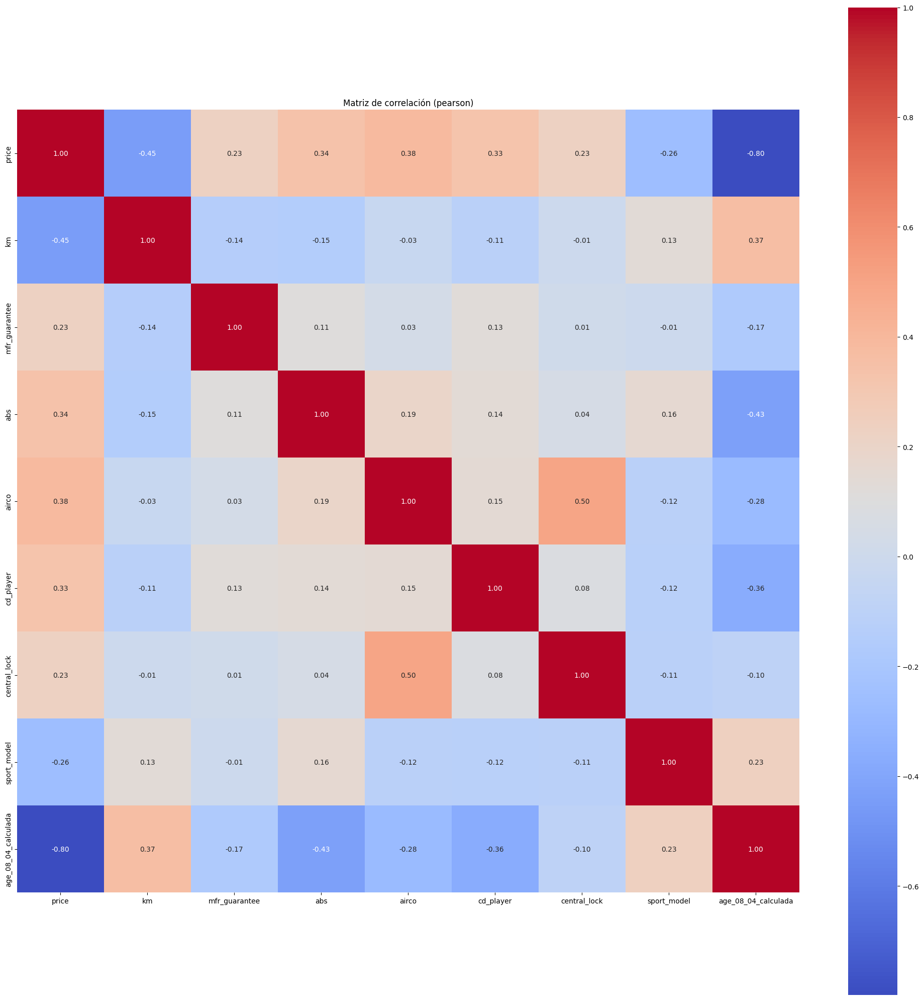

In [215]:
mostrar_matriz_correlacion(df_filtered)

## TRANSFORMACION DE FEATURE

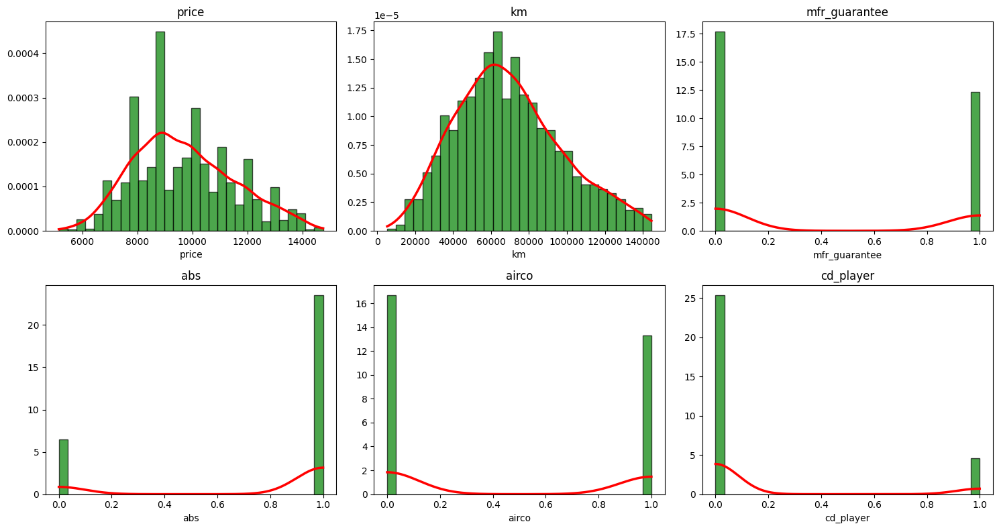

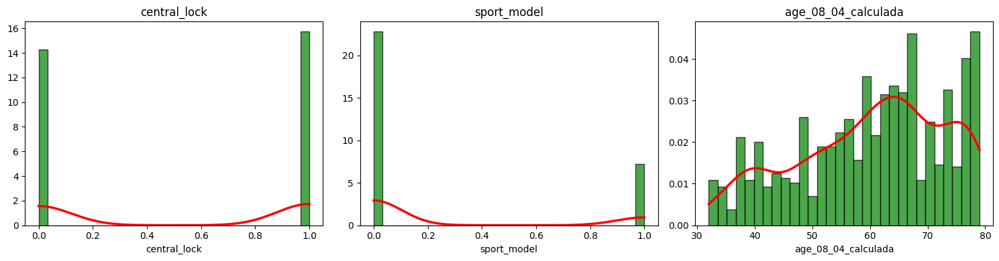

In [306]:
histogram_por_lotes(df_filtered)

Index(['price', 'km', 'mfr_guarantee', 'abs', 'airco', 'cd_player',
       'central_lock', 'sport_model', 'age_08_04_calculada'],
      dtype='object')


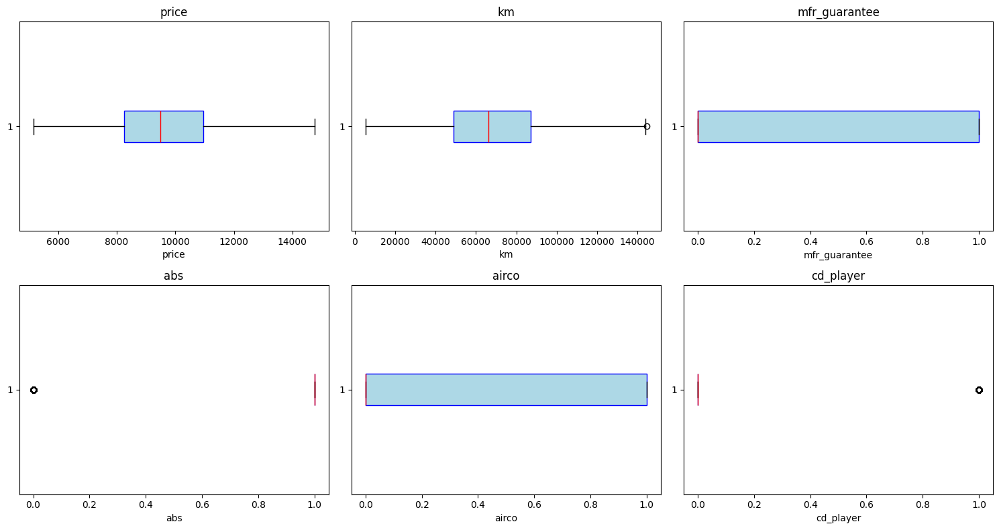

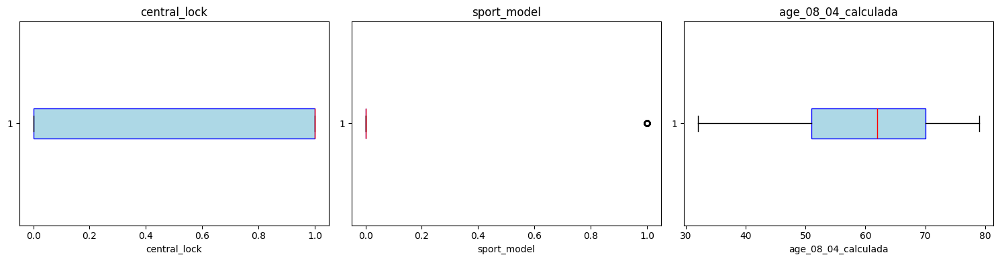

In [307]:
boxplots_por_lotes(df_filtered)

Evidentemente tenemos un problema con las escalas, puesto que en el modelo se van considerar variables binarias por lo tanto vamos a aplicar una tecnica de normalizacion de datos llamda `Min-Max Scaling`  a la siguientes variables: 

- `km`

- `price`

- `age_08_04_calculada`



In [308]:
df_filtered_normalizado = df_filtered.copy()

In [309]:
from sklearn.preprocessing import MinMaxScaler


scaler_filtrado_normalizado = MinMaxScaler()

df_filtered_normalizado['age_08_04_calculada'] = scaler_filtrado_normalizado.fit_transform(df_filtered_normalizado['age_08_04_calculada'].values.reshape(-1, 1))

df_filtered_normalizado['km'] = scaler_filtrado_normalizado.fit_transform(df_filtered_normalizado['km'].values.reshape(-1, 1))

df_filtered_normalizado['price'] = scaler_filtrado_normalizado.fit_transform(df_filtered_normalizado['price'].values.reshape(-1, 1))




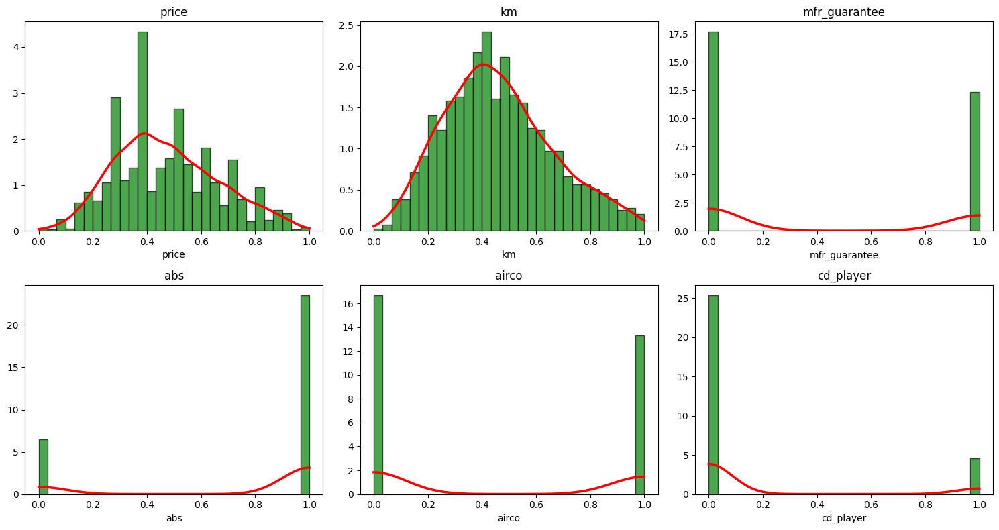

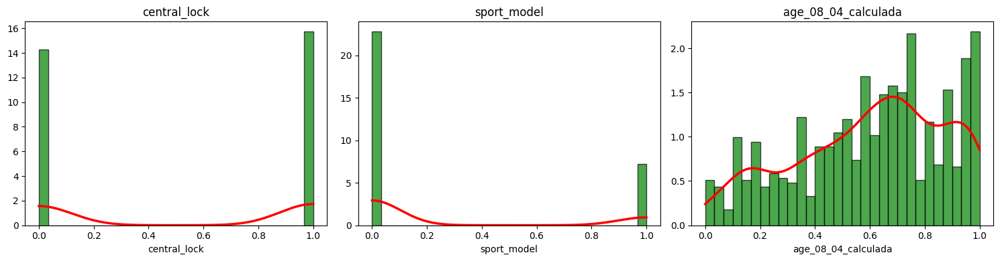

Index(['price', 'km', 'mfr_guarantee', 'abs', 'airco', 'cd_player',
       'central_lock', 'sport_model', 'age_08_04_calculada'],
      dtype='object')


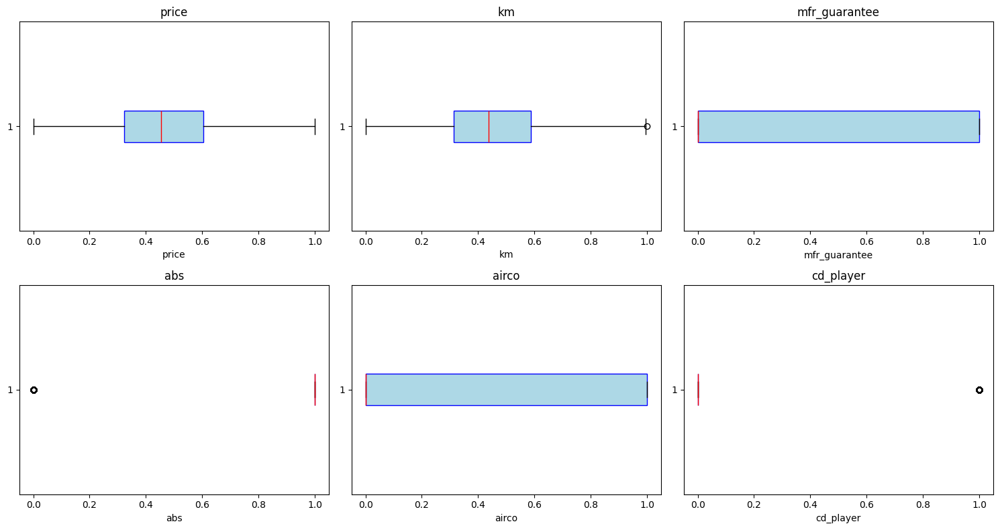

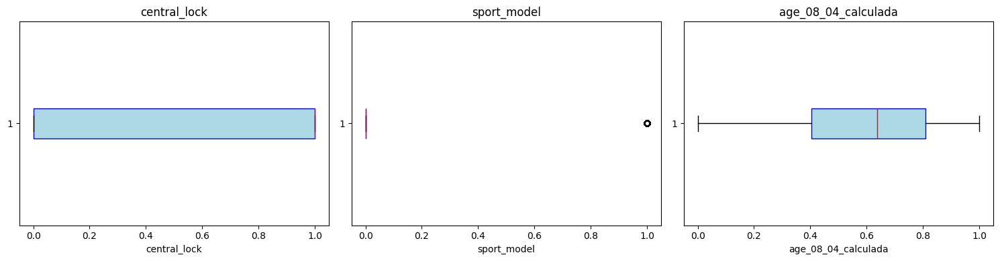

In [310]:
histogram_por_lotes(df_filtered_normalizado)
boxplots_por_lotes(df_filtered_normalizado)






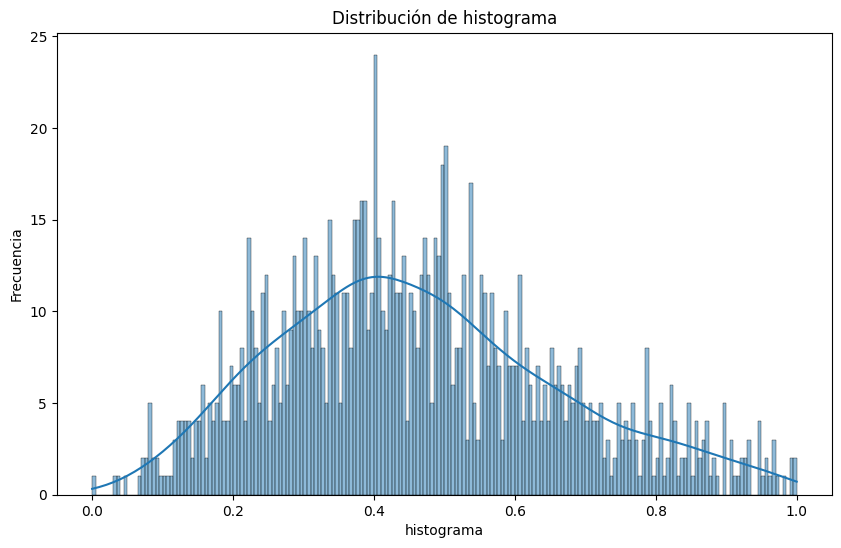

In [311]:
histogram(df_filtered_normalizado['km'],200)

In [312]:
df_filtered_normalizado['km'].describe()

count    1177.000000
mean        0.460960
std         0.200034
min         0.000000
25%         0.313845
50%         0.437168
75%         0.586810
max         1.000000
Name: km, dtype: float64

cortamos a los ambos costados de `km` para mejorar

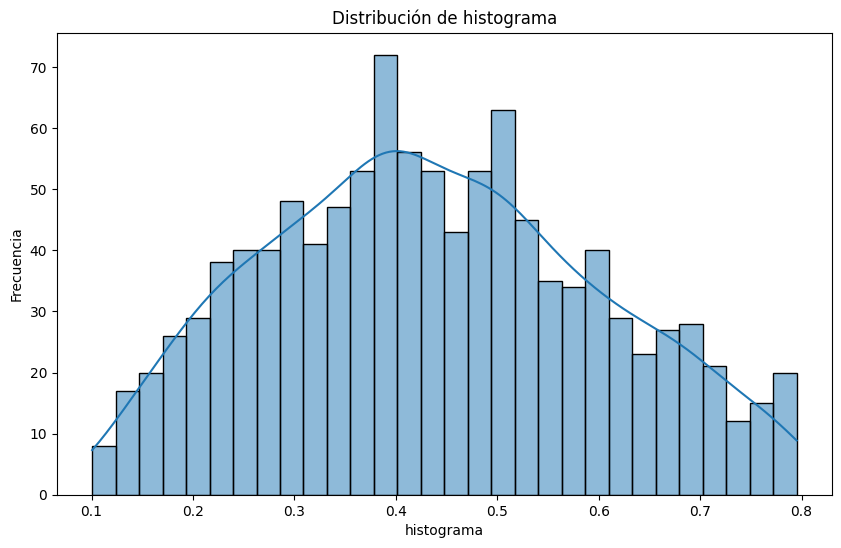

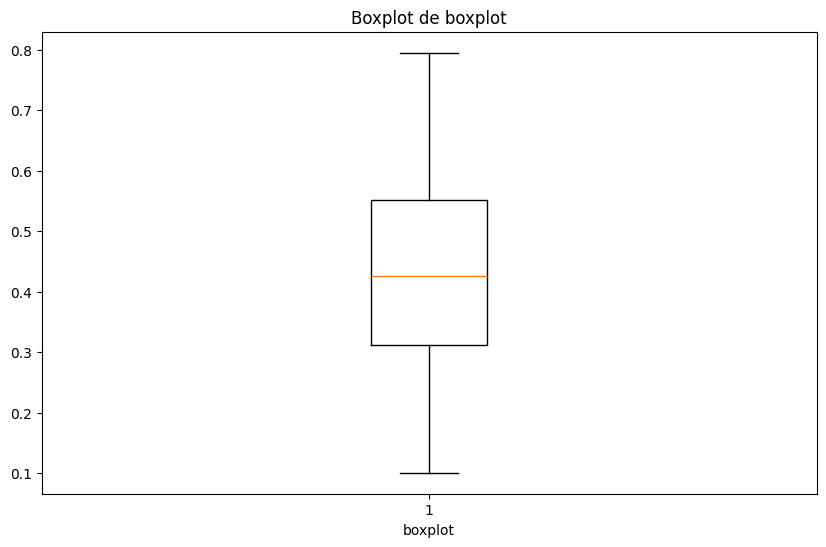

1076


In [313]:
km = df_filtered_normalizado['km'].copy()
km_f , mask_km = filtrar_columna_por_rango(km,0.1,0.8)

histogram(km_f)
boxplot(km_f)

print(len(km_f))










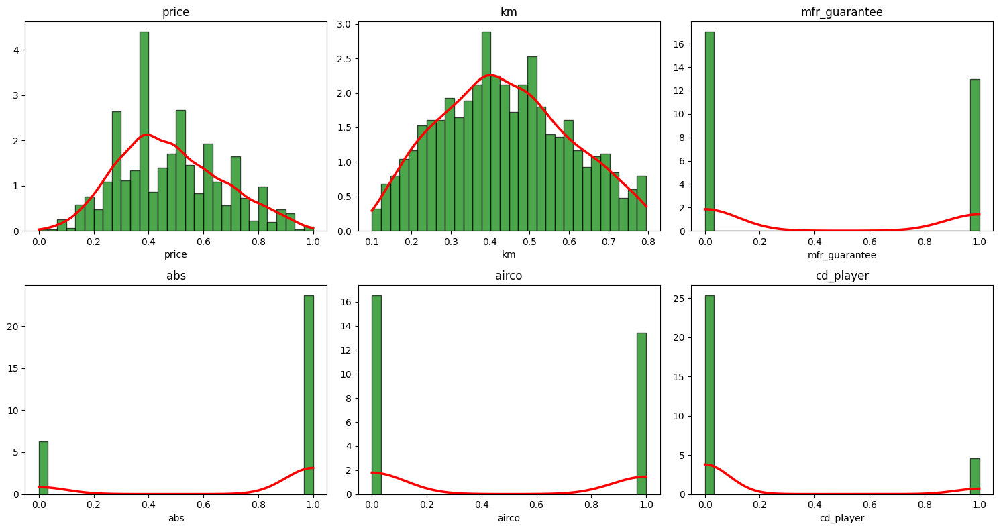

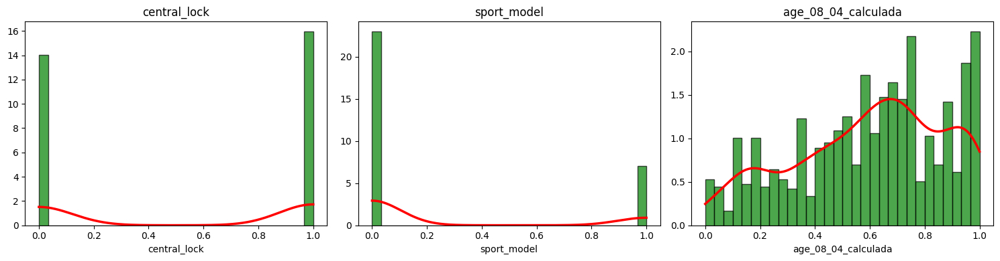

Index(['price', 'km', 'mfr_guarantee', 'abs', 'airco', 'cd_player',
       'central_lock', 'sport_model', 'age_08_04_calculada'],
      dtype='object')


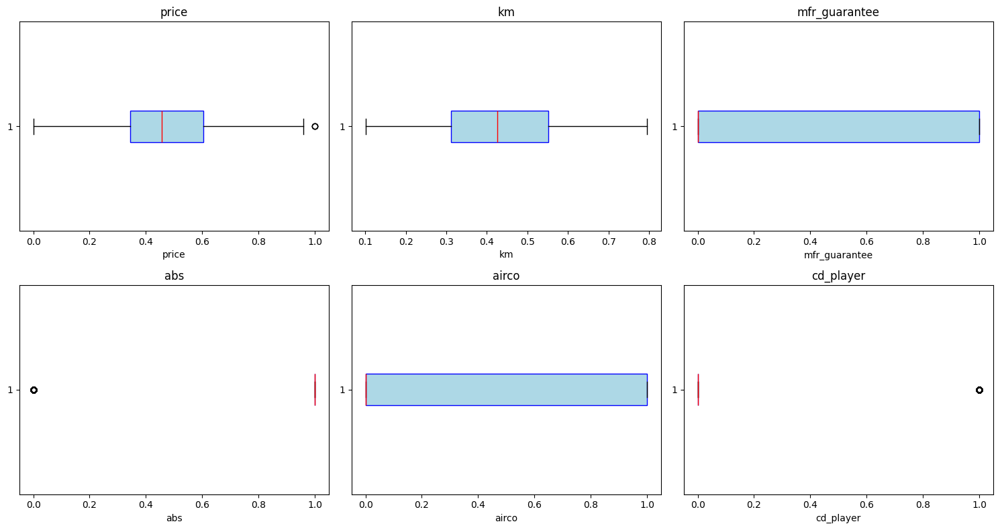

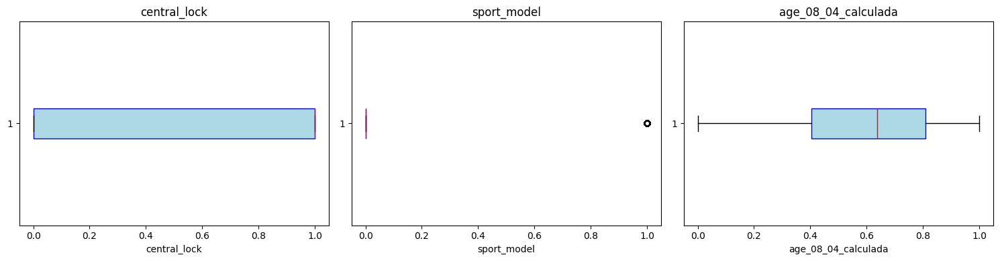

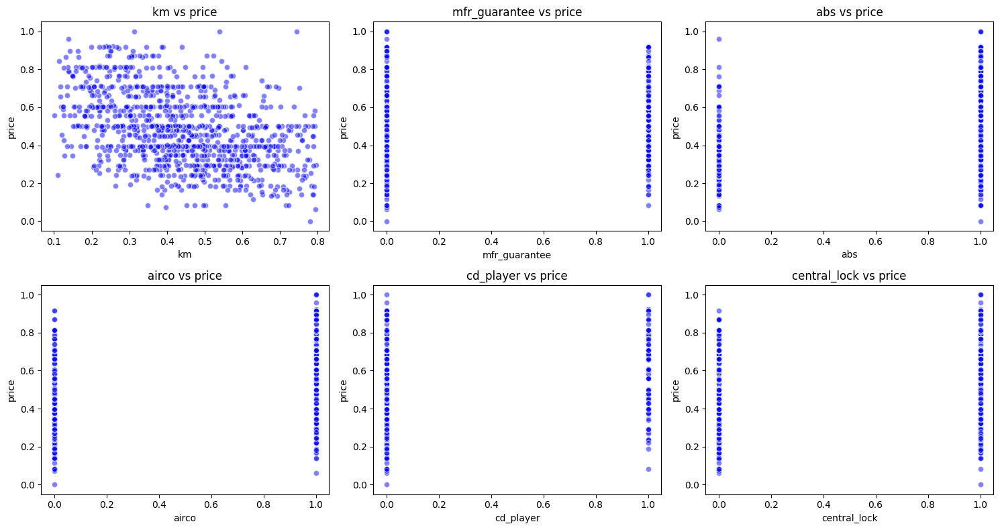

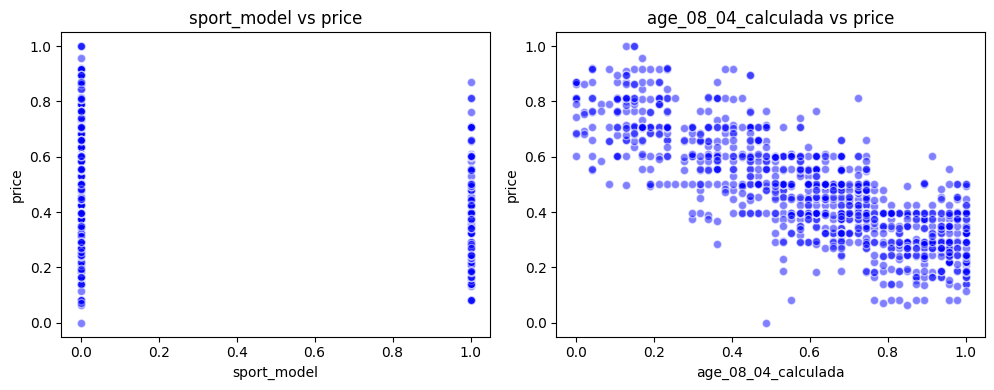

In [314]:
df_filtered_normalizado = df_filtered_normalizado[mask_km]

histogram_por_lotes(df_filtered_normalizado)
boxplots_por_lotes(df_filtered_normalizado)
scatter_por_lotes(df_filtered_normalizado)





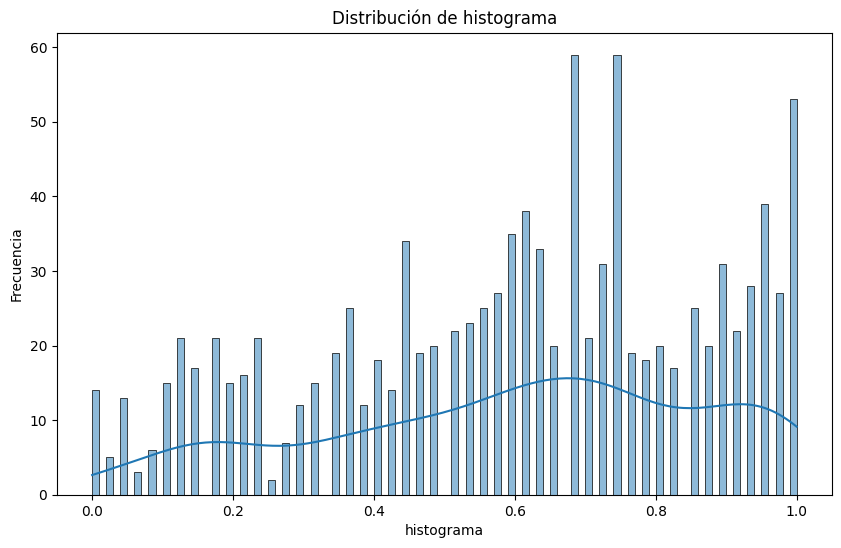

In [315]:
histogram(df_filtered_normalizado['age_08_04_calculada'],100)

In [316]:
df_filtered_normalizado.shape

(1076, 9)

Fold 1
R2 test: 0.7046
MSE: 867451.37
MAE: 723.59
MAPE (%): 7.86
RMSE: 931.37



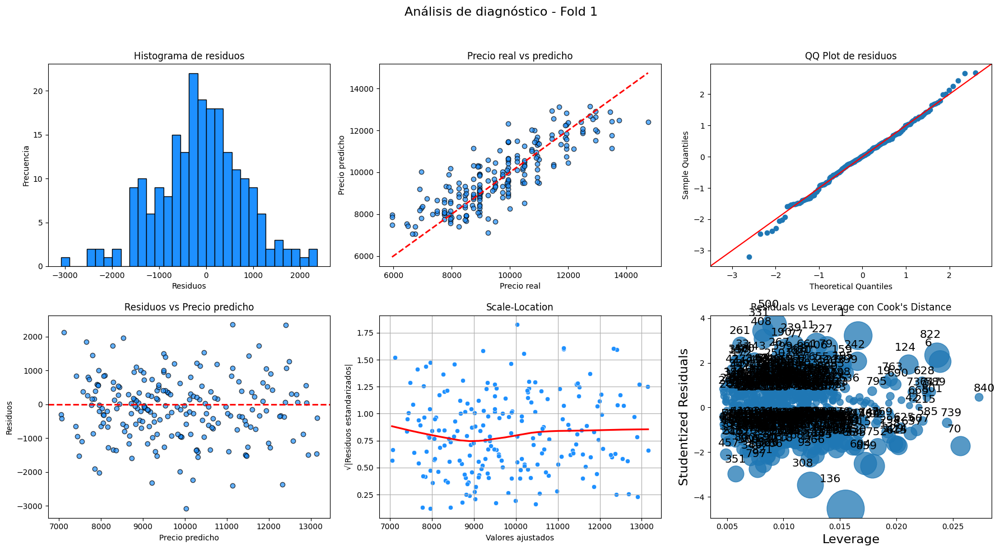

Fold 2
R2 test: 0.7197
MSE: 747972.75
MAE: 674.98
MAPE (%): 6.92
RMSE: 864.85



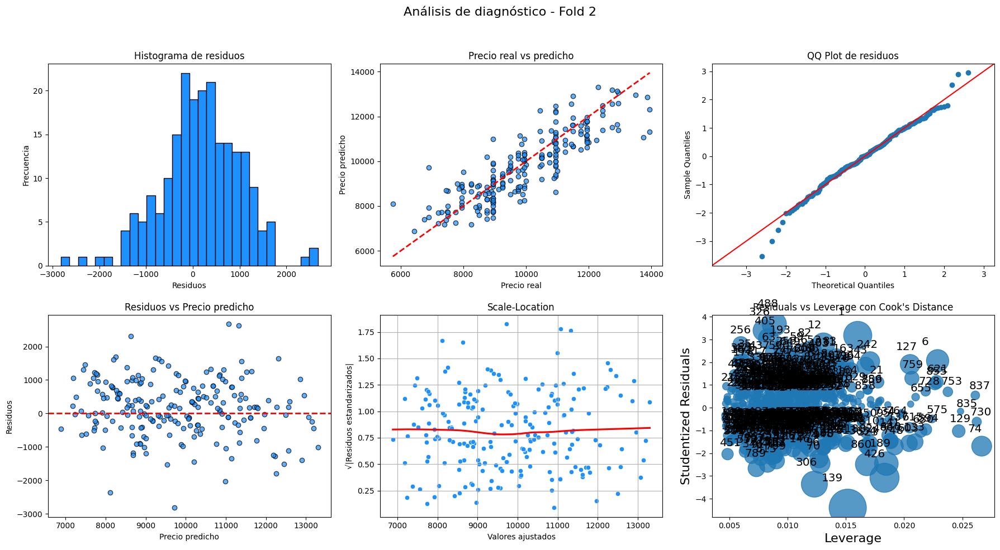

Fold 3
R2 test: 0.7214
MSE: 1020395.85
MAE: 796.65
MAPE (%): 7.96
RMSE: 1010.15



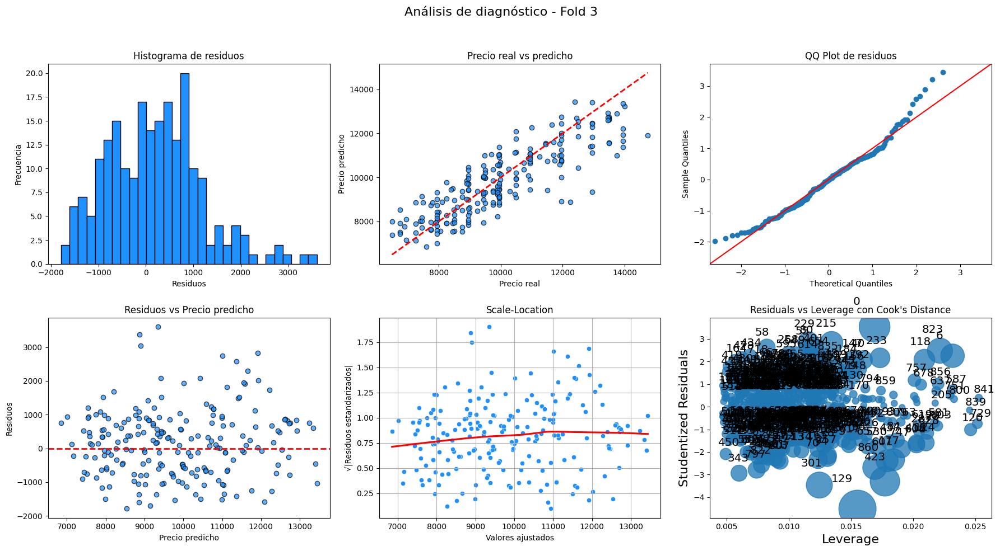

Fold 4
R2 test: 0.6967
MSE: 1049931.67
MAE: 819.25
MAPE (%): 8.94
RMSE: 1024.66



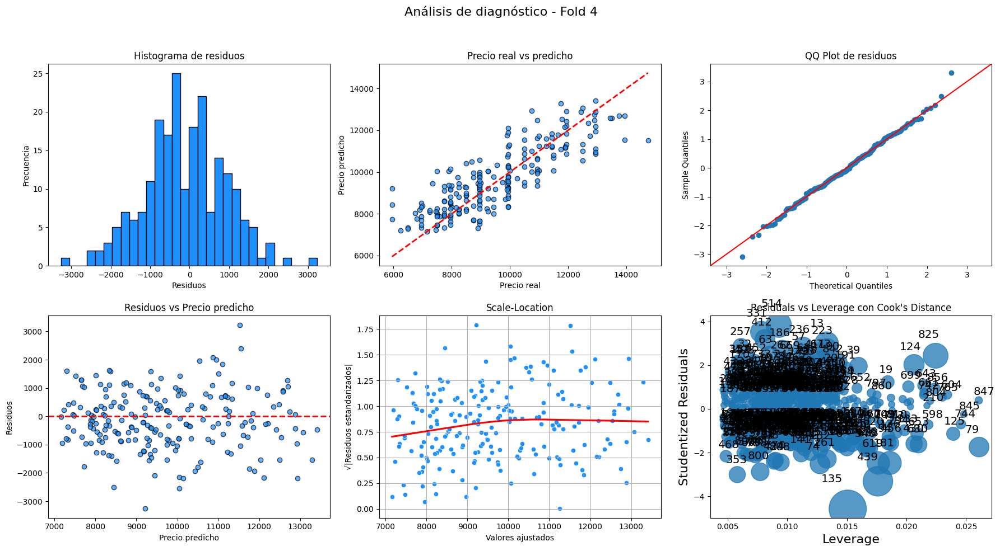

Fold 5
R2 test: 0.7042
MSE: 973225.70
MAE: 770.61
MAPE (%): 8.70
RMSE: 986.52



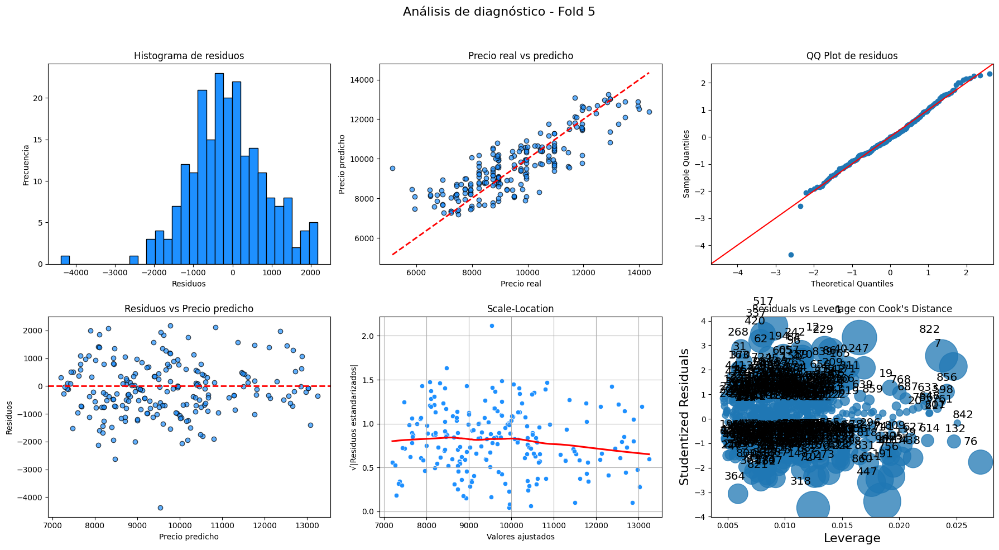

Promedios en los 5 folds:
R2 promedio: 0.7093
MSE promedio: 931795.47
MAE promedio: 757.02
MAPE promedio (%): 8.08
RMSE promedio: 963.51


In [317]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

X = df_filtered_normalizado.drop(columns=['price']).values
y = df_filtered_normalizado['price'].values

kf = KFold(n_splits=5, shuffle=True, random_state=42)

r2_list, mse_list, mae_list, mape_list, rmse_list = [], [], [], [], []

for fold, (train_index, test_index) in enumerate(kf.split(X)):
    print(f"Fold {fold + 1}")
    
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    X_train_const = sm.add_constant(X_train)
    X_test_const = sm.add_constant(X_test)
    
    model = sm.OLS(y_train, X_train_const).fit()
    y_pred = model.predict(X_test_const)

    y_pred_original = scaler_filtrado_normalizado.inverse_transform(y_pred.reshape(-1, 1)).ravel()
    y_test_original = scaler_filtrado_normalizado.inverse_transform(y_test.reshape(-1, 1)).ravel()
    
    mse = mean_squared_error(y_test_original, y_pred_original)
    mae = mean_absolute_error(y_test_original, y_pred_original)
    mape = mean_absolute_percentage_error(y_test_original, y_pred_original)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_original, y_pred_original)
    
    r2_list.append(r2)
    mse_list.append(mse)
    mae_list.append(mae)
    mape_list.append(mape)
    rmse_list.append(rmse)
    
    print(f"R2 test: {r2:.4f}")
    print(f"MSE: {mse:.2f}")
    print(f"MAE: {mae:.2f}")
    print(f"MAPE (%): {mape*100:.2f}")
    print(f"RMSE: {rmse:.2f}\n")
    
    residuos = y_test_original - y_pred_original
    standardized_residuals = residuos / np.std(residuos)
    sqrt_standardized_residuals = np.sqrt(np.abs(standardized_residuals))
    
    # Influence measures
    influence = model.get_influence()
    leverage = influence.hat_matrix_diag
    studentized_residuals = influence.resid_studentized_external
    cooks_d = influence.cooks_distance[0]
    p = model.df_model + 1
    
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f'Análisis de diagnóstico - Fold {fold + 1}', fontsize=16)
    
    # 1. Histograma de residuos
    axs[0, 0].hist(residuos, bins=30, color='dodgerblue', edgecolor='k')
    axs[0, 0].set_title('Histograma de residuos')
    axs[0, 0].set_xlabel('Residuos')
    axs[0, 0].set_ylabel('Frecuencia')
    
    # 2. Real vs Predicho
    axs[0, 1].scatter(y_test_original, y_pred_original, color='dodgerblue', alpha=0.7, edgecolors='k')
    axs[0, 1].plot([y_test_original.min(), y_test_original.max()], [y_test_original.min(), y_test_original.max()], 'r--', lw=2)
    axs[0, 1].set_title('Precio real vs predicho')
    axs[0, 1].set_xlabel('Precio real')
    axs[0, 1].set_ylabel('Precio predicho')
    
    # 3. QQ Plot de residuos
    sm.qqplot(residuos, line='45', fit=True, ax=axs[0, 2])
    axs[0, 2].set_title('QQ Plot de residuos')
    
    # 4. Residuos vs Predicho
    axs[1, 0].scatter(y_pred_original, residuos, color='dodgerblue', alpha=0.7, edgecolors='k')
    axs[1, 0].axhline(0, color='r', linestyle='--', lw=2)
    axs[1, 0].set_title('Residuos vs Precio predicho')
    axs[1, 0].set_xlabel('Precio predicho')
    axs[1, 0].set_ylabel('Residuos')
    
    # 5. Scale-Location plot
    sns.scatterplot(x=y_pred_original, y=sqrt_standardized_residuals, ax=axs[1, 1], color='dodgerblue')
    sns.regplot(x=y_pred_original, y=sqrt_standardized_residuals, scatter=False, ci=False, lowess=True, color='red', ax=axs[1, 1])
    axs[1, 1].set_title('Scale-Location')
    axs[1, 1].set_xlabel('Valores ajustados')
    axs[1, 1].set_ylabel('√|Residuos estandarizados|')
    axs[1, 1].grid(True)
    
    # 6. Residuals vs Leverage con Cook's Distance
    sm.graphics.influence_plot(model, ax=axs[1, 2], criterion="cooks", alpha=0.6, markerfacecolor='lightblue', marker='o', fontsize=8)
    axs[1, 2].set_title("Residuals vs Leverage con Cook's Distance")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

print("Promedios en los 5 folds:")
print(f"R2 promedio: {np.mean(r2_list):.4f}")
print(f"MSE promedio: {np.mean(mse_list):.2f}")
print(f"MAE promedio: {np.mean(mae_list):.2f}")
print(f"MAPE promedio (%): {np.mean(mape_list)*100:.2f}")
print(f"RMSE promedio: {np.mean(rmse_list):.2f}")


# SELECCION DE FEATURE CON RIDGE

In [319]:

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error

In [320]:
df_toyota_ridge = df_toyota_limpio.copy()



a la variable `fuel_type_encoded` la convertimos en variable dummmies 

In [321]:
dummies = pd.get_dummies(df_toyota_ridge['fuel_type_encoded'], prefix='fuel_type')

# Unir las dummies al DataFrame original
df_toyota_ridge = pd.concat([df_toyota_ridge, dummies], axis=1)

# Eliminar la columna original 'fuel_type_encoded'
df_toyota_ridge = df_toyota_ridge.drop('fuel_type_encoded', axis=1)

# Mostrar las primeras filas para verificar
print(df_toyota_ridge.head())

     price        km  met_color  mfr_guarantee  bovag_guarantee  abs  airco  \
0  11750.0  130062.0          1              0                1    1      1   
1  13250.0  123425.0          1              0                1    1      1   
2  11950.0  118217.0          1              0                1    1      1   
3  11900.0  110000.0          1              0                0    1      1   
4  14750.0  108847.0          1              0                1    1      1   

   cd_player  central_lock  radio  mistlamps  sport_model  backseat_divider  \
0          0             0      0          0            0                 1   
1          1             1      0          0            0                 1   
2          1             1      0          0            0                 1   
3          0             1      0          0            0                 0   
4          0             1      0          1            0                 1   

   metallic_rim  tow_bar  age_08_04_calculada  fue

## Ridge Coeficientes

**visualizacion de los coeficientes vs lambdas**

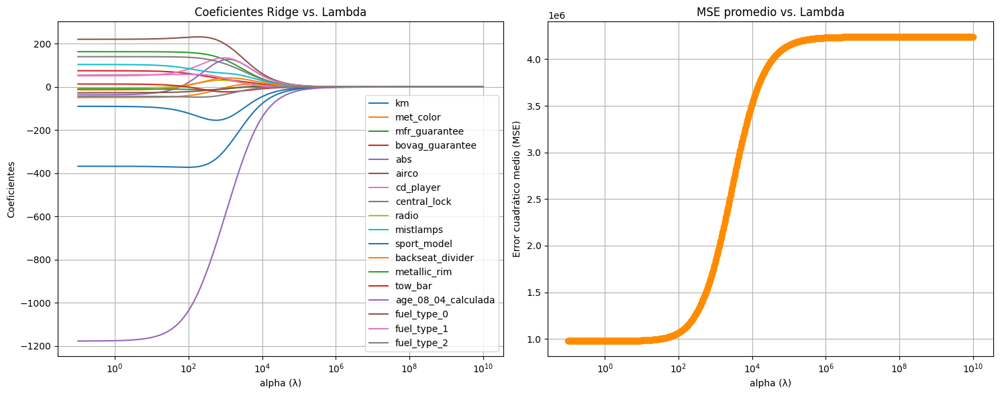

In [322]:

# Separar variables predictoras y variable objetivo
x = df_toyota_ridge.drop(columns=['price'])
y = df_toyota_ridge['price']

# Escalar las variables predictoras
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Generar valores de lambda (alpha)
lambdas = np.logspace(-1, 10, num=1000)
coefs = []
mse_scores = []


for alpha in lambdas:
    ridge = Ridge(alpha=alpha)
    ridge.fit(x_scaled, y)
    coefs.append(ridge.coef_)
    
    # Validación cruzada para obtener MSE promedio 
    neg_mse = cross_val_score(ridge, x_scaled, y, scoring='neg_mean_squared_error', cv=5)
    mse_scores.append(-neg_mse.mean())  # Hacemos positivo el MSE

coefs = np.array(coefs)

# Crear subplots: 1 fila, 2 columnas
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# --- Gráfico 1: Coeficientes vs Lambda ---
for i, column in enumerate(x.columns):
    axs[0].plot(lambdas, coefs[:, i], label=column)

axs[0].set_xscale("log")
axs[0].set_xlabel("alpha (λ)")
axs[0].set_ylabel("Coeficientes")
axs[0].set_title("Coeficientes Ridge vs. Lambda")
axs[0].legend(loc='best')
axs[0].grid(True)

# --- Gráfico 2: MSE vs Lambda ---
axs[1].plot(lambdas, mse_scores, marker='o', color='darkorange')
axs[1].set_xscale("log")
axs[1].set_xlabel("alpha (λ)")
axs[1].set_ylabel("Error cuadrático medio (MSE)")
axs[1].set_title("MSE promedio vs. Lambda")
axs[1].grid(True)

plt.tight_layout()
plt.show()


en la siguiente celda se elige el mejor aplha y se entrana el modelo con un  k-fold de 5

Mejor lambda (alpha): 0.1
MSE: 847409.7500
MAE: 730.0212
MAPE: 7.80%
R2: 0.7449
RMSE: 920.5486
               Variable  Coeficiente
0                    km  -353.565186
1             met_color   -50.489429
2         mfr_guarantee   141.822754
3       bovag_guarantee    76.893761
4                   abs   -60.176991
5                 airco   206.260269
6             cd_player    68.108101
7          central_lock   127.182465
8                 radio   -22.279312
9             mistlamps   121.302216
10          sport_model   -83.797455
11     backseat_divider   -19.270508
12         metallic_rim    -3.698315
13              tow_bar    21.449978
14  age_08_04_calculada -1208.368042
15          fuel_type_0   -37.758057
16          fuel_type_1    65.184517
17          fuel_type_2   -43.680752

Fold 1 - Primeras filas:
   Precio real  Precio predicho  Diferencia (Error)
0      10450.0     12688.750977        -2238.750977
1      13500.0     13127.927734          372.072266
2      12950.0     1

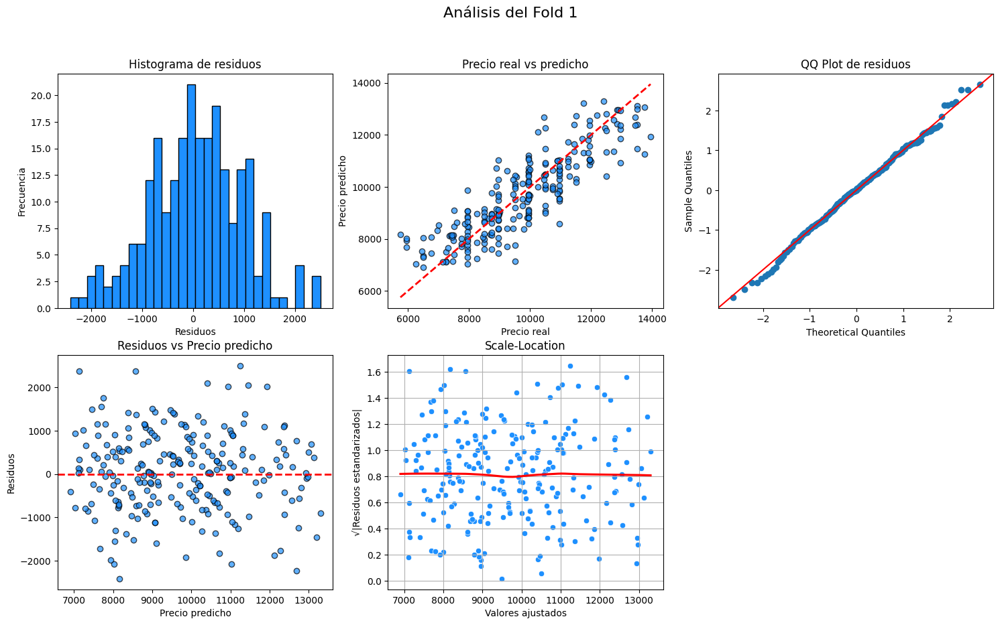

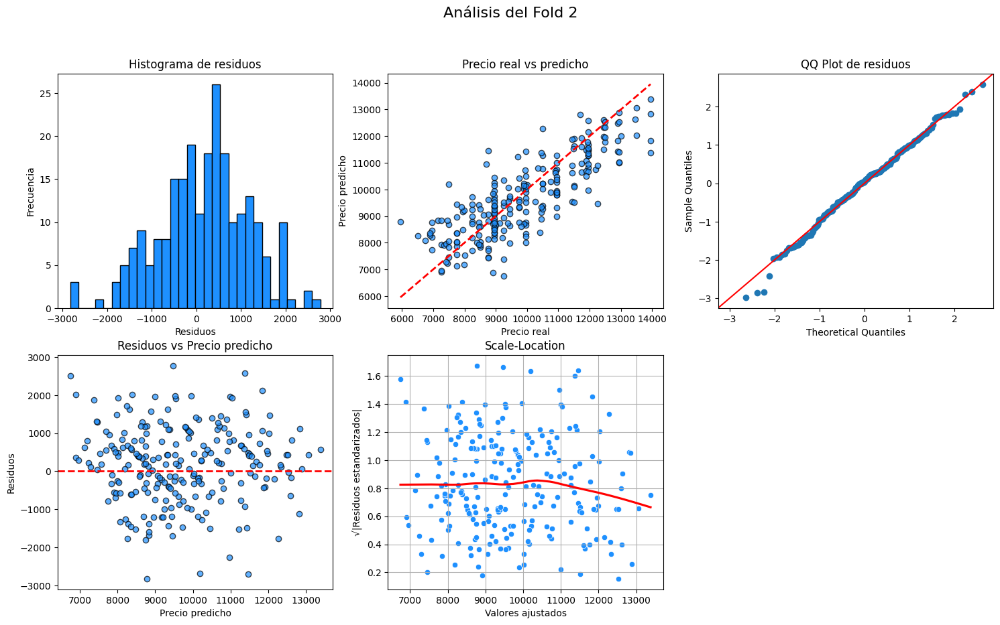

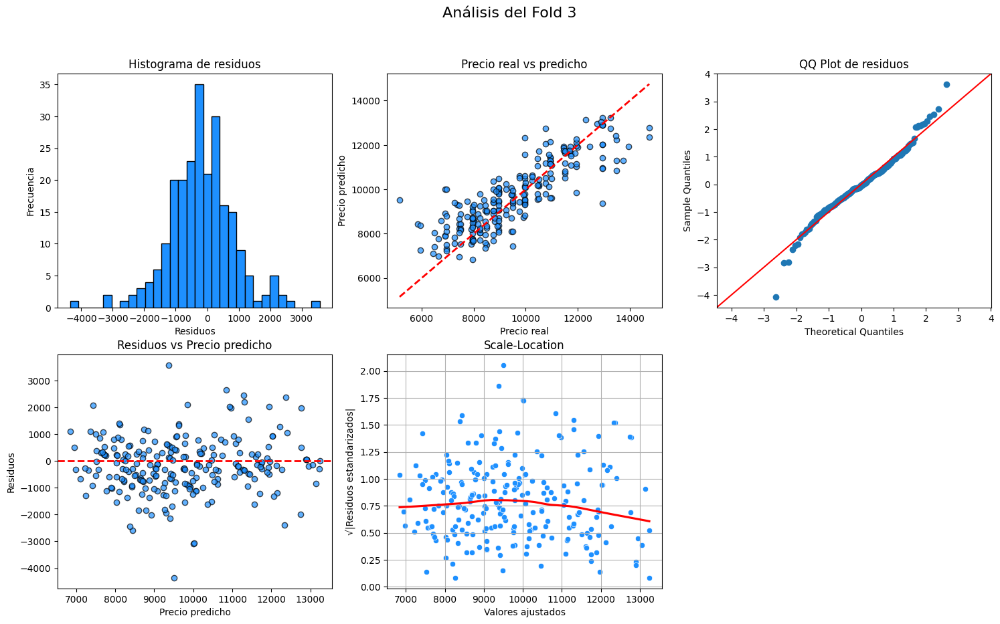

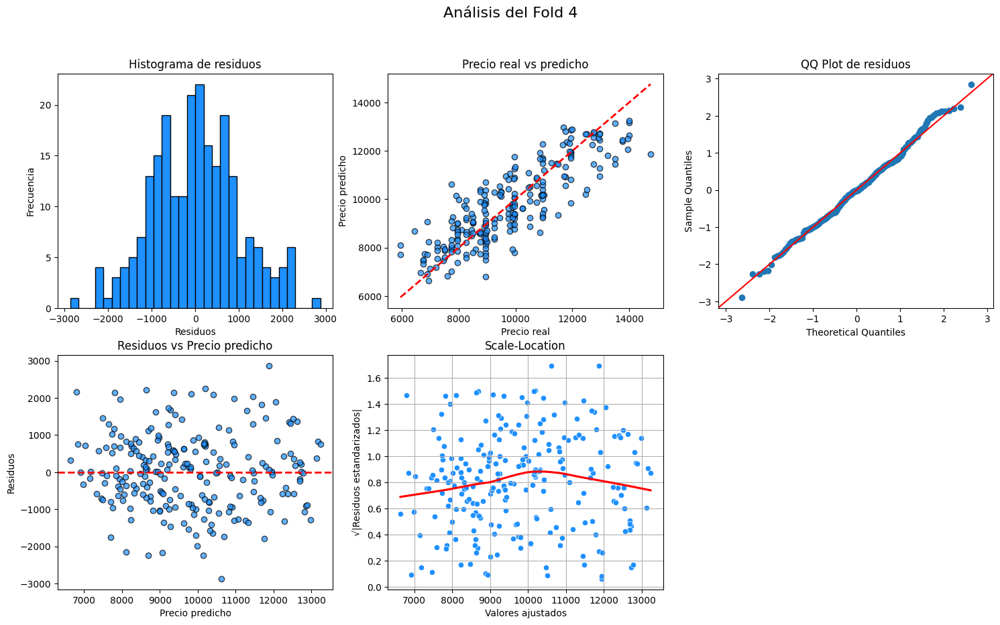

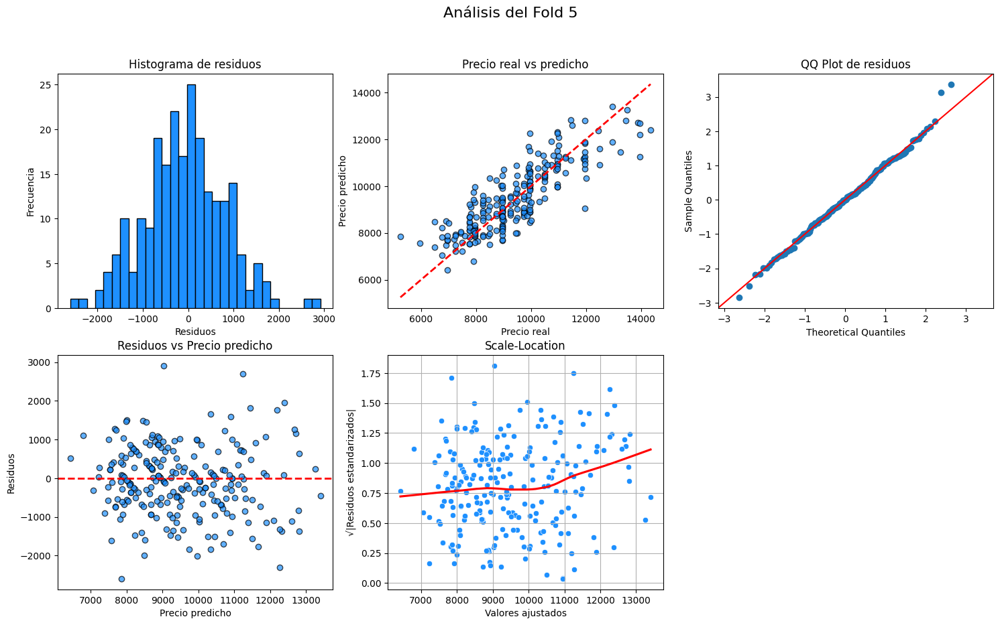

In [323]:

# Separar variables
x = df_toyota_ridge.drop(columns=['price'])
y = df_toyota_ridge['price']

# Escalado
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Buscar mejor alpha con RidgeCV
lambdas = np.logspace(-1, 10, num=1000)
ridge_cv = RidgeCV(alphas=lambdas, cv=5)
ridge_cv.fit(x_scaled, y)
best_alpha = ridge_cv.alpha_
print("Mejor lambda (alpha):", best_alpha)

# Validación con KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

fold = 1
mse_scores, mae_scores, mape_scores, r2_scores, rmse_scores = [], [], [], [], []

for train_index, test_index in kf.split(x_scaled):
    x_train, x_test = x_scaled[train_index], x_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    model = Ridge(alpha=best_alpha)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    # Guardar métricas
    mse_scores.append(mean_squared_error(y_test, y_pred))
    mae_scores.append(mean_absolute_error(y_test, y_pred))
    mape_scores.append(mean_absolute_percentage_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))
    rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    # mostrar mse , mae , mape , r2
    print(f"MSE: {mse_scores[-1]:.4f}")
    print(f"MAE: {mae_scores[-1]:.4f}")
    print(f"MAPE: {mape_scores[-1]*100:.2f}%")
    print(f"R2: {r2_scores[-1]:.4f}")
    print(f"RMSE: {rmse_scores[-1]:.4f}")
    # mostrar los coefientes y nombre de las variables
    coef_df = pd.DataFrame({
        'Variable': x.columns,
        'Coeficiente': model.coef_
    })
    print(coef_df)  

    # Crear DataFrame de comparación
    comparacion = pd.DataFrame({
        'Precio real': y_test.values,
        'Precio predicho': y_pred,
        'Diferencia (Error)': y_test.values - y_pred
    })

    print(f"\nFold {fold} - Primeras filas:")
    print(comparacion.head(5))
    comparacion.to_csv(f'archivo_fold_{fold}.txt', sep='\t', index=False)

    # Graficar
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f'Análisis del Fold {fold}', fontsize=16)

    resid = y_test - y_pred
    standardized_residuals = resid / np.std(resid)
    sqrt_standardized_residuals = np.sqrt(np.abs(standardized_residuals))

    # 1. Histograma residuos
    axs[0, 0].hist(resid, bins=30, color='dodgerblue', edgecolor='k')
    axs[0, 0].set_title('Histograma de residuos')
    axs[0, 0].set_xlabel('Residuos')
    axs[0, 0].set_ylabel('Frecuencia')

    # 2. Real vs predicho
    axs[0, 1].scatter(y_test, y_pred, color='dodgerblue', alpha=0.7, edgecolors='k')
    axs[0, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    axs[0, 1].set_title('Precio real vs predicho')
    axs[0, 1].set_xlabel('Precio real')
    axs[0, 1].set_ylabel('Precio predicho')

    # 3. QQ plot residuos
    sm.qqplot(resid, line='45', fit=True, ax=axs[0, 2])
    axs[0, 2].set_title('QQ Plot de residuos')

    # 4. Residuos vs predicho
    axs[1, 0].scatter(y_pred, resid, color='dodgerblue', alpha=0.7, edgecolors='k')
    axs[1, 0].axhline(0, color='r', linestyle='--', lw=2)
    axs[1, 0].set_title('Residuos vs Precio predicho')
    axs[1, 0].set_xlabel('Precio predicho')
    axs[1, 0].set_ylabel('Residuos')

    # 5. Scale-Location plot
    sns.scatterplot(x=y_pred, y=sqrt_standardized_residuals, ax=axs[1, 1], color='dodgerblue')
    sns.regplot(x=y_pred, y=sqrt_standardized_residuals, scatter=False, ci=False, lowess=True, color='red', ax=axs[1, 1])
    axs[1, 1].set_title('Scale-Location')
    axs[1, 1].set_xlabel('Valores ajustados')
    axs[1, 1].set_ylabel('√|Residuos estandarizados|')
    axs[1, 1].grid(True)

    # 6. Residuals vs Leverage con Cook's Distance
    # apagaa el grafico
    axs[1, 2].axis('off')
    
    

    fold += 1

# Mostrar métricas promedio
print("\n--- Resultados promedio en test (K-Fold) ---")
print(f"MAE:  {np.mean(mae_scores):.2f}")
print(f"MSE:  {np.mean(mse_scores):.2f}")
print(f"MAPE: {np.mean(mape_scores)*100:.2f}%")
print(f"R2:   {np.mean(r2_scores):.4f}")
print(f"R2:   {np.mean(r2_scores):.4f}")


# Seleccion feature con lasso

In [324]:
df_toyota_lasso = df_toyota_limpio.copy()

df_toyota_lasso.columns


Index(['price', 'km', 'met_color', 'mfr_guarantee', 'bovag_guarantee', 'abs',
       'airco', 'cd_player', 'central_lock', 'radio', 'mistlamps',
       'sport_model', 'backseat_divider', 'metallic_rim', 'tow_bar',
       'age_08_04_calculada', 'fuel_type_encoded'],
      dtype='object')

In [325]:
dummies = pd.get_dummies(df_toyota_lasso['fuel_type_encoded'], prefix='fuel_type')

# Unir las dummies al DataFrame original
df_toyota_lasso = pd.concat([df_toyota_lasso, dummies], axis=1)

# Eliminar la columna original 'fuel_type_encoded'
df_toyota_lasso = df_toyota_lasso.drop('fuel_type_encoded', axis=1)

# Mostrar las primeras filas para verificar
print(df_toyota_lasso.head())

     price        km  met_color  mfr_guarantee  bovag_guarantee  abs  airco  \
0  11750.0  130062.0          1              0                1    1      1   
1  13250.0  123425.0          1              0                1    1      1   
2  11950.0  118217.0          1              0                1    1      1   
3  11900.0  110000.0          1              0                0    1      1   
4  14750.0  108847.0          1              0                1    1      1   

   cd_player  central_lock  radio  mistlamps  sport_model  backseat_divider  \
0          0             0      0          0            0                 1   
1          1             1      0          0            0                 1   
2          1             1      0          0            0                 1   
3          0             1      0          0            0                 0   
4          0             1      0          1            0                 1   

   metallic_rim  tow_bar  age_08_04_calculada  fue

se halla el mejor alpha y se eliminan las variables que lasso hace 0

Alpha óptimo encontrado por LassoCV: 10.890230


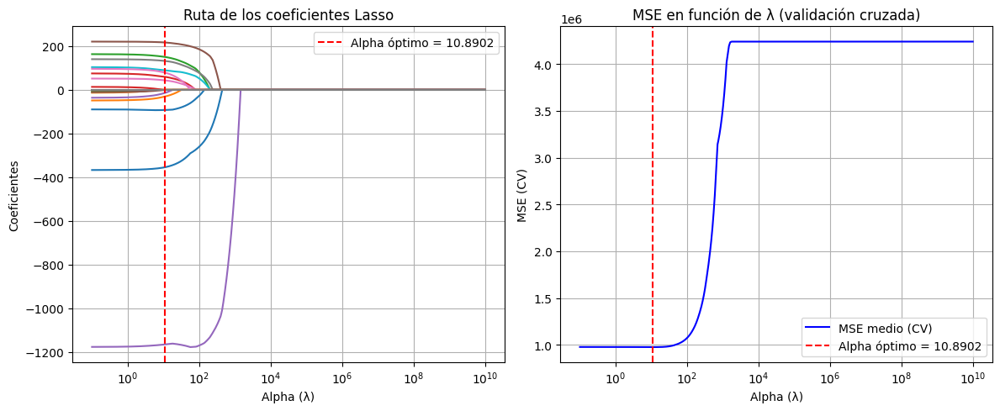

In [326]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import Lasso,LassoCV
from sklearn.preprocessing import StandardScaler

# Datos
X = df_toyota_lasso.drop(columns=['price'])
y = df_toyota_lasso['price']

# Escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Rango de alphas
alphas = np.logspace(-1, 10, 1000)

# Entrenar modelo LassoCV
lasso_cv_model = LassoCV(alphas=alphas, cv=5, random_state=42, max_iter=10000)
lasso_cv_model.fit(X_scaled, y)

# Mejor alpha
optimal_alpha = lasso_cv_model.alpha_
print(f"Alpha óptimo encontrado por LassoCV: {optimal_alpha:.6f}")

# --- GRÁFICA 1: Coeficientes vs Alphas ---
coefs = []

for a in alphas:
    lasso = Lasso(alpha=a, max_iter=10000)
    lasso.fit(X_scaled, y)
    coefs.append(lasso.coef_)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(alphas, coefs)
plt.xscale('log')
plt.xlabel('Alpha (λ)')
plt.ylabel('Coeficientes')
plt.title('Ruta de los coeficientes Lasso')
plt.axvline(optimal_alpha, color='red', linestyle='--', label=f'Alpha óptimo = {optimal_alpha:.4f}')
plt.legend()
plt.grid(True)

# --- GRÁFICA 2: MSE vs Alphas ---
plt.subplot(1, 2, 2)
mean_mse = np.mean(lasso_cv_model.mse_path_, axis=1)
plt.plot(lasso_cv_model.alphas_, mean_mse, color='blue', label='MSE medio (CV)')
plt.axvline(optimal_alpha, color='red', linestyle='--', label=f'Alpha óptimo = {optimal_alpha:.4f}')
plt.xscale('log')
plt.xlabel('Alpha (λ)')
plt.ylabel('MSE (CV)')
plt.title('MSE en función de λ (validación cruzada)')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [327]:
import numpy as np
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler


X = df_toyota_lasso.drop(columns=['price'])
y = df_toyota_lasso['price']


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


alphas = np.logspace(-1, 10, 1000)  


lasso_cv_model = LassoCV(alphas=alphas, cv=5, random_state=42, max_iter=10000)
lasso_cv_model.fit(X_scaled, y)


optimal_alpha = lasso_cv_model.alpha_
print(f"Alpha óptimo encontrado por LassoCV: {optimal_alpha:.6f}")
feature_names = X.columns

# Obtener coeficientes del modelo entrenado
coefficients = lasso_cv_model.coef_

# Crear DataFrame para visualización
coef_df = pd.DataFrame({
    'Variable': feature_names,
    'Coeficiente': coefficients
})

# Mostrar el resultado
print(coef_df)


Alpha óptimo encontrado por LassoCV: 10.890230
               Variable  Coeficiente
0                    km  -354.684418
1             met_color   -30.846622
2         mfr_guarantee   150.803528
3       bovag_guarantee    59.814442
4                   abs   -14.272031
5                 airco   217.004822
6             cd_player    43.560841
7          central_lock   132.355881
8                 radio    -0.000000
9             mistlamps    89.617317
10          sport_model   -92.255508
11     backseat_divider    -0.000000
12         metallic_rim    -0.000000
13              tow_bar     0.000000
14  age_08_04_calculada -1165.661255
15          fuel_type_0    -0.000000
16          fuel_type_1    79.053703
17          fuel_type_2    -0.000000


In [328]:
df_toyota_lasso.drop(columns=['fuel_type_0','fuel_type_2','tow_bar','metallic_rim','backseat_divider','radio',],inplace=True,axis=1)

Mejor lambda (alpha): 0.1
               Variable  Coeficiente
0                    km  -359.316986
1             met_color   -49.900127
2         mfr_guarantee   139.878433
3       bovag_guarantee    70.900322
4                   abs   -60.363674
5                 airco   207.383575
6             cd_player    70.211800
7          central_lock   126.443764
8             mistlamps   117.228729
9           sport_model   -89.795807
10  age_08_04_calculada -1197.082275
11          fuel_type_1   109.037933
MSE: 842595.5000
MAE: 725.1389
MAPE: 7.74%
R2: 0.7464
RMSE: 917.9300

Fold 1 - Primeras filas:
   Precio real  Precio predicho  Diferencia (Error)
0      10450.0     12679.289062        -2229.289062
1      13500.0     13185.384766          314.615234
2      12950.0     12216.013672          733.986328
3      13950.0     11922.707031         2027.292969
4      13500.0     13058.436523          441.563477
               Variable  Coeficiente
0                    km  -402.223389
1           

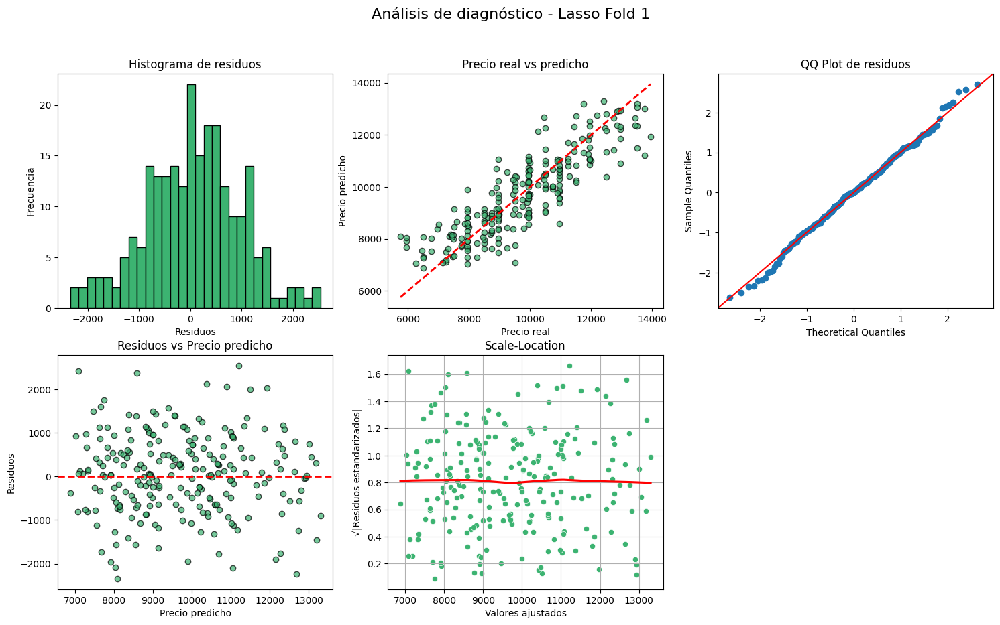

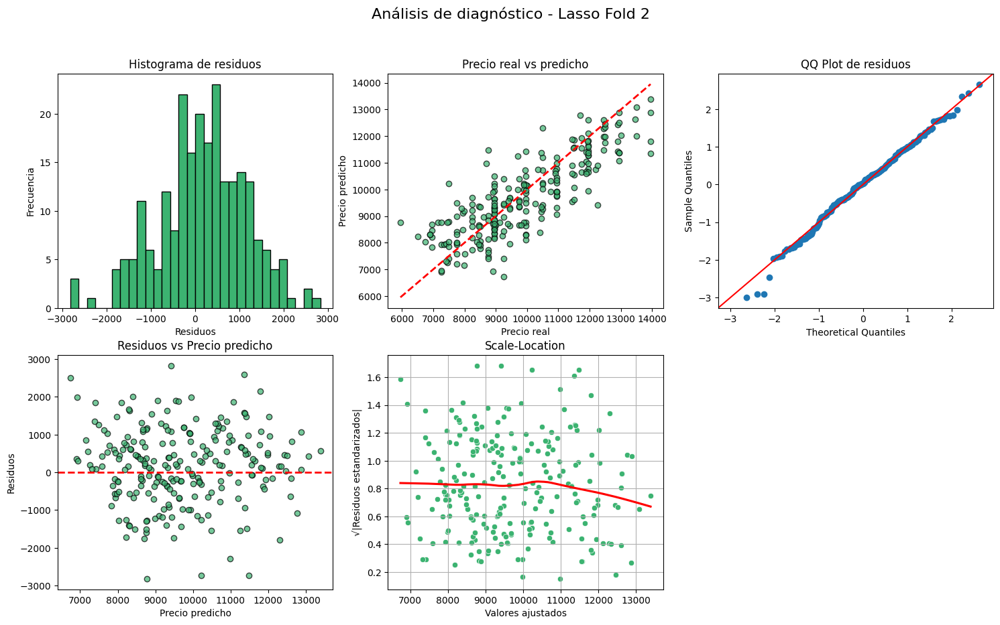

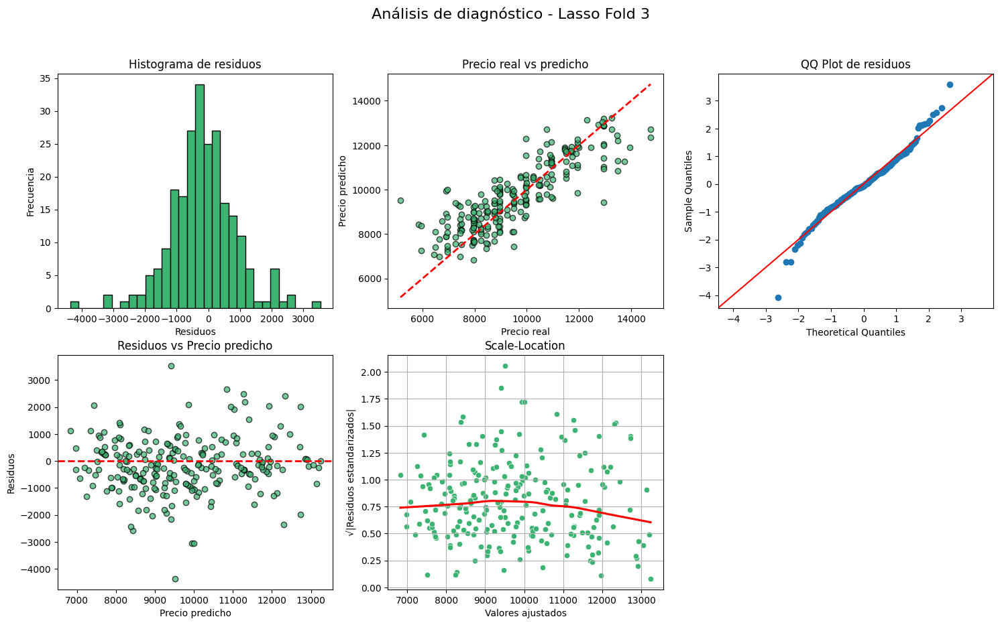

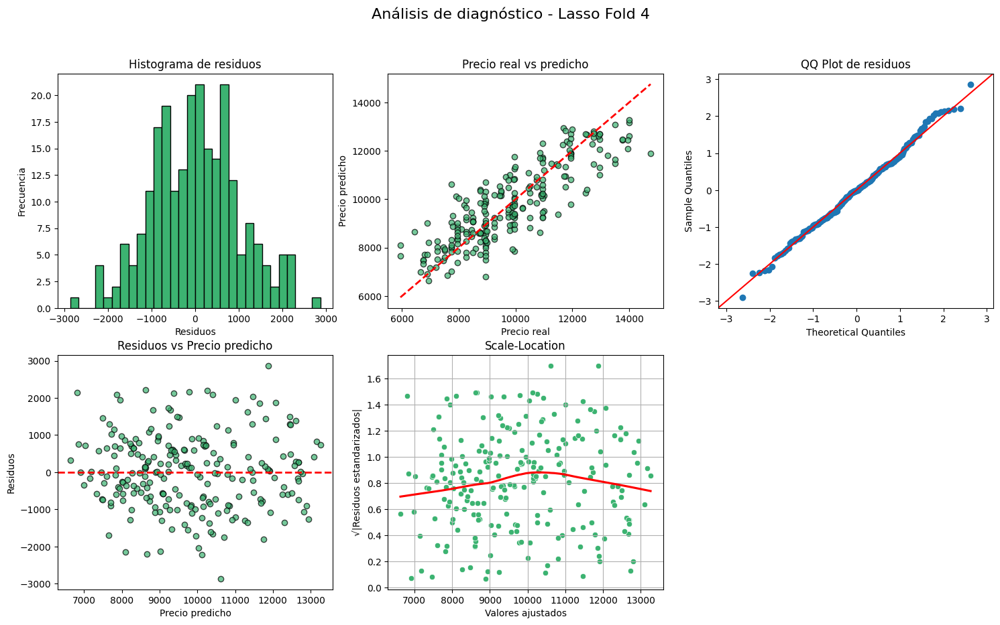

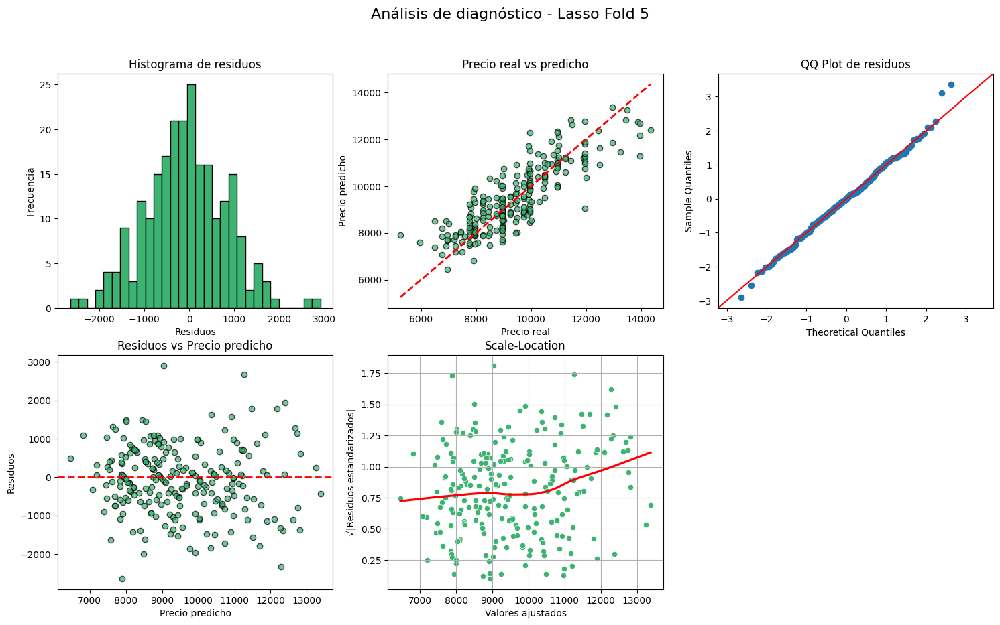

In [329]:

from sklearn.linear_model import LassoCV, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error

# Separar variables
x = df_toyota_lasso.drop(columns=['price'])
y = df_toyota_lasso['price']

# Escalado
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Buscar mejor alpha con LassoCV
lambdas = np.logspace(-1, 10, num=1000)
lasso_cv = LassoCV(alphas=lambdas, cv=5, random_state=42, max_iter=10000)
lasso_cv.fit(x_scaled, y)
best_alpha = lasso_cv.alpha_
print("Mejor lambda (alpha):", best_alpha)

# Validación con KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

fold = 1
mse_scores, mae_scores, mape_scores, r2_scores, rmse_scores = [], [], [], [], []

for train_index, test_index in kf.split(x_scaled):
    x_train, x_test = x_scaled[train_index], x_scaled[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    model = Lasso(alpha=best_alpha, max_iter=10000)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    # Guardar métricas
    mse_scores.append(mean_squared_error(y_test, y_pred))
    mae_scores.append(mean_absolute_error(y_test, y_pred))
    mape_scores.append(mean_absolute_percentage_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))
    rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    #mostrar un datadrame con el nombre de las variables y los coeficientes
    coef_df = pd.DataFrame({
        'Variable': x.columns,
        'Coeficiente': model.coef_
    })
    print(coef_df)
    # mostrar mse , mae , mape , r2
    print(f"MSE: {mse_scores[-1]:.4f}")
    print(f"MAE: {mae_scores[-1]:.4f}")
    print(f"MAPE: {mape_scores[-1]*100:.2f}%")
    print(f"R2: {r2_scores[-1]:.4f}")
    print(f"RMSE: {rmse_scores[-1]:.4f}")

    # Crear DataFrame de comparación
    comparacion = pd.DataFrame({
        'Precio real': y_test.values,
        'Precio predicho': y_pred,
        'Diferencia (Error)': y_test.values - y_pred
    })

    print(f"\nFold {fold} - Primeras filas:")
    print(comparacion.head(5))
    comparacion.to_csv(f'archivo_lasso_fold_{fold}.txt', sep='\t', index=False)

    # Calcular residuos y residuos estandarizados para los gráficos
    residuos = y_test - y_pred
    standardized_residuals = residuos / np.std(residuos)
    sqrt_standardized_residuals = np.sqrt(np.abs(standardized_residuals))

    # Crear figura y subplots 2x3
    fig, axs = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f'Análisis de diagnóstico - Lasso Fold {fold}', fontsize=16)

    # 1. Histograma de residuos
    axs[0, 0].hist(residuos, bins=30, color='mediumseagreen', edgecolor='k')
    axs[0, 0].set_title('Histograma de residuos')
    axs[0, 0].set_xlabel('Residuos')
    axs[0, 0].set_ylabel('Frecuencia')

    # 2. Real vs Predicho
    axs[0, 1].scatter(y_test, y_pred, color='mediumseagreen', alpha=0.7, edgecolors='k')
    axs[0, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    axs[0, 1].set_title('Precio real vs predicho')
    axs[0, 1].set_xlabel('Precio real')
    axs[0, 1].set_ylabel('Precio predicho')

    # 3. QQ Plot de residuos
    sm.qqplot(residuos, line='45', fit=True, ax=axs[0, 2])
    axs[0, 2].set_title('QQ Plot de residuos')

    # 4. Residuos vs Predicho
    axs[1, 0].scatter(y_pred, residuos, color='mediumseagreen', alpha=0.7, edgecolors='k')
    axs[1, 0].axhline(0, color='r', linestyle='--', lw=2)
    axs[1, 0].set_title('Residuos vs Precio predicho')
    axs[1, 0].set_xlabel('Precio predicho')
    axs[1, 0].set_ylabel('Residuos')

    # 5. Scale-Location plot
    sns.scatterplot(x=y_pred, y=sqrt_standardized_residuals, ax=axs[1, 1], color='mediumseagreen')
    sns.regplot(x=y_pred, y=sqrt_standardized_residuals, scatter=False, ci=False, lowess=True, color='red', ax=axs[1, 1])
    axs[1, 1].set_title('Scale-Location')
    axs[1, 1].set_xlabel('Valores ajustados')
    axs[1, 1].set_ylabel('√|Residuos estandarizados|')
    axs[1, 1].grid(True)

    # 6. Residuals vs Leverage con Cook's Distance
    # Nota: Lasso no tiene directamente leverage ni influencia estadística como OLS.
    # En lugar de esto, mostramos Residuals vs Predicho con marcadores para residuos grandes.
    # O bien, podemos mostrar un gráfico de coeficientes.
    axs[1, 2].axis('off')

    fold += 1

# Mostrar métricas promedio
print("\n--- Resultados promedio en test (K-Fold) ---")
print(f"MAE:  {np.mean(mae_scores):.2f}")
print(f"MSE:  {np.mean(mse_scores):.2f}")
print(f"MAPE: {np.mean(mape_scores)*100:.2f}%")
print(f"R2:   {np.mean(r2_scores):.4f}")


# PCA

In [330]:
df_toyota_pca=df_toyota_limpio.copy()

# ahcer dummies a fuel_type_encoded
df_toyota_pca=pd.get_dummies(df_toyota_pca,columns=['fuel_type_encoded'])  

df_toyota_pca.columns


Index(['price', 'km', 'met_color', 'mfr_guarantee', 'bovag_guarantee', 'abs',
       'airco', 'cd_player', 'central_lock', 'radio', 'mistlamps',
       'sport_model', 'backseat_divider', 'metallic_rim', 'tow_bar',
       'age_08_04_calculada', 'fuel_type_encoded_0', 'fuel_type_encoded_1',
       'fuel_type_encoded_2'],
      dtype='object')

Se calcula el numero optimo de componentes

Número óptimo de componentes para 95% varianza: 15


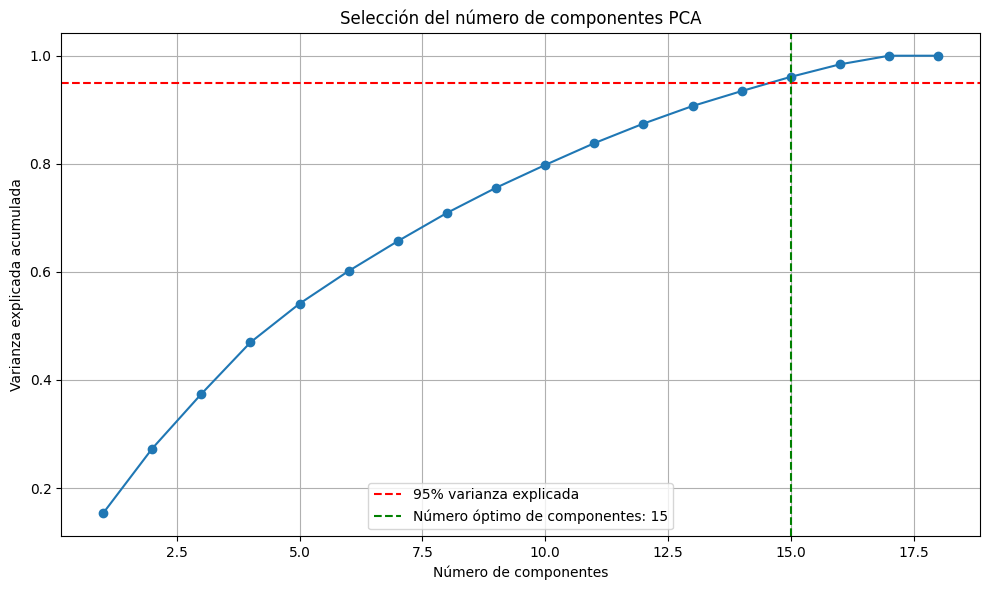

In [332]:
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Preparar X e y ---
X = df_toyota_pca.drop(columns=['price'])
y = df_toyota_pca['price']

# --- 2. Estandarizar X e y ---
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1)).flatten()

# --- 3. PCA: determinar n óptimo ---
pca_temp = PCA()
pca_temp.fit(X_scaled)
var_acumulada = np.cumsum(pca_temp.explained_variance_ratio_)
# Determinar número óptimo
n_componentes_optimos = np.argmax(var_acumulada >= 0.95) + 1
print(f"Número óptimo de componentes para 95% varianza: {n_componentes_optimos}")
# Graficar curva del codo y poner el número de componentes óptimo   

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(var_acumulada) + 1), var_acumulada, marker='o')
plt.axhline(y=0.95, color='red', linestyle='--', label='95% varianza explicada')
plt.axvline(x=n_componentes_optimos, color='green', linestyle='--', label=f'Número óptimo de componentes: {n_componentes_optimos}')
plt.xlabel("Número de componentes")
plt.ylabel("Varianza explicada acumulada")
plt.title("Selección del número de componentes PCA")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()





en entrena el modelo con el numero optimo de componentes que es 15

Fold 1
MSE: 910359.0518, R2: 0.7260, MAE: 753.1972, MAPE: 8.03%


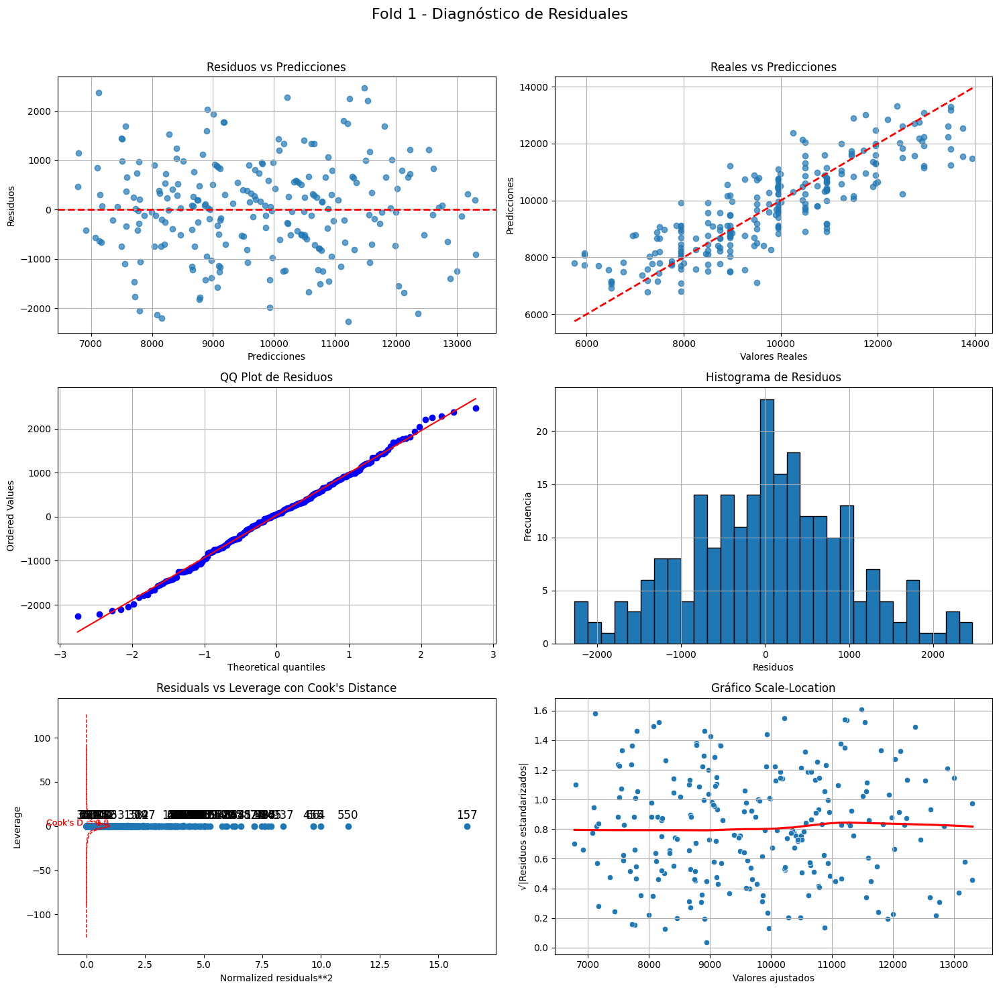

Fold 2
MSE: 1172735.2159, R2: 0.6243, MAE: 864.3813, MAPE: 9.09%


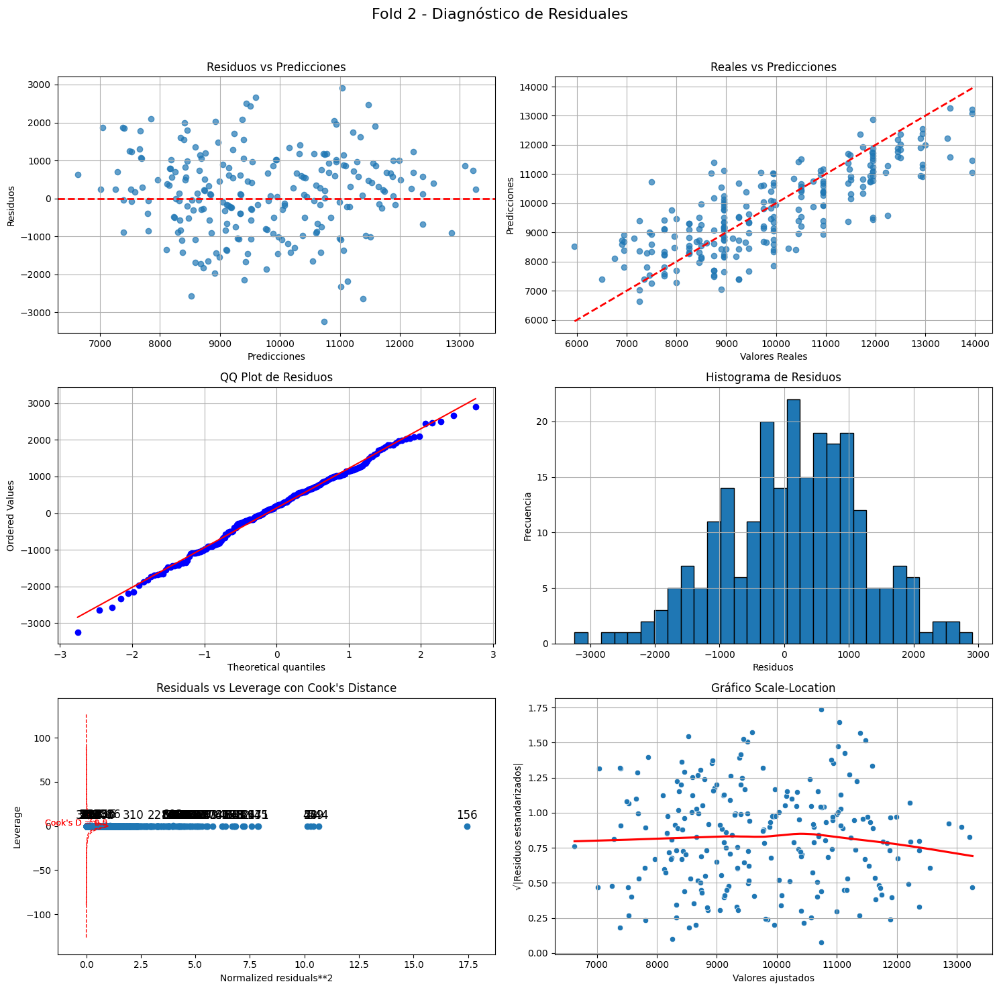

Fold 3
MSE: 1207039.3274, R2: 0.6703, MAE: 832.8171, MAPE: 9.34%


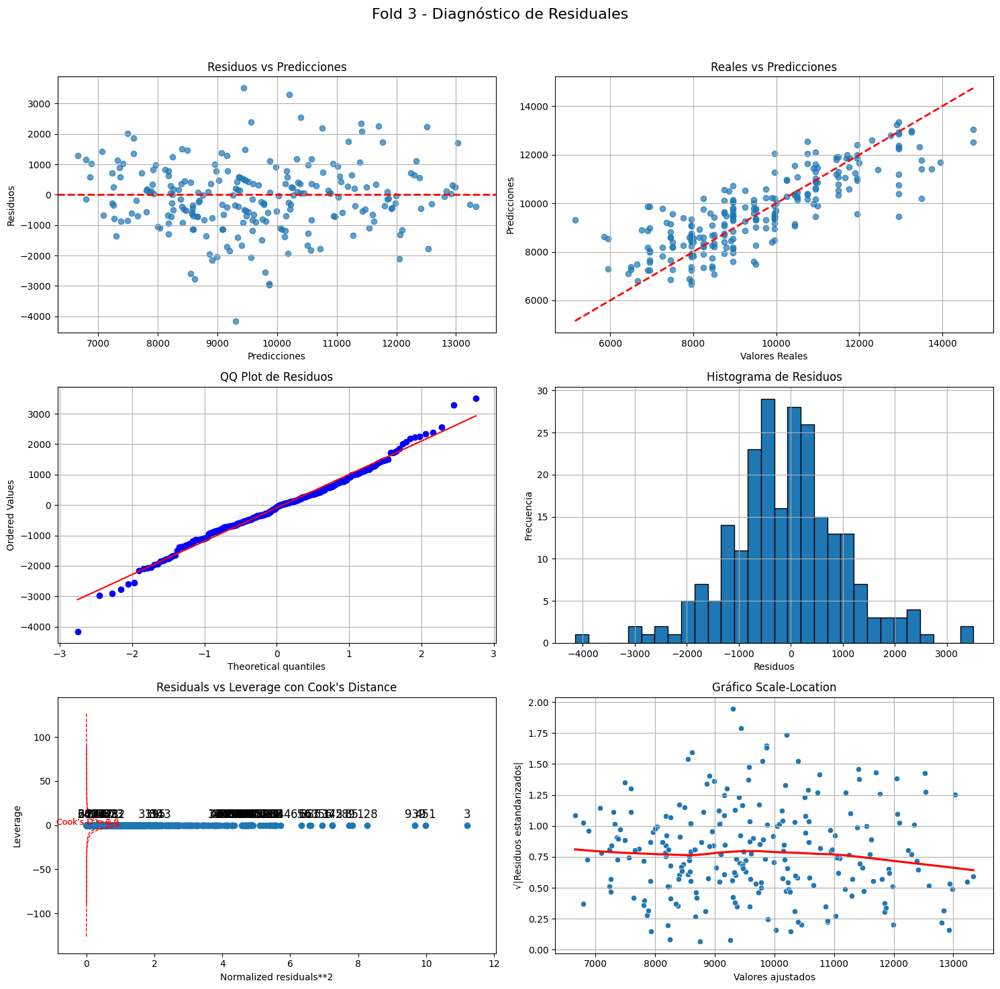

Fold 4
MSE: 1183037.2015, R2: 0.6643, MAE: 863.4804, MAPE: 9.05%


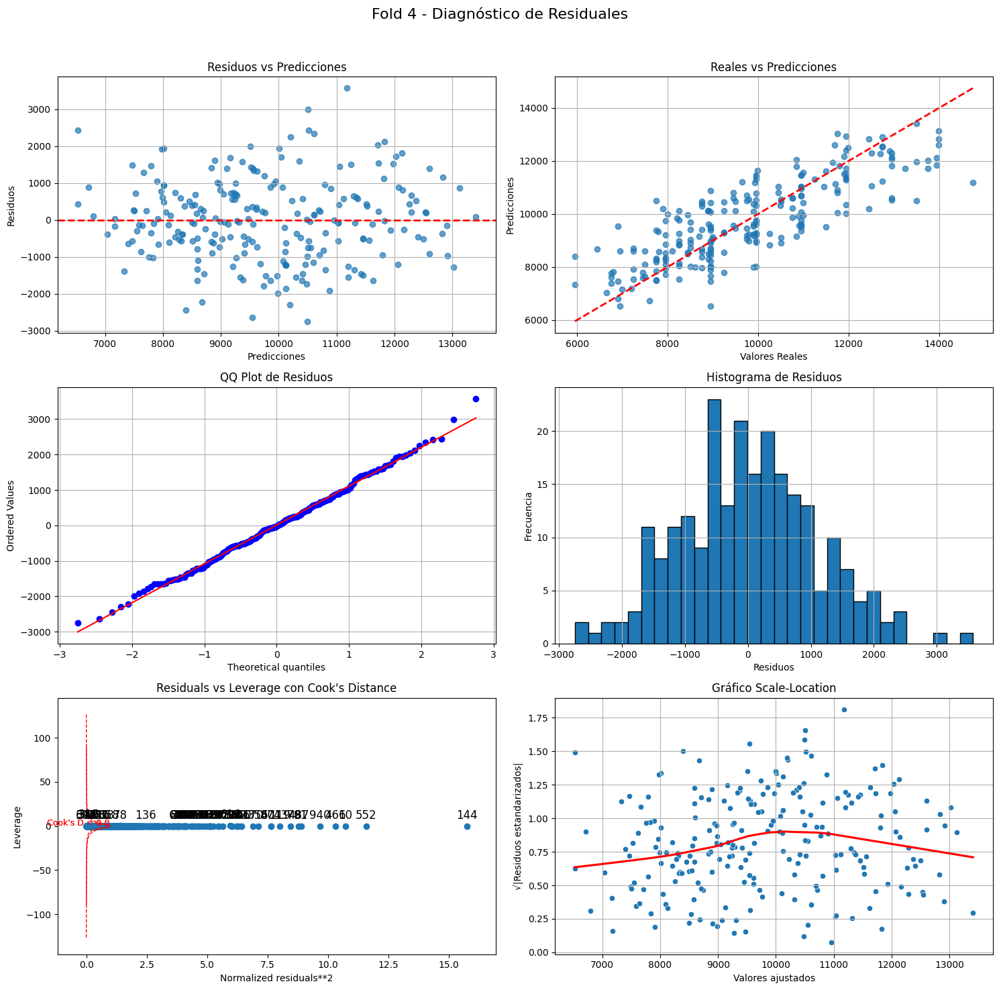

Fold 5
MSE: 1037429.9528, R2: 0.6148, MAE: 818.6886, MAPE: 8.98%


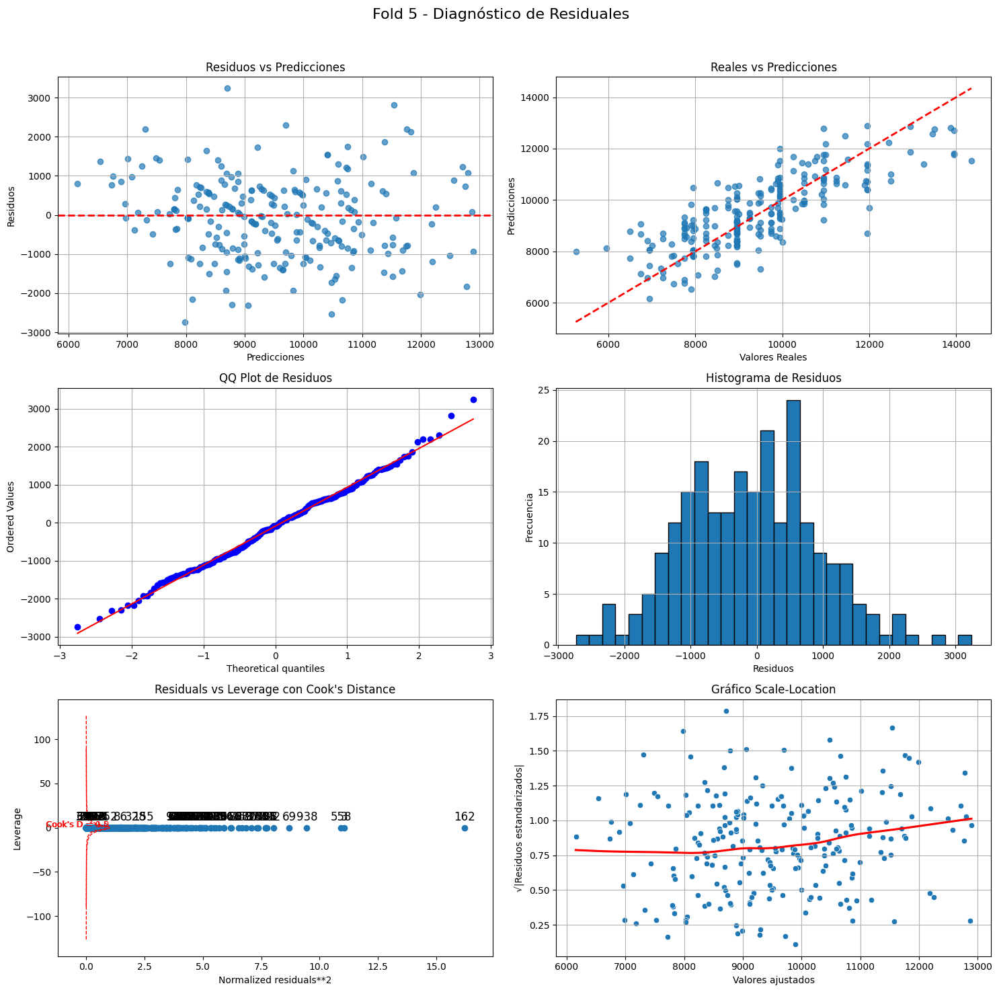


Métricas promedio en 5 folds:
R2 promedio: 0.6599
MSE promedio: 1102120.1499
MAE promedio: 826.5129
MAPE promedio (%): 8.90%


In [334]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from scipy import stats
from statsmodels.graphics.regressionplots import plot_leverage_resid2

# --- 1. Preparar X e y ---
X = df_toyota_pca.drop(columns=['price'])
y = df_toyota_pca['price']

# --- 2. Estandarizar X e y ---
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1)).flatten()

# --- 3. PCA ---
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_scaled)

# --- 4. KFold ---
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Listas para guardar métricas
r2_list, mse_list, mae_list, mape_list = [], [], [], []

for fold, (train_index, test_index) in enumerate(kf.split(X_pca), 1):
    print(f"Fold {fold}")

    X_train, X_test = X_pca[train_index], X_pca[test_index]
    y_train, y_test = y_scaled[train_index], y_scaled[test_index]

    # Agregar constante para statsmodels
    X_train_sm = sm.add_constant(X_train)
    X_test_sm = sm.add_constant(X_test)

    # Ajustar modelo OLS
    modelo_sm = sm.OLS(y_train, X_train_sm).fit()

    # Predicciones
    y_pred_scaled = modelo_sm.predict(X_test_sm)

    # Invertir escala para y_test y y_pred
    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
    y_test_inv = scaler_y.inverse_transform(y_test.reshape(-1, 1)).flatten()

    # Residuos
    residuos = y_test_inv - y_pred

    # Métricas
    mse = mean_squared_error(y_test_inv, y_pred)
    r2 = r2_score(y_test_inv, y_pred)
    mae = mean_absolute_error(y_test_inv, y_pred)
    mape = mean_absolute_percentage_error(y_test_inv, y_pred)

    r2_list.append(r2)
    mse_list.append(mse)
    mae_list.append(mae)
    mape_list.append(mape)

    print(f"MSE: {mse:.4f}, R2: {r2:.4f}, MAE: {mae:.4f}, MAPE: {mape*100:.2f}%")

    # --- Gráficos en una sola figura con subplots ---
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))
    fig.suptitle(f"Fold {fold} - Diagnóstico de Residuales", fontsize=16)

    # 1. Residuos vs Predicciones
    axs[0, 0].scatter(y_pred, residuos, alpha=0.7)
    axs[0, 0].axhline(0, color='r', linestyle='--', lw=2)
    axs[0, 0].set_xlabel("Predicciones")
    axs[0, 0].set_ylabel("Residuos")
    axs[0, 0].set_title("Residuos vs Predicciones")
    axs[0, 0].grid(True)

    # 2. Reales vs Predicciones
    axs[0, 1].scatter(y_test_inv, y_pred, alpha=0.7)
    limites = [min(y_test_inv.min(), y_pred.min()), max(y_test_inv.max(), y_pred.max())]
    axs[0, 1].plot(limites, limites, 'r--', lw=2)
    axs[0, 1].set_xlabel("Valores Reales")
    axs[0, 1].set_ylabel("Predicciones")
    axs[0, 1].set_title("Reales vs Predicciones")
    axs[0, 1].grid(True)

    # 3. QQ Plot de residuos
    stats.probplot(residuos, dist="norm", plot=axs[1, 0])
    axs[1, 0].set_title("QQ Plot de Residuos")
    axs[1, 0].grid(True)

    # 4. Histograma de residuos
    axs[1, 1].hist(residuos, bins=30, edgecolor='black')
    axs[1, 1].set_xlabel("Residuos")
    axs[1, 1].set_ylabel("Frecuencia")
    axs[1, 1].set_title("Histograma de Residuos")
    axs[1, 1].grid(True)

    # 5. Residuals vs Leverage con Cook's Distance
    # Este gráfico es un poco especial porque usa un gráfico externo,
    # así que creamos un subplot extra y pasamos el ax para que lo dibuje allí.
    ax_leverage = axs[2, 0]
    plot_leverage_resid2(modelo_sm, ax=ax_leverage)
    ax_leverage.set_title("Residuals vs Leverage con Cook's Distance")

    # Líneas Cook's distance
    influence = modelo_sm.get_influence()
    leverage_vals = np.linspace(0.001, 1, 100)
    p = modelo_sm.df_model + 1  # número de parámetros (incluyendo intercepto)

    for d in [0.5, 1.0]:
        bound = np.sqrt(d * p * (1 - leverage_vals) / leverage_vals)
        ax_leverage.plot(leverage_vals, bound, 'r--', lw=1)
        ax_leverage.plot(leverage_vals, -bound, 'r--', lw=1)
        ax_leverage.text(0.97, bound[-1] + 0.2, f"Cook's D = {d}", color='red', fontsize=9, ha='right')

    # 6. Scale-Location plot
    standardized_residuals = residuos / np.std(residuos)
    sqrt_standardized_residuals = np.sqrt(np.abs(standardized_residuals))

    ax_scale_loc = axs[2, 1]
    sns.scatterplot(x=y_pred, y=sqrt_standardized_residuals, ax=ax_scale_loc)
    sns.regplot(x=y_pred, y=sqrt_standardized_residuals, scatter=False, ci=False, lowess=True, color='red', ax=ax_scale_loc)
    ax_scale_loc.set_xlabel('Valores ajustados')
    ax_scale_loc.set_ylabel('√|Residuos estandarizados|')
    ax_scale_loc.set_title('Gráfico Scale-Location')
    ax_scale_loc.grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # espacio para el título
    plt.show()

# --- Métricas promedio ---
print("\nMétricas promedio en 5 folds:")
print(f"R2 promedio: {np.mean(r2_list):.4f}")
print(f"MSE promedio: {np.mean(mse_list):.4f}")
print(f"MAE promedio: {np.mean(mae_list):.4f}")
print(f"MAPE promedio (%): {np.mean(mape_list)*100:.2f}%")


# CONCLUSIONES 

En este experimento se compararon cuatro modelos de regresión para evaluar su desempeño en la predicción del conjunto de datos: regresión lineal simple, regresión Ridge, regresión Lasso y regresión con reducción de dimensionalidad mediante componentes principales (PCA). La evaluación se realizó utilizando validación cruzada *k*-fold con *k=5*, promediando las métricas de error para obtener una medida robusta del rendimiento de cada modelo.

Los resultados indican que el modelo de **regresión lineal simple** obtuvo el mejor desempeño en términos de MSE, MAE, MAPE y R2 promedio, superando a las variantes con regularización (Ridge y Lasso) y al modelo basado en componentes principales.

| Modelo                 | MSE promedio | MAE promedio | MAPE promedio (%) | RMSE promedio | Número de variables utilizadas | Cantidad de ocurrencias del dataset |
|------------------------|--------------|--------------|-------------------|---------------|-------------------------------|------------------------|
| Regresión Lineal Simple | 927426         | 754         | 8.05               | 961          | 8                            | 1076                    |
| Regresión Ridge         | 956795         | 762         | 8.21               | 977         | 18                            | 1117                    |
| Regresión Lasso         | 945694         | 757         | 8.1               | 971          | 12                             | 1117                    |
| PCA + Regresión         | 1101488         | 824         | 8.88               | 1049          | 15 (componentes principales)   | 1117                    |

*Notas:*  
- **MSE promedio:** promedio del error cuadrático medio calculado en validación cruzada 5-fold.  
- **MAE promedio:** promedio del error absoluto medio calculado en validación cruzada 5-fold.  
- **MAPE promedio:** promedio del error porcentual absoluto medio calculado en validación cruzada 5-fold.  
- **RMSE promedio:** promedio de la raíz del error cuadrático medio calculado en validación cruzada 5-fold.  
- **Número de variables utilizadas:** cantidad de variables independientes consideradas por cada modelo.  
- **Cantidad de ocurrencias:** tamaño del conjunto de datos o número de observaciones usadas para entrenar y validar los modelos.


Para cada modelo se consideraron las siguientes variables independientes:

- **Regresión Lineal Simple:**  
  Se utilizaron las 8 variables originales seleccionadas por su relevancia en el análisis exploratorio y dominio del problema. Estas variables fueron:  
  `km, age_08_04_calculada, abs, airco, cd_player, sport_model, central_lock, mfr_guarante`  
 

- **Regresión Ridge:**  
  Se incluyeron las 18 variables disponibles en el dataset, sin realizar selección previa. Estas variables fueron:  
  `km, age_08_04_calculada, abs, airco, radio, tow_bar, cd_player , sport_model , mistlamps ,central_lock , matallic_rim, mfr_guarante, bovag_guarante, backseat_divider, fuel_type_1 , met_color`  
  

- **Regresión Lasso:**  
  Se inició con las mismas 12 variables que en Ridge, pero Lasso realizó selección automática y redujo el conjunto a 12 variables. Las variables seleccionadas fueron:  
  `km, age_08_04_calculada, abs, airco, cd_player , sport_model , mistlamps ,central_lock , mfr_guarante, bovag_guarante, , fuel_type_1 , met_color`   
  

- **PCA + Regresión:**  
  Se aplicó reducción dimensional sobre las 18 variables originales, obteniendo 15 componentes principales que resumen la mayor parte de la variabilidad del dataset. Los componentes principales no tienen nombres directos

Esta diferenciación en la selección y transformación de variables afecta directamente la complejidad y el rendimiento de cada modelo, como se refleja en las métricas evaluadas.


## Analisis

1. **Regresión Lineal Simple**  
   - **Mejor desempeño general:** Tiene el menor MSE (927426), MAE (754), MAPE (8.05%) y RMSE (961) entre todos los modelos.  
   - **Número de variables más reducido:** Usa solo 8 variables, el conjunto más pequeño entre todos.  
   - **Mayor cantidad de datos:** Entrenado y validado con 1070 ocurrencias, ligeramente más que los otros modelos. Esto puede haber ayudado a su estabilidad y mejor ajuste.  
   - Estos resultados sugieren que el modelo lineal simple captura muy bien la relación entre variables y objetivo sin necesidad de más complejidad o regularización.

2. **Regresión Ridge**  
   - **Peor desempeño en error:** Presenta valores ligeramente superiores en todas las métricas, con un MSE de 956795 y un RMSE de 977.  
   - **Mayor número de variables usadas (18):** Esto indica que este modelo retuvo más variables, pero no logró mejorar la predicción respecto a la regresión simple.  
   - **Menor cantidad de datos (1117 ocurrencias):** Esto puede influir en una ligera degradación del rendimiento.  
   - Ridge aplica regularización L2 que puede ayudar en casos con multicolinealidad, pero en este caso no mejoró el rendimiento.

3. **Regresión Lasso**  
   - **Rendimiento intermedio:** El MSE (945694) y demás métricas están entre Ridge y regresión lineal simple.  
   - **Variables reducidas a 12:** Lasso realiza selección automática de variables, disminuyendo la complejidad pero sin superar el desempeño del modelo simple.  
   - **Cantidad de datos igual a Ridge:** 1117 observaciones, lo que puede explicar en parte la diferencia con regresión lineal simple.  
   - Esto indica que eliminar variables no relevantes no fue suficiente para mejorar la precisión en este caso.

4. **PCA + Regresión**  
   - **Peor desempeño entre los modelos:** MSE de 1101488, MAE de 824, MAPE de 8.88% y RMSE de 1049.  
   - **Reducción dimensional usando 15 componentes principales:** Esto simplifica la representación, pero parece que se pierde información importante para la predicción.  
   - **Cantidad de datos igual a Ridge y Lasso (1117):** Por lo que las diferencias no se deben a tamaño del conjunto.  
   - Esto sugiere que, para este conjunto de datos, la reducción de dimensionalidad mediante PCA no mejora la predicción y puede afectar negativamente la precisión.


- El mejor desempeño de la regresión lineal simple puede deberse a que el conjunto de datos presenta una relación lineal clara entre las variables independientes y la variable dependiente, lo cual facilita que un modelo sin penalización capture eficazmente la tendencia.

- Los modelos con regularización (Ridge y Lasso) aplican una penalización que puede estar sobrejustando el modelo, especialmente si hay una fuerte multicolinealidad en los datos. en el de la regresion simple se realizo lo posible para evitar la multicolinealidad

- El modelo basado en PCA reduce la dimensionalidad del conjunto de datos, lo que podría eliminar información relevante necesaria para la predicción, explicando su menor rendimiento o tal vez el conjunto de datos que se le proprocione sufren de alguna fuerte colinealidad por lo que ese hecho hace que se pierda mucha informacion.



## Recomendaciones y consideraciones futuras




- **Seguir trabajando y afinando los modelos de regularización y reducción dimensional**, ya que con un ajuste adecuado de sus parámetros y un mejor preprocesamiento podrían superar al modelo de regresión lineal simple y aportar beneficios adicionales, como reducción de sobreajuste y mejora en interpretabilidad.
